In [1]:
#import warnings
#warnings.filterwarnings("ignore", category=RuntimeWarning)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import tensorflow as tf

#import logging
#tf.get_logger().setLevel(logging.ERROR)

from collections import Counter
from random import choices
from datetime import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import auc

from tensorflow.keras import Model
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Dense, Dropout, LeakyReLU, BatchNormalization, Concatenate
from tensorflow.keras.models import load_model

from helpers.base import PrioritizedExperienceReplay
from helpers.hydro import Helpers
from helpers.data import Data

/usr/lib/python3/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
# Color map
c_map = ['#2CBDFE', '#47DBCD', '#F3A0F2', 'yellow', '#661D98', '#F5B14C', 'm', 'k']
# Define scaler
scaler = StandardScaler()
# Get data
test_len = 98
X_train, X_test, train, test, data = Data().data(test_len)
print('X_train shape:', X_train.shape)
print('X_test shape:', X_test.shape)
print('train shape:', train.shape)
print('test shape:', test.shape)

X_train shape: (1315, 16)
X_test shape: (98, 16)
train shape: (1315, 36)
test shape: (98, 36)


## pcell_basic implementation notes

#### Data

* Placed all preprocessing of data in a library. No probs.

#### Step

* **price:** question is what price to use. Leaning towards the newly aquaired average price rather than the closing. One reason is that this better reflects the reality of the actual trading that we assume will happen later on. We will go with avg. 
* I think only place that needs altering is step_1. Also, going to keep price_std / avgp_ in the feed so that we can sanity check the memory in this new setup.

#### Data augmentation

* Tuning down the random shuffle frequency to below 0.15. Rationale is that when the features get more, the larger the effect of shuffling them is. We still want the effect but we simply tune it down.
* The other settings look pretty fine. (-0.2, 0.2) on each sample. Keep an eye on this one though. It could be a bit high. 

#### AUC

* Sanity checked auc off campus, it is solid.

#### X2

* Putting x2b together with x2a and then normalizing them together. No one-hots.

#### s, s2 mechanihcs

* Did many improvements and sanity checks, including the price p_t. Now it all seem to run very nice.

In [6]:
class TDQN:
    '''Implements a TDQN-learning trader agent.'''
    
    def __init__(self,
                 episodes=10,
                 steps=200,
                 seq_len=12,
                 batchsize=12,
                 alpha=0.001,
                 decay_rate=0.9995,
                 gamma=0.99,
                 hidden=100,
                 init_cash=5,
                 print_rate=1,
                 num_a=2,
                 mem_siz=100000,
                 filename='TDQN',
                 run=1,
                 save=False,
                 load=False,
                 get_output=True,
                 w_updates=500,
                 inf=True,
                 min_mem=0.01,
                 log_freq=50,
                 clip=1.,
                 auc_rate=False
                 
                 ):
        
        self.episodes = episodes
        self.steps = steps
        self.seq_len = seq_len
        self.batchsize = batchsize
        self.alpha = alpha
        self.decay_rate = decay_rate
        self.gamma = gamma
        self.hidden = hidden
        self.print_rate = print_rate
        self.init_cash = init_cash
        self.num_a = num_a
        assert self.num_a % 2 == 0, 'Please enter an even action space.'
        self.filename = filename
        self.run = str(run)
        self.save = save
        self.load = load
        self.get_output = get_output
        self.w_updates = w_updates
        self.inf = inf
        self.min_mem = min_mem
        self.log_freq = log_freq
        self.clip = clip
        self.auc_rate = auc_rate
        
        self.test1 = []
        self.test11 = []
        self.test22 = []
        self.test222 = []
        self.test2222 = []
        self.test321 = []
        self.test123 = []
        self.test999 = 0
        
        self.test = None
        self.cash = None
        self.stock_v = None
        self.stock_n = None
        
        self.train_inf = False
        self.tmp_x2a = np.linspace(-10000, 10000, 100).reshape(50, 2)
        self.env_start = None
        self.env_count = 1
        self.s_shape = X_train.shape[-1]
        self.memory_size = mem_siz
        #self.memory_size = int((self.episodes * self.steps) // 2)
        self.memory = PrioritizedExperienceReplay(self.memory_size, self.batchsize)
        self.helpers = Helpers(self.batchsize, self.num_a, self.seq_len)
        
    def reset_env(self, shift=False):
        '''Resets the environment.'''
        # reset the portfolio
        self.cash = self.init_cash
        self.stock_v = 0.
        self.stock_n = 0.
        self.env_count = 0
        # get x2
        x2a, x2b = self.get_x2()
        # test mode
        if self.test:
            self.env_start = 0
            s2 = X_test[self.env_start].reshape(1, self.s_shape)
            return [s2, x2a]
        # train mode
        if self.train_inf:
            self.env_start = np.random.randint(0, len(X_train) - (test_len + 1))
            s2 = X_train[self.env_start].reshape(1, self.s_shape)
            return [s2, x2a]
        else:
            self.env_start = np.random.randint(0, len(X_train) - (self.steps + 1))
        s2 = X_train[self.env_start]
        s2 = self.data_augmentation(s2, shift)
        s2 = s2.reshape(1, self.s_shape)
        return [s2, x2a]
    
    def data_augmentation(self, s2, shift):
        '''Adds a series of noice procedures to the input data.'''
        # add random noise
        s2 = s2 + np.random.uniform(-.2, .2)
        # randomize the order of features
        if np.random.random() < 0.15:
            np.random.shuffle(s2)
        # replace with a full random
        if np.random.random() < 0.01:
            s2 = np.random.randn(self.s_shape)
        # shift whatever we have with episodic value
        if shift:
            s2 = s2 + shift
        return s2
    
    def step_1(self, shift=False):
        '''Provides the current price, next step and terminal.'''
        t = False
        self.env_count += 1
        ind = self.env_start + self.env_count
        
        # test mode
        if self.test:
            s2 = X_test[ind].reshape(1, self.s_shape)
            p_t = test['avg_p'][ind - 1]
            return s2, t, p_t, True
        
        p_t = train['avg_p'][ind - 1]
        p_t_ = train['avgp__'][ind - 1]
        
        # train inf
        if self.train_inf:
            s2 = X_train[ind].reshape(1, self.s_shape)
            return s2, t, p_t, p_t_
        
        # train
        #### DATA AUGMENTATION ##########3
        s2 = X_train[ind]
        s2 = self.data_augmentation(s2, shift)
        s2 = s2.reshape(1, self.s_shape)

        if ind == (self.env_start + self.steps - 2):
            t = True
            return s2, t, p_t, p_t_
        return s2, t, p_t, p_t_
    
    def step_2(self, a, p_t):
        '''Computes the trade and updates the portfolio.'''
        C = 0.02 # trading costs
        portfolio_value = self.cash + self.stock_v
        sizer, position = self.helpers.position_sizer(a) 
        if position: # if long
            Q = np.floor((self.cash * sizer) / (p_t * (1 + C))) # measure up the long position
        else: # if short
            Q = -np.floor(self.stock_n * sizer) # measure up the short position
        cash = abs(self.cash - (Q * p_t) - (C * abs(Q))) # change in cash value
        stock_v = (self.stock_n + Q) * p_t # change in stock value
        stock_n = self.stock_n + Q # change in number of stock
        r = ((cash + stock_v) - portfolio_value) / portfolio_value # portfolio return as reward
        
        self.cash = cash
        self.stock_v = stock_v
        self.stock_n = stock_n
        x2a, x2b = self.get_x2()
        return r, x2a, x2b
    
    def per_targets(self, model, model_2, S, A, R, S2, T, is_w):
        '''Computes the per target term.'''
        q_nexts = model.predict(S2, batch_size=self.batchsize).squeeze()
        q_maxs = [np.argmax(q_nexts[i]) for i in range(self.batchsize)]
        t_nexts = model_2.predict(S2, batch_size=self.batchsize).squeeze()
        deltas = []
        for i in range(self.batchsize):
            r = R[i]
            t = T[i]
            if t:
                deltas.append(r)
            else:
                deltas.append(r + (self.gamma * t_nexts[i][q_maxs[i]]))
        targets = tmp = model.predict(S, batch_size=self.batchsize).squeeze()
        deltas2 = []
        for i in range(self.batchsize):
            targets[i, A[i]] = deltas[i]
            d = deltas[i] - tmp[i][A[i]]
            deltas2.append(0.5 * d ** 2 if abs(d) < 1.0 else abs(d) - 0.5)
        return targets, deltas2
    
    def policy(self, model, s, epsilon):
        '''Generates an action given a state.'''
        if np.random.random() < epsilon:
            action_preference = np.random.randint(0, self.num_a)
        else:
            q = model.predict(s, batch_size=self.batchsize).squeeze()
            max_a = []
            for i, j in enumerate(q):
                if j == np.amax(q):
                    max_a.append(i)
            ### Return random if list is nan
            if not max_a:
                action_preference = np.random.randint(0, self.num_a)
                return action_preference
            action_preference = np.random.choice(max_a)
        return action_preference
    
    def get_x2(self):
        'generates the x2 state online.'
        #tmp = np.concatenate((self.tmp_x2a, np.array(
            #[[self.cash, self.stock_v, self.stock_n]])), axis=0)
        tmp = np.array([[self.cash, self.stock_v, self.stock_n]]).reshape(-1, 1)
        x2a = scaler.fit_transform(tmp)
        x2b = np.zeros((60))
        #x2b[int(self.stock_n)] = 1.
        return x2a.reshape(1, 3), x2b.reshape(1, 60)
    
    def inference_train(self, model):
        '''Computes score on random train set snippet.'''
        self.train_inf = True
        s = self.reset_env()
        Actions = {i: 0 for i in range(self.num_a)}
        actions = []
        score = []
        start_tr = self.env_start
        stop_tr = start_tr + test_len
        for step in range(abs(start_tr - stop_tr) - 2):
            a = self.policy(model, s, epsilon=0)
            s2_x1, _, p_t, _ = self.step_1()
            r, x2a, x2b = self.step_2(a, p_t)
            s2 = [s2_x1, x2a]
            score.append(self.cash + self.stock_v)
            actions.append(a)
            s = s2
        for key in Counter(actions).keys():
            Actions[key] += Counter(actions)[key]
        bh = self.optimum(train['c_'].iloc[start_tr: stop_tr], self.init_cash)
        self.train_inf = False
        return score, bh, Actions, start_tr, stop_tr
        
    def inference_test(self, model):
        '''Computes score on test set.'''
        self.test = True
        Actions = {i: 0 for i in range(self.num_a)}
        actions = []
        s = self.reset_env()
        score = []
        for step in range(test_len - 2):
            a = self.policy(model, s, epsilon=0)
            s2_x1, _, p_t, _ = self.step_1()
            r, x2a, x2b = self.step_2(a, p_t)
            s2 = [s2_x1, x2a]
            score.append(self.cash + self.stock_v)
            actions.append(a)
            s = s2
        for key in Counter(actions).keys():
            Actions[key] += Counter(actions)[key]
        bh = self.optimum(test['c_'], self.init_cash)
        self.test = False
        return score, bh, Actions

    def inference_q_values_train(self, model):
        '''Computes action values on the random test snippet.'''
        self.train_inf = True
        Q_values = {i: [] for i in range(self.num_a)}
        s = self.reset_env()
        start_tr = self.env_start
        stop_tr = start_tr + test_len
        for step in range(abs(start_tr - stop_tr) - 2):
            a = self.policy(model, s, epsilon=0)
            s2_x1, _, p_t, _ = self.step_1()
            r, x2a, x2b = self.step_2(a, p_t)
            q_values = model.predict(s).squeeze()
            for ind, value in enumerate(q_values):
                Q_values[ind].append(value)
                for ind, value in enumerate(q_values):
                    Q_values[ind].append(value)
            s = [s2_x1, x2a]
        self.train_inf = False
        return Q_values

    def inference_q_values_test(self, model):
        '''Computes action values on the test set.'''
        self.test = True
        Q_values = {i: [] for i in range(self.num_a)}
        s = self.reset_env()
        for step in range(test_len - 2):
            a = self.policy(model, s, epsilon=0)
            s2_x1, _, p_t, _ = self.step_1()
            r, x2a, x2b = self.step_2(a, p_t)
            q_values = model.predict(s).squeeze()
            for ind, value in enumerate(q_values):
                Q_values[ind].append(value)
                for ind, value in enumerate(q_values):
                    Q_values[ind].append(value)
            s = [s2_x1, x2a]
        self.test = False
        return Q_values

    def inference(self, model, auc_only=False):
        '''Runs inference on trained model.'''
        # score inference
        score_tr, bh_tr, A_tr, start_tr, stop_tr = self.inference_train(model)
        score_te, bh_te, A_te = self.inference_test(model)
        # auc
        auc_tr = int(auc(np.arange(len(score_tr)), score_tr))
        auc_te = int(auc(np.arange(len(score_te)), score_te))
        if auc_only:
            return auc_tr, auc_te
        q_tr = self.inference_q_values_train(model)
        q_te = self.inference_q_values_test(model)
        return score_tr, score_te, bh_tr, bh_te, A_tr, A_te, q_tr, q_te, start_tr, stop_tr

    def optimum(self, bh_data, init_cash):
        '''returns all buy and optimum strategies for inference.'''
        bh = []
        count = init_cash
        for i in bh_data:
            count = count + (count * i)
            bh.append(count)
        return bh

    def plot_inference(self, train, test, start_tr, stop_tr, test_len, score_tr, score_te,
                       bh_tr, bh_te, A_tr, A_te, q_tr, q_te, filename, run, episode):
        # train inference ticks
        ticks_train = [i for i in range(0, test_len, test_len // 5)]
        dates_train = [train['date'].iloc[i] for i in range(
            start_tr, stop_tr, (abs(start_tr - stop_tr)) // 5)]
        # test inference ticks
        ticks_test = [i for i in range(0, test_len, test_len // 5 )]
        dates_test = [test['date'].iloc[i] for i in range(0, test_len, test_len // 5)]
        sns.set_style('darkgrid')
        fig = plt.figure(figsize=(13, 9))
        # train score
        plt.subplot(5, 1, 1)
        plt.plot(bh_tr, c_map[0], label='bh')
        plt.plot(score_tr, c_map[3], label='train')
        plt.xticks(ticks_train, dates_train)
        plt.legend(loc=('best'), frameon=False, ncol=2)
        # train q
        plt.subplot(5, 1, 2)
        for ind, values in enumerate(list(q_tr.values())):
            plt.plot(values, label='train q ' + str(ind))
        plt.xticks([])
        plt.legend(loc=('best'), frameon=False, ncol=self.num_a)
        # test score
        plt.subplot(5, 1, 3)
        plt.plot(bh_te, c_map[0], label='bh')
        plt.plot(score_te, c_map[2], label='test')
        plt.xticks(ticks_test, dates_test)
        plt.legend(loc=('best'), frameon=False, ncol=2)
        # test q
        plt.subplot(5, 1, 4)
        for ind, values in enumerate(list(q_te.values())):
            plt.plot(values, label='test q ' + str(ind))
        plt.xticks([])
        plt.legend(loc=('best'), frameon=False, ncol=self.num_a)
        # actions
        plt.subplot(5, 1, 5)
        width = 0.4
        plt.bar(np.arange(self.num_a), list(A_tr.values()), width)
        plt.bar(np.arange(self.num_a) + width, list(A_te.values()), width)
        plt.xticks([])
        plt.legend(('train, test'))
        # save plot
        dir_path = 'outputs/' + filename + str(run)
        file = '{}/test_' + str(episode) + '.png'
        self.helpers.mkdir_p(dir_path)
        plt.savefig(file.format(dir_path))
        plt.show()
        
    def unpack(self, transitions):
        '''Gets a batch from memory and slices it.'''
        S = [transitions[i][0] for i in range(self.batchsize)]
        A = np.array([transitions[i][1] for i in range(self.batchsize)])
        R = np.array([transitions[i][2] for i in range(self.batchsize)])
        S2 = [transitions[i][3] for i in range(self.batchsize)]
        T = np.array([transitions[i][4] for i in range(self.batchsize)])
        # stack respective input in S and S2
        x1_s, x1_s2 = S[0][0], S2[0][0]
        x2a_s, x2a_s2 = S[0][1], S2[0][1]
        #x2b_s, x2b_s2 = S[0][2], S2[0][2]
        for i, j in zip(S[1:], S2[1:]):
            x1_s, x1_s2 = np.concatenate((x1_s, i[0])), np.concatenate((x1_s2, j[0]))
            x2a_s, x2a_s2 = np.concatenate((x2a_s, i[1])), np.concatenate((x2a_s2, j[1]))
            #x2b_s, x2b_s2 = np.concatenate((x2b_s, i[2])), np.concatenate((x2b_s2, j[2]))
        S, S2 = [x1_s, x2a_s], [x1_s2, x2a_s2]
        return S, A, R, S2, T
    
    def train(self):
        '''Trains selected RL agent.'''
        epsilon = 1
        if self.load:
            epsilon = 0.1
        delta = 1
        Actions = {i: 0 for i in range(self.num_a)}
        dists = {'cash': [], 'stock_v': [], 'stock_n': []}
        P_value = []
        avg_loss = []
        avg_c = []
        avg_v = []
        avg_n = []
        p_value = []
        # area under curve metric
        auc_best = 0
        
        # define loss and optimizer objects
        loss_object = tf.keras.losses.Huber()
        optimizer = tf.keras.optimizers.Adam(learning_rate=self.alpha) #clipnorm=self.clip
        self.helpers.tensorboard_writer(logdir='logs/' + self.filename + str(self.run))
        
        # build model
        if self.load:
            model = load_model(
                'saved/' + self.filename + '/run/model_episode')
            model2 = load_model(
                'saved/' + self.filename + '/run/model2_episode')
            self.memory.sum_tree.data = np.load(
                'saved/' + self.filename + '/run/data episode.npy', 
                allow_pickle=True)
            self.get_output = False
        else:
            # X1 stream
            x1_in = Input(shape=(self.s_shape,))
            x1 = Dense(200)(x1_in)
            l1 = LeakyReLU()(x1)
            d1 = BatchNormalization()(l1)
            # X2a stream
            x2a_in = Input(shape=(3,))
            x2 = Dense(100)(x2a_in)
            l2 = LeakyReLU()(x2)
            d2 = BatchNormalization()(l2)
            # concatenate
            c = Concatenate()([d1, d2])
            # Layer 2
            h = Dense(200)(c)
            hl = LeakyReLU()(h)
            hd = BatchNormalization()(hl)
            # Output layer
            x_out = Dense(self.num_a, activation='linear')(hd)
            layer_outputs = [x1, x2, h, x_out,]
            model = Model([x1_in, x2a_in], x_out)
            model_2 = Model([x1_in, x2a_in], x_out)
            model.compile(optimizer=optimizer, loss=loss_object)
        self.testmodel = model
        self.testmodel2 = model_2
        
        # EPISODES
        for episode in range(self.episodes):
            # reset metrics
            actions = []
            temp_trans = []
            
            # data augment shift value
            shift = np.random.uniform(-0.25, 0.25)
            
            # reset environment
            s = self.reset_env(shift)
            
            # weight update
            if episode % self.w_updates == 0:
                weights = model.get_weights()
                model_2.set_weights(weights)
            # epsilon decay
            if epsilon > 0.1:
                epsilon = epsilon * self.decay_rate**episode
            else:
                epsilon = 0.1
            # STEPS
            for step in range(2500): # breaks when terminal
                # frame skipping
                #if step % 4 == 0: 
                a = self.policy(model, s, epsilon) 
                s2_x1, t, p_t, p_t_ = self.step_1(shift) 
                r, x2a, x2b = self.step_2(a, p_t)
                s2 = [s2_x1, x2a]
                # TRAINING
                if self.memory.len_memory() > (self.min_mem * self.memory_size):
                    # get transition
                    transitions, idxs, is_w = self.memory.sample_transition()
                    # unpack transition
                    S, A, R, S2, T = self.unpack(transitions)
                    # get targets
                    targets, deltas = self.per_targets(model, model_2, S, A, R, S2, T, is_w)
                    # optimize
                    loss = model.train_on_batch(x=S, y=targets, sample_weight=is_w)
                    # collect scalars
                    avg_loss.append(loss)
                avg_c.append(self.cash)
                avg_v.append(self.stock_v)
                avg_n.append(self.stock_n)
                p_value.append(self.cash + self.stock_v)
                actions.append(a)
                #### reward clipping #####
                if r > 0:
                    r = 1.
                elif r < 0:
                    r = -1.
                # store transition
                self.memory.store_transition(delta, (s, a, r, s2, t, p_t, p_t_))
                s = s2
                if t:
                    break   
            ############# tensorboard 1 ##########################
            if (episode + 1) % (self.episodes // self.log_freq) == 0:
                
                ###### test
                print('tensorboard')
                
                # compute gradients
                weights = model.trainable_weights
                grads = K.gradients(model.output, weights)
                f = K.function([model.input], grads)
                eval_grads = f([s])
                mean_eval_grads = np.mean([np.mean(g) for g in eval_grads])
                # write scalars to tensorboard
                self.helpers.tensorboard_scalar('loss', np.mean(avg_loss), episode)
                self.helpers.tensorboard_scalar('score', np.mean(p_value), episode)
                self.helpers.tensorboard_scalar('grads', mean_eval_grads, episode)
                # write gradient histograms to tensorboard
                for w, g in zip(weights, eval_grads):
                    self.helpers.tensorboard_hist(w.name + 'grads_', g, episode)
                # write weights to tensorboard
                for layer in model.layers[1:]:
                    for i, value in enumerate(layer.get_weights()):
                        tag = layer.weights[i].name
                        self.helpers.tensorboard_hist(tag, value, episode) 
                if self.get_output:
                    # write outputs to tensorboard
                    for i, layer_output in enumerate(layer_outputs):
                        output = Model([x1_in, x2a_in], layer_output).predict(s, batch_size=self.batchsize)
                        self.helpers.tensorboard_hist('layer_output/' + str(i), output, episode)
                # dists
                dists['cash'].append(np.mean(avg_c))
                dists['stock_v'].append(np.mean(avg_v))
                dists['stock_n'].append(np.mean(avg_n))
                P_value.append(np.mean(p_value))
                # actions
                for key in Counter(actions).keys():
                    Actions[key] += Counter(actions)[key]
                actions, avg_loss, p_value, avg_c, avg_v, avg_n, = [], [], [], [], [], []
            # AUC
            if self.auc_rate:
                if (episode + 1) % (self.episodes // self.auc_rate) == 0:
                    auc_tr, auc_te = self.inference(model, auc_only=True)
                    print('Episode:', episode + 1, ' AUC train:', auc_tr, ' AUC test:', auc_te,
                          ' AUC test high:', auc_best)
                    if auc_te > auc_best:
                        dir_path = 'saved/' + self.filename + '/' + str(self.run)
                        file_path_model = '{}/model_' + 'AUC_' + str(episode)
                        self.helpers.mkdir_p(dir_path)
                        model.save(file_path_model.format(dir_path))
                        print('AUC model saved')
                        auc_best = auc_te
            # PLOT
            if (episode + 1) % (self.episodes // self.print_rate) == 0:
                print(datetime.now())
                self.helpers.plot_train(episode, dists, P_value, Actions, self.filename, self.run)
                # inference
                if self.inf:
                    # inference
                    score_tr, score_te, bh_tr, bh_te, A_tr, A_te, q_tr, q_te, start_tr, stop_tr = self.inference(model)
                    # plot inference
                    self.plot_inference(train, test, start_tr, stop_tr, test_len, score_tr, score_te, bh_tr,
                                        bh_te, A_tr, A_te, q_tr, q_te, self.filename, self.run, episode)
                if self.save:
                    dir_path = 'saved/' + self.filename + '/' + str(self.run)
                    file_path_model = '{}/model_' + str(episode) 
                    file_path_model_2 = '{}/model2_' + str(episode) 
                    file_path_data = '{}/data' + str(episode)
                    self.helpers.mkdir_p(dir_path)
                    model.save(file_path_model.format(dir_path))
                    model_2.save(file_path_model_2.format(dir_path))
                    np.save(file_path_data.format(dir_path), self.memory.sum_tree.data)
        
    def train_multiple(self):
        '''Trains multiple variations of agents.'''
        run = 1
        # Run variables #  
        # Memory reset
        self.memory = PrioritizedExperienceReplay(self.memory_size, self.batchsize)
        ################
        self.train()
        K.clear_session()
        run += 1

## Notes:

* 

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
tensorboard


tensorboard
tensorboard
2020-09-29 14:11:45.754872
episode: 149


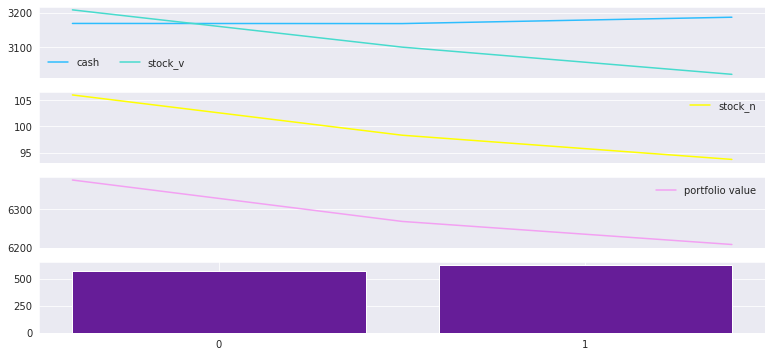

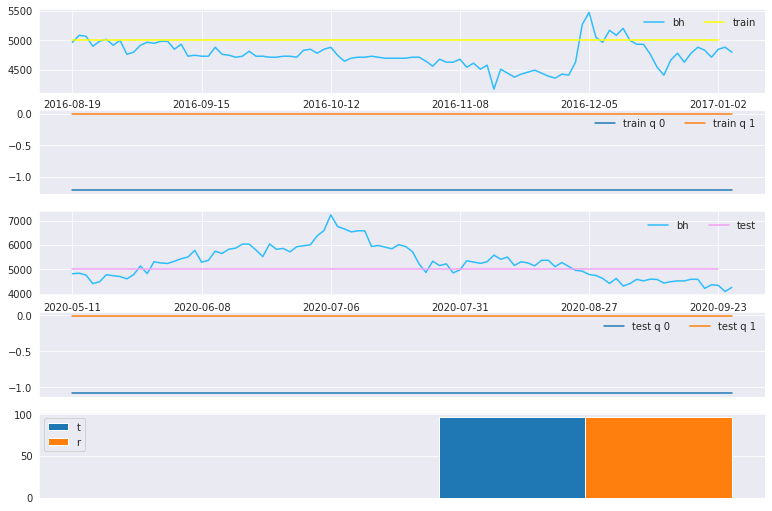

tensorboard
tensorboard
tensorboard
2020-09-29 14:21:55.297850
episode: 299


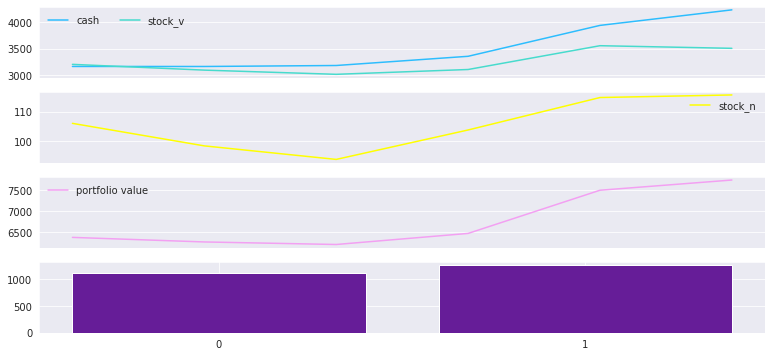

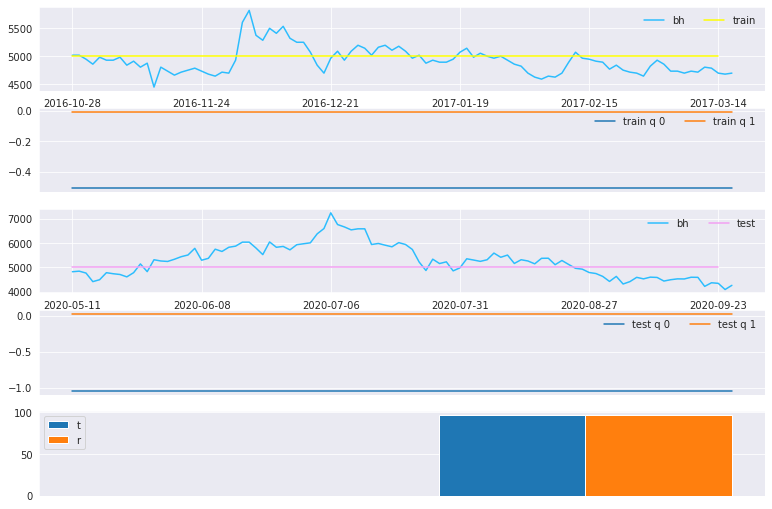

tensorboard
tensorboard
tensorboard
2020-09-29 14:32:42.176683
episode: 449


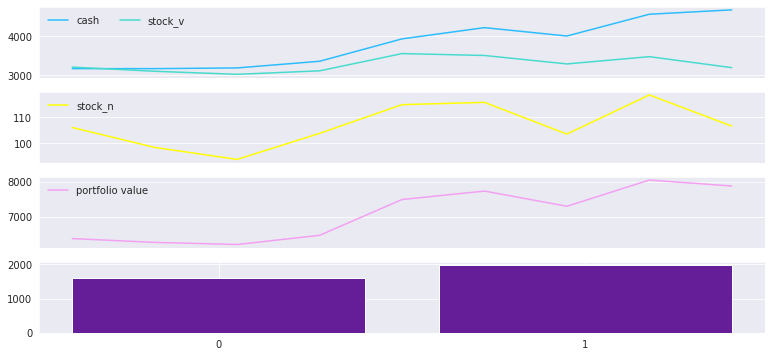

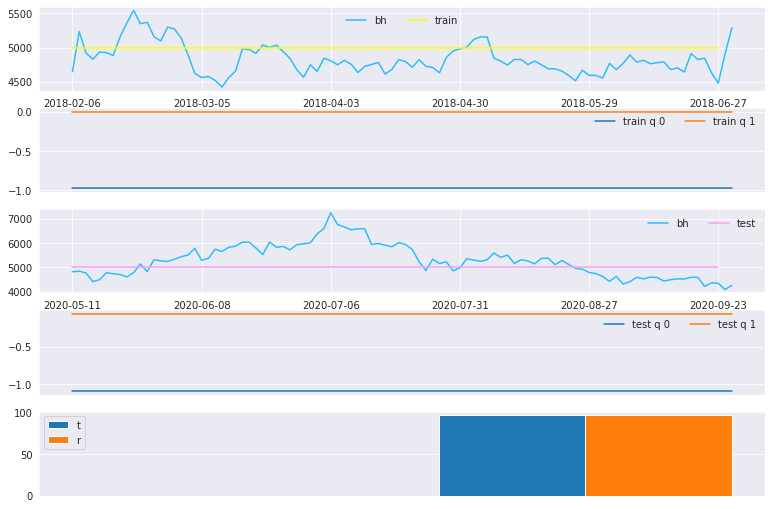

tensorboard
tensorboard
tensorboard
2020-09-29 14:43:30.382030
episode: 599


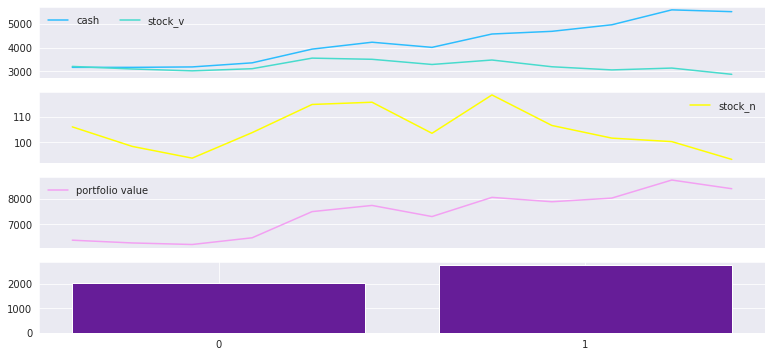

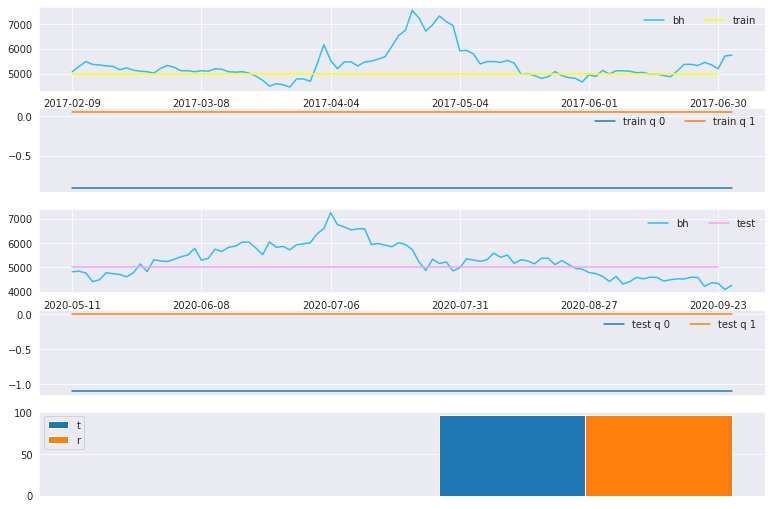

tensorboard
tensorboard
tensorboard
2020-09-29 14:54:42.250495
episode: 749


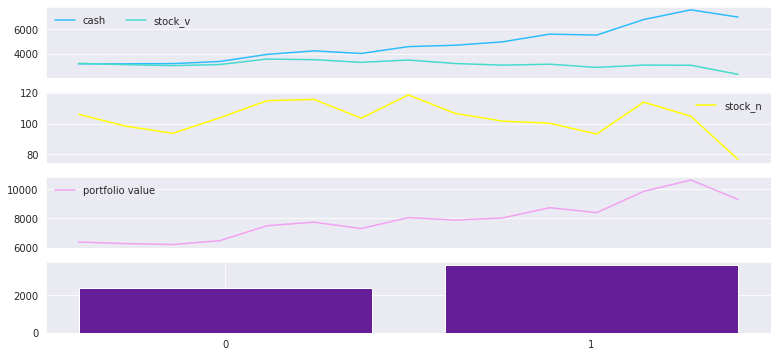

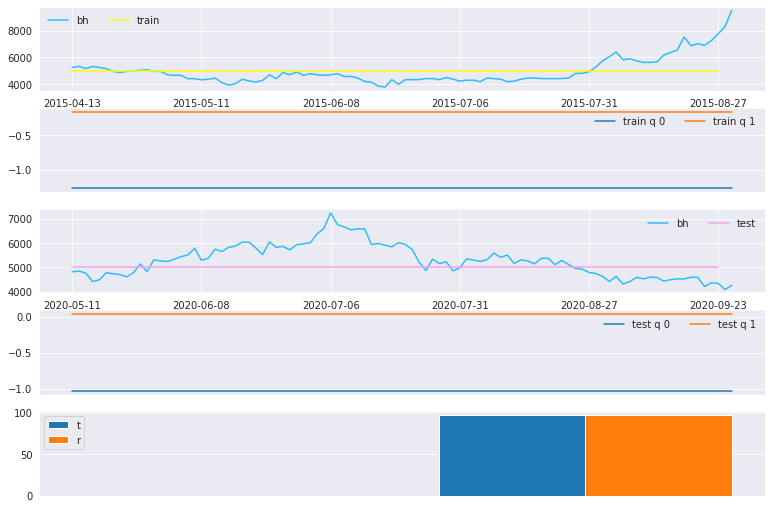

tensorboard
tensorboard
tensorboard
2020-09-29 15:06:01.802593
episode: 899


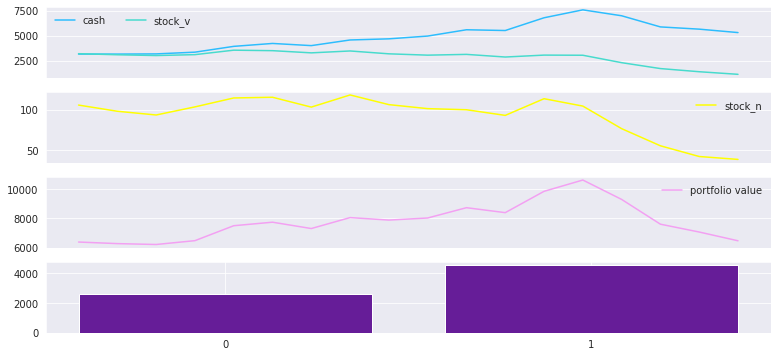

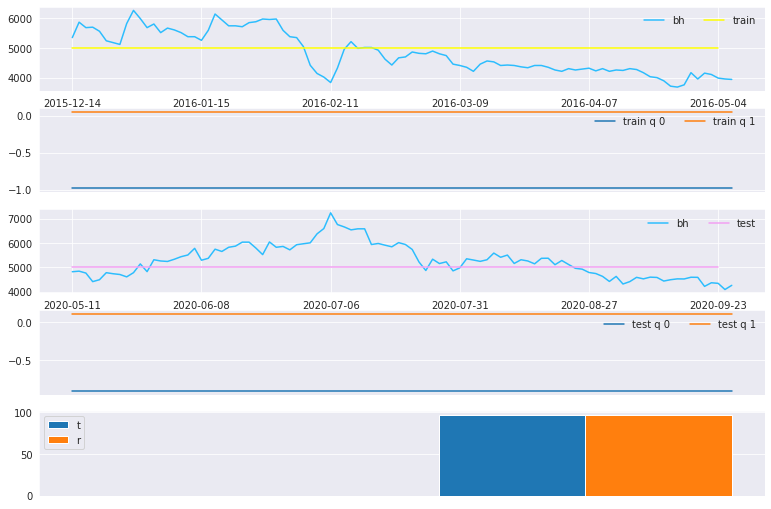

tensorboard
tensorboard
tensorboard
2020-09-29 15:17:43.126678
episode: 1049


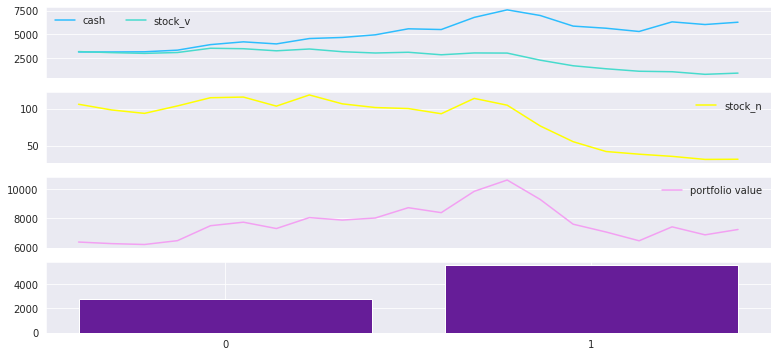

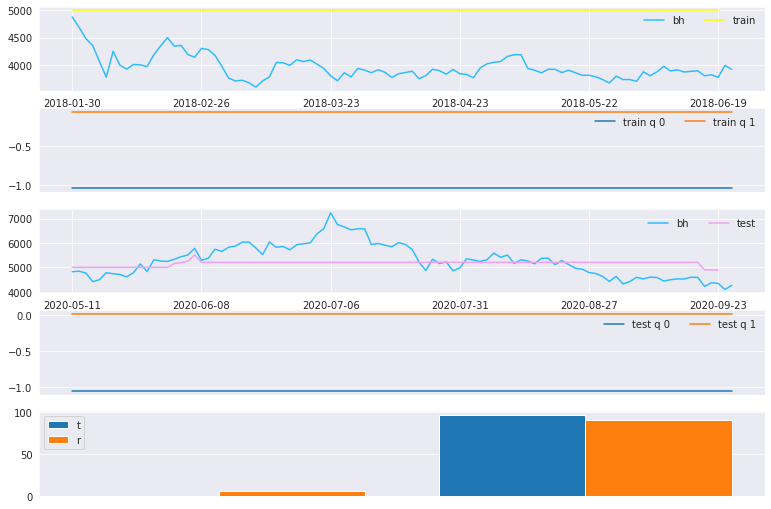

tensorboard
tensorboard
tensorboard
2020-09-29 15:29:23.406957
episode: 1199


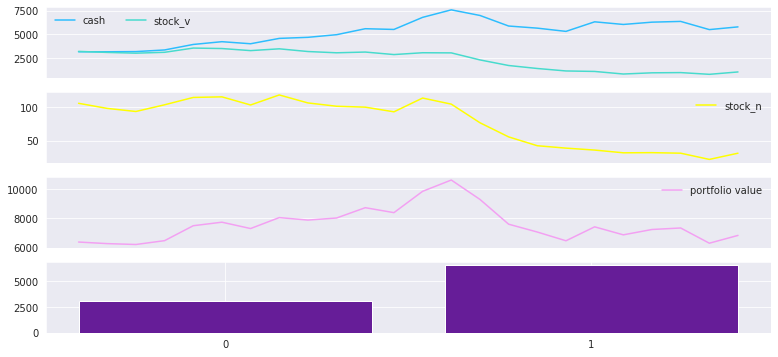

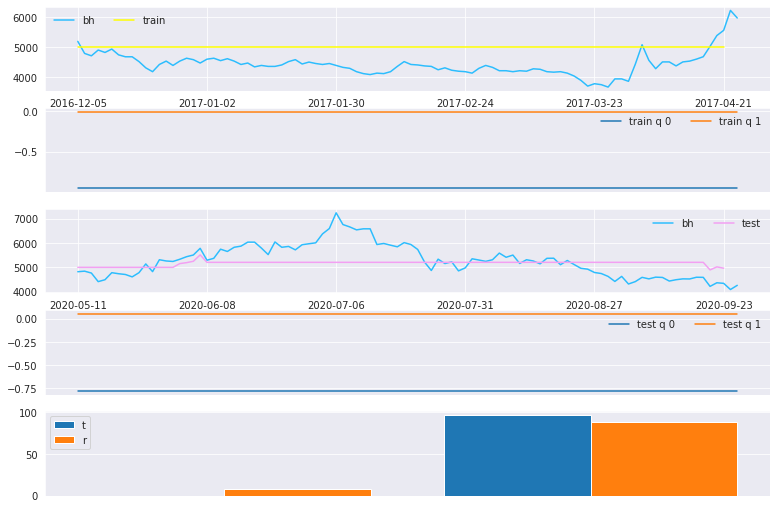

tensorboard
tensorboard
tensorboard
2020-09-29 15:41:08.222491
episode: 1349


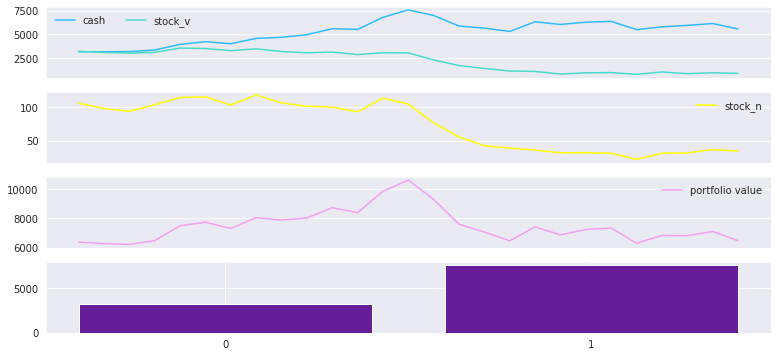

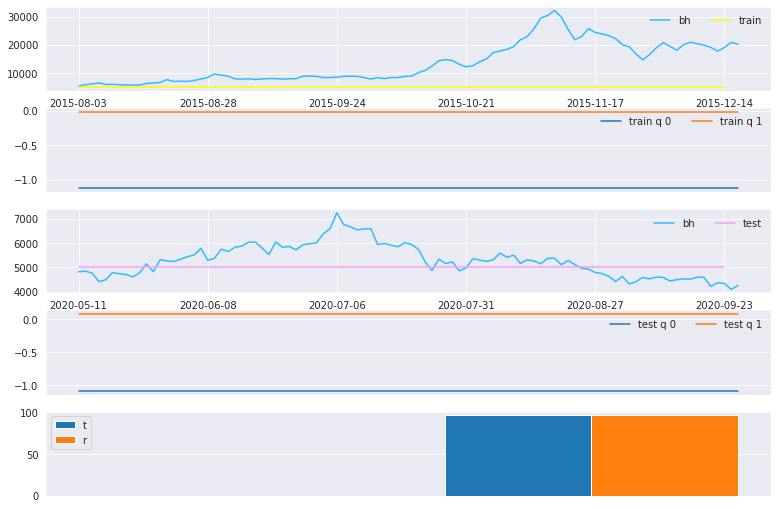

tensorboard
tensorboard
tensorboard
2020-09-29 15:52:56.768560
episode: 1499


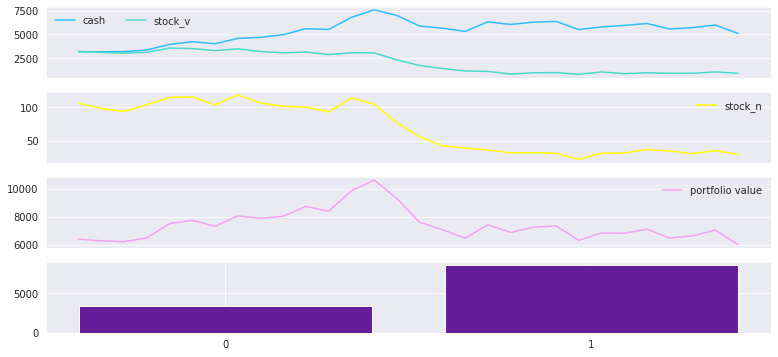

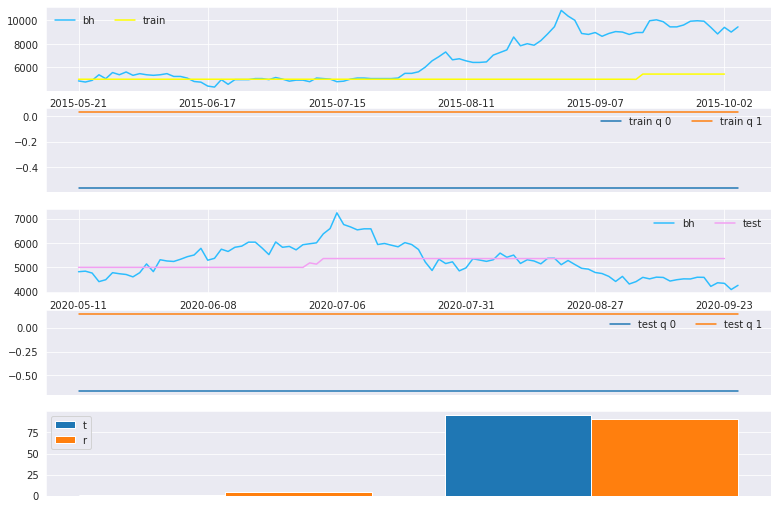

tensorboard
tensorboard
tensorboard
2020-09-29 16:04:49.409186
episode: 1649


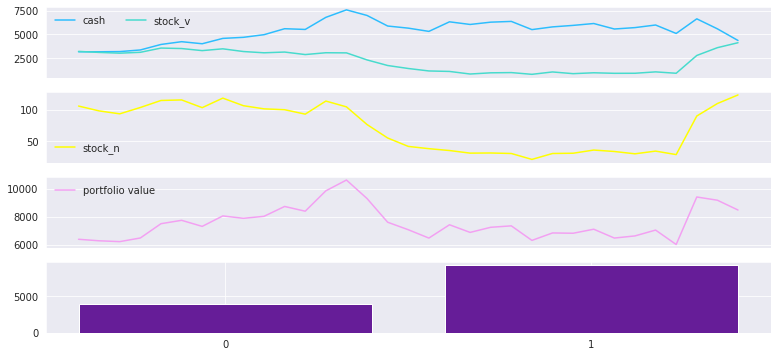

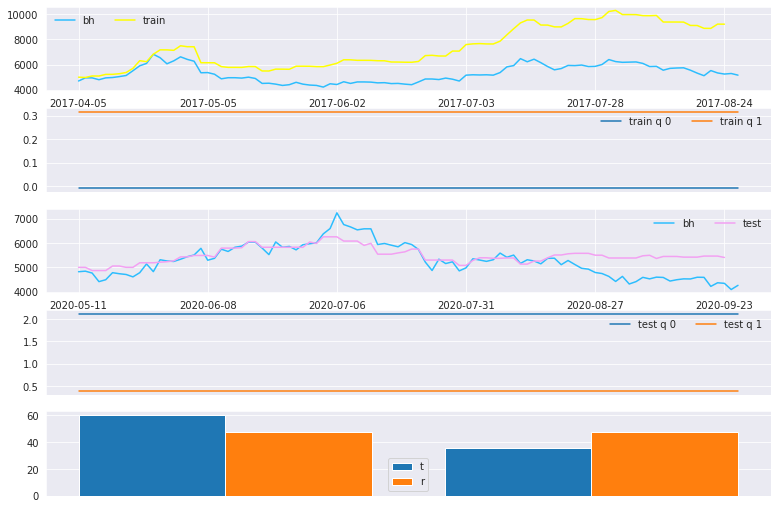

tensorboard
tensorboard
tensorboard
2020-09-29 16:17:50.042251
episode: 1799


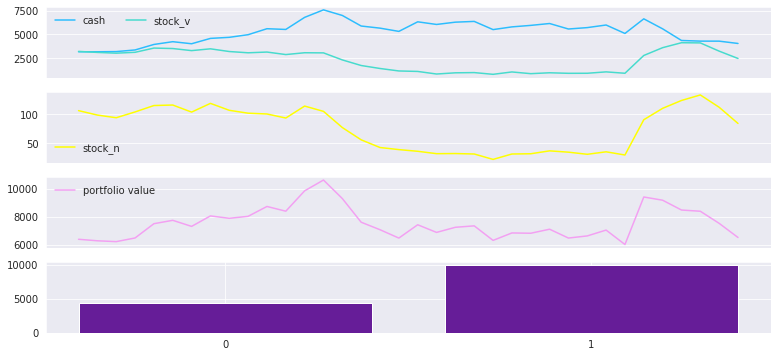

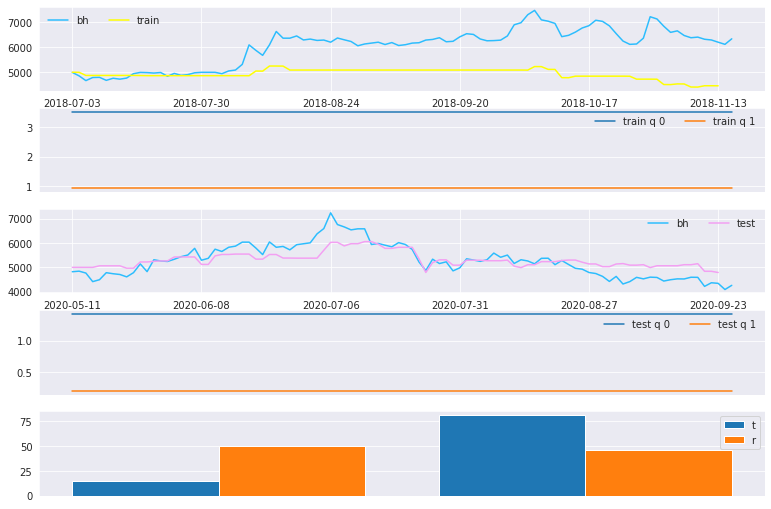

tensorboard
tensorboard
tensorboard
2020-09-29 16:31:30.957267
episode: 1949


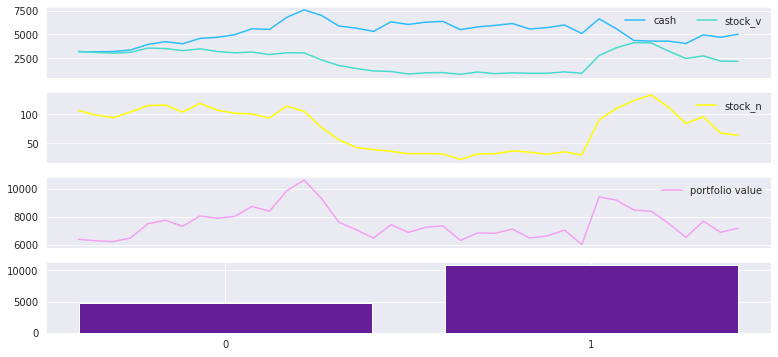

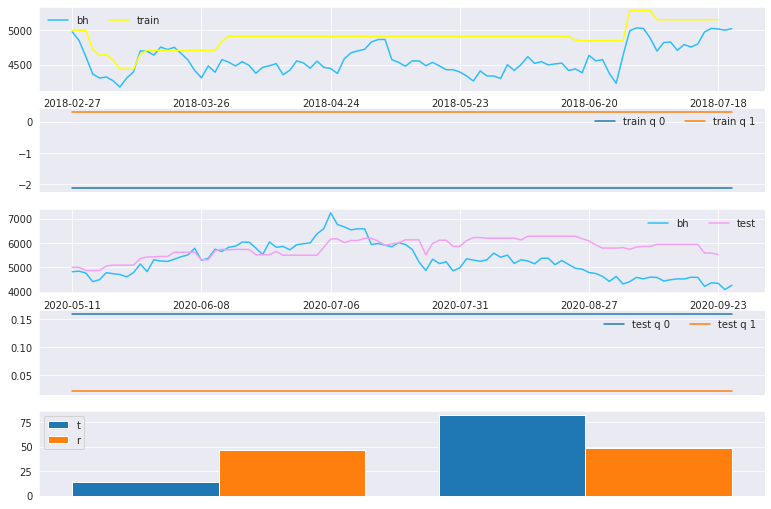

tensorboard
tensorboard
tensorboard
2020-09-29 16:44:37.910709
episode: 2099


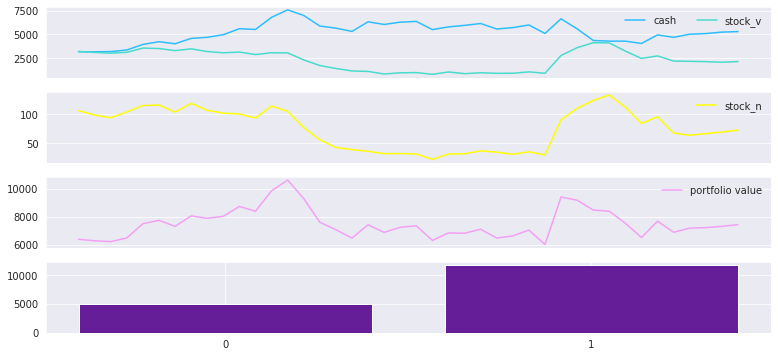

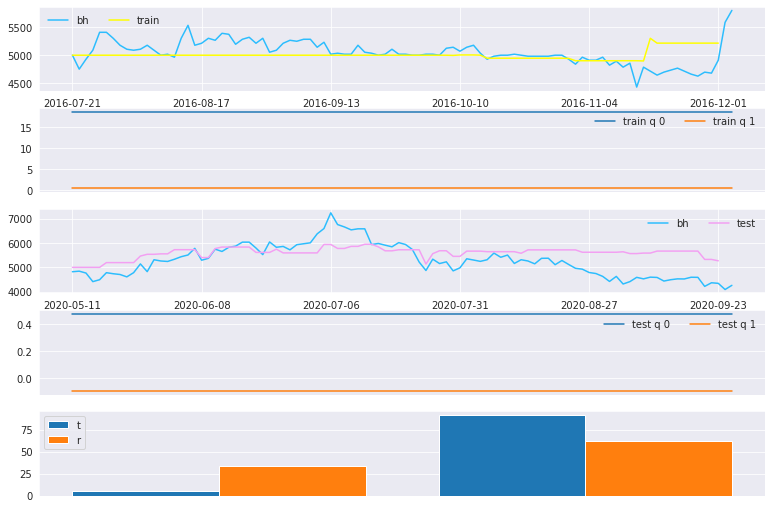

tensorboard
tensorboard
tensorboard
2020-09-29 16:57:08.339099
episode: 2249


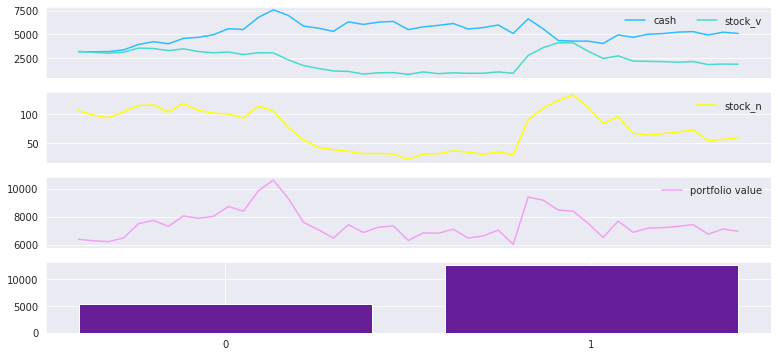

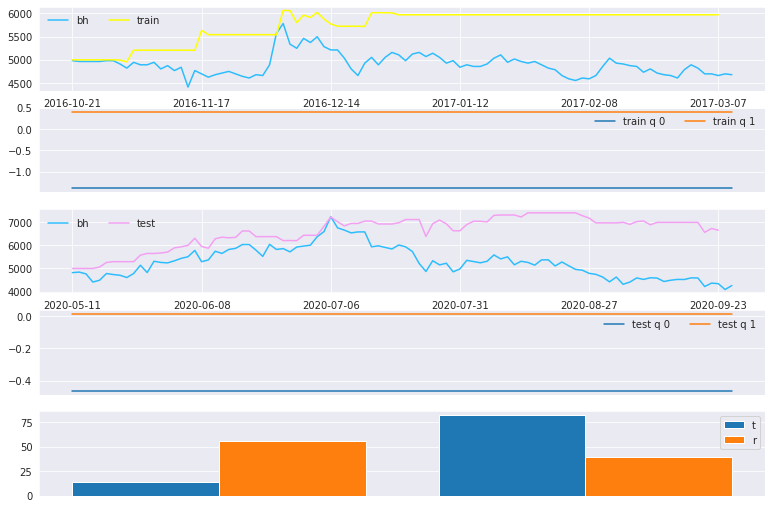

tensorboard
tensorboard
tensorboard
2020-09-29 17:09:51.048575
episode: 2399


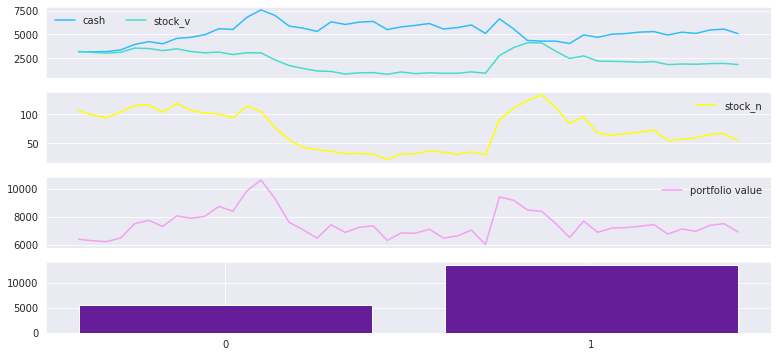

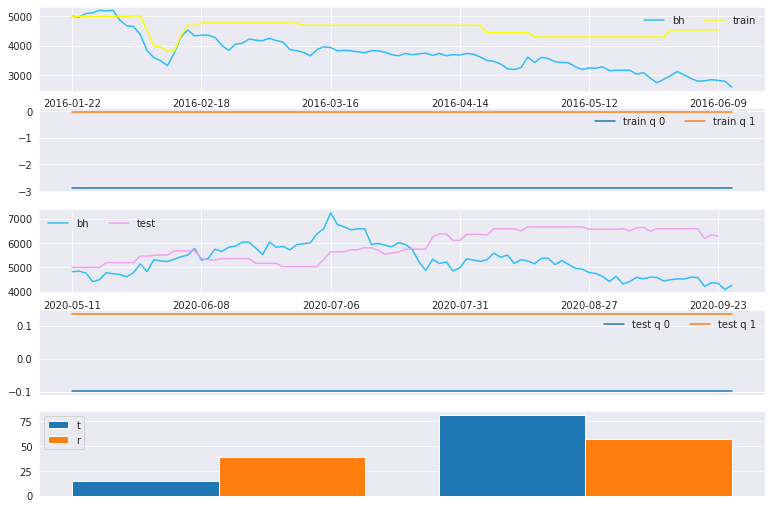

tensorboard
tensorboard
tensorboard
2020-09-29 17:22:22.519802
episode: 2549


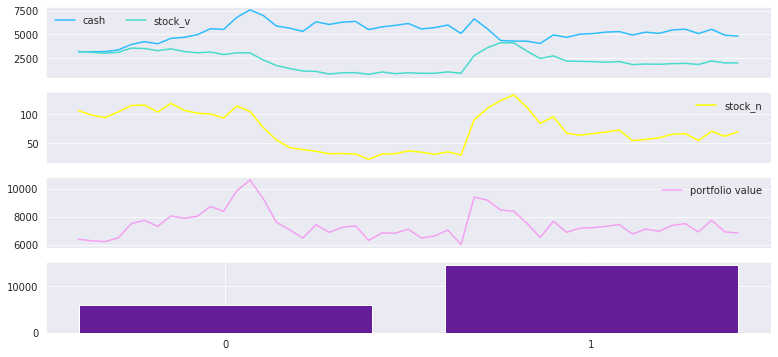

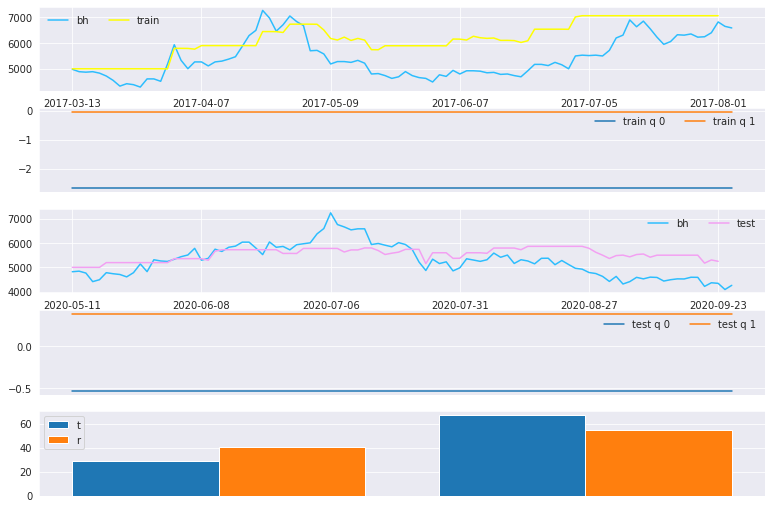

tensorboard
tensorboard
tensorboard
2020-09-29 17:35:04.763455
episode: 2699


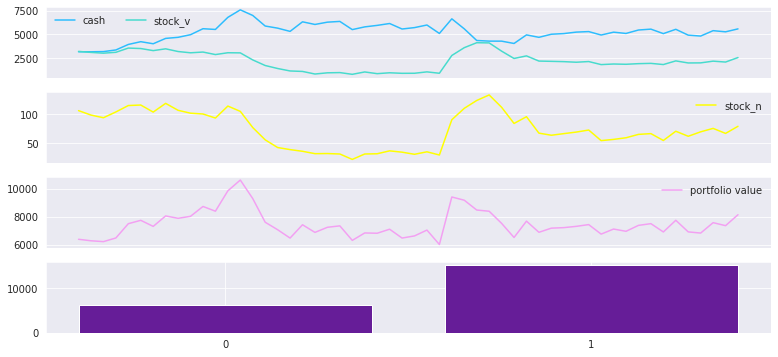

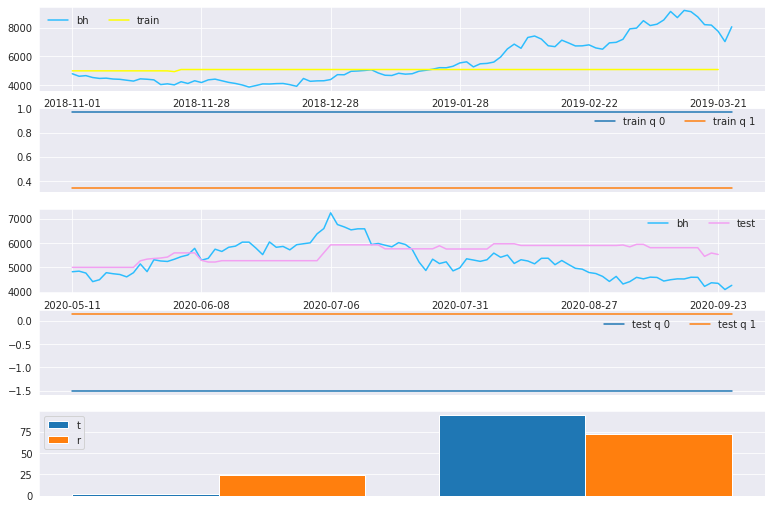

tensorboard
tensorboard
tensorboard
2020-09-29 17:47:36.206072
episode: 2849


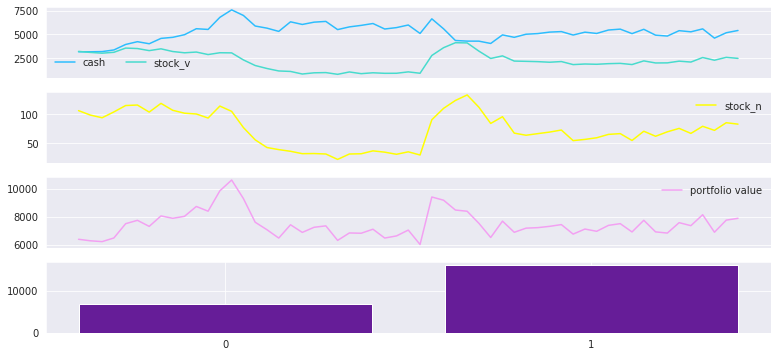

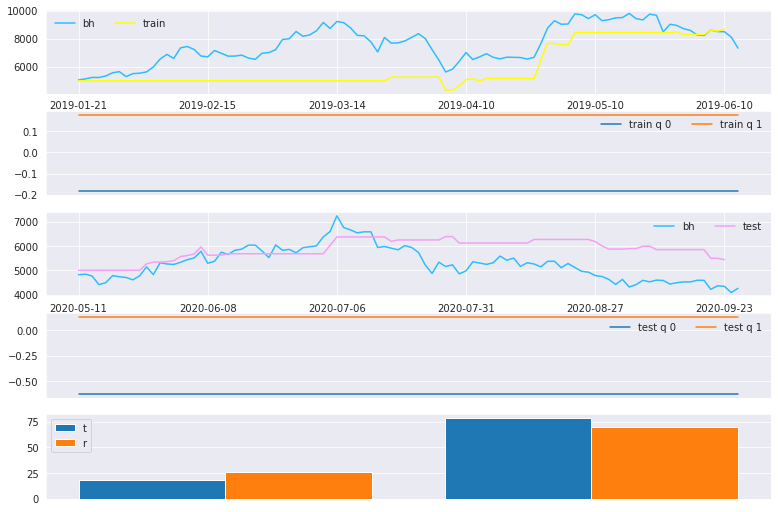

tensorboard
tensorboard
tensorboard
2020-09-29 18:00:11.349621
episode: 2999


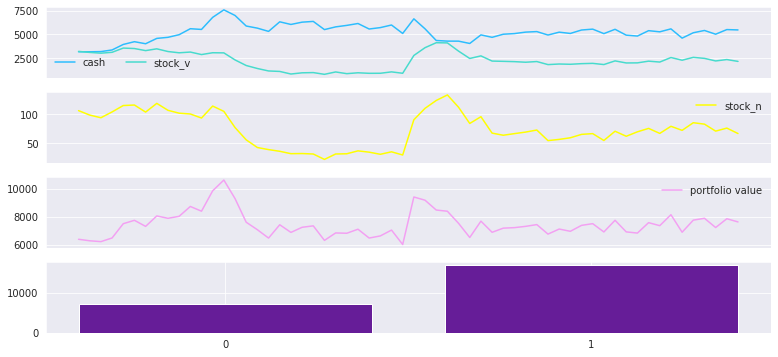

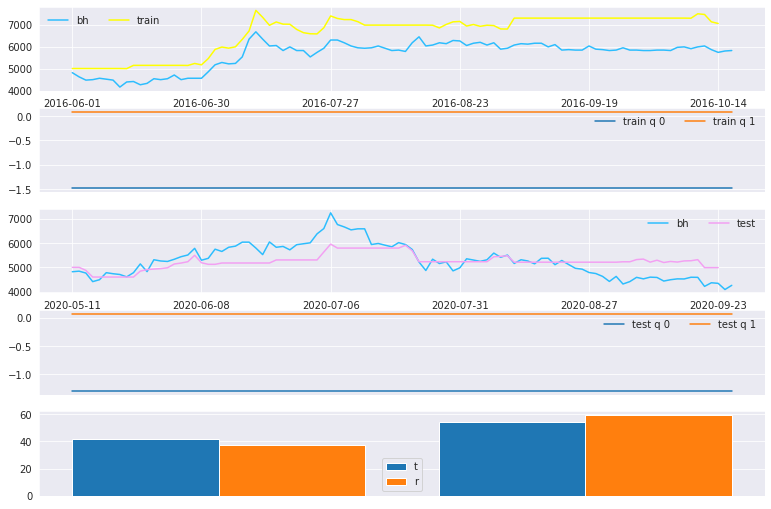

tensorboard
tensorboard
tensorboard
2020-09-29 18:12:50.223594
episode: 3149


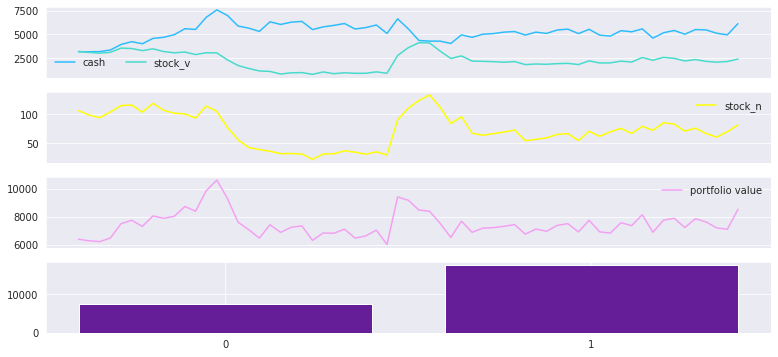

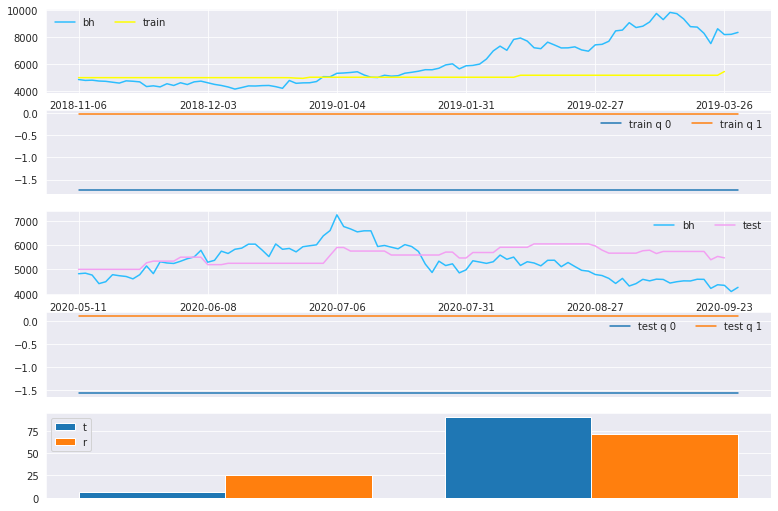

tensorboard
tensorboard
tensorboard
2020-09-29 18:26:01.434632
episode: 3299


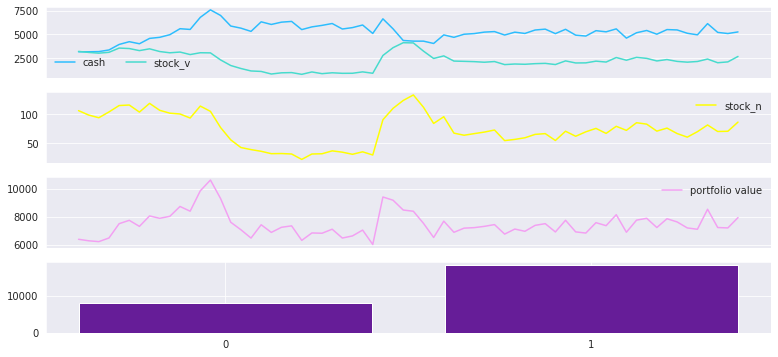

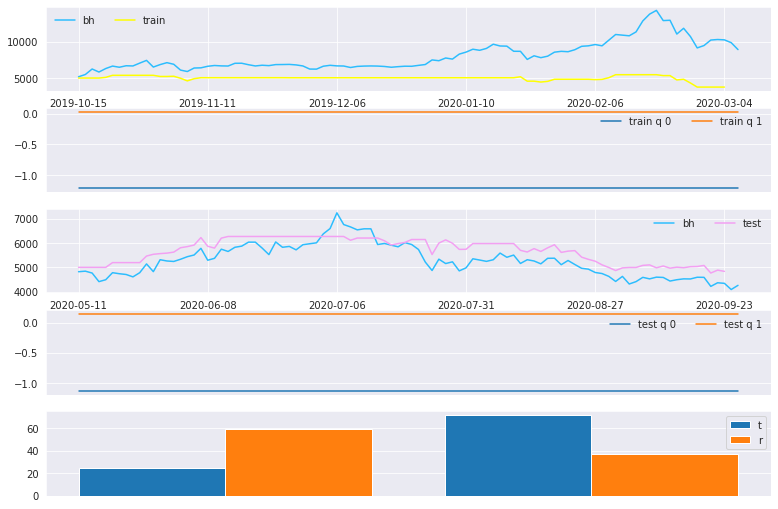

tensorboard
tensorboard
tensorboard
2020-09-29 18:38:47.811162
episode: 3449


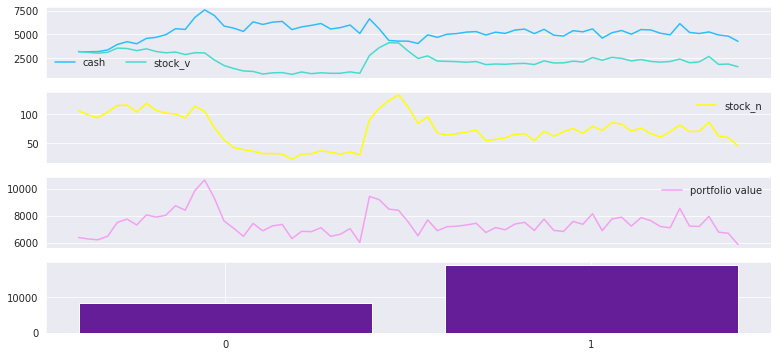

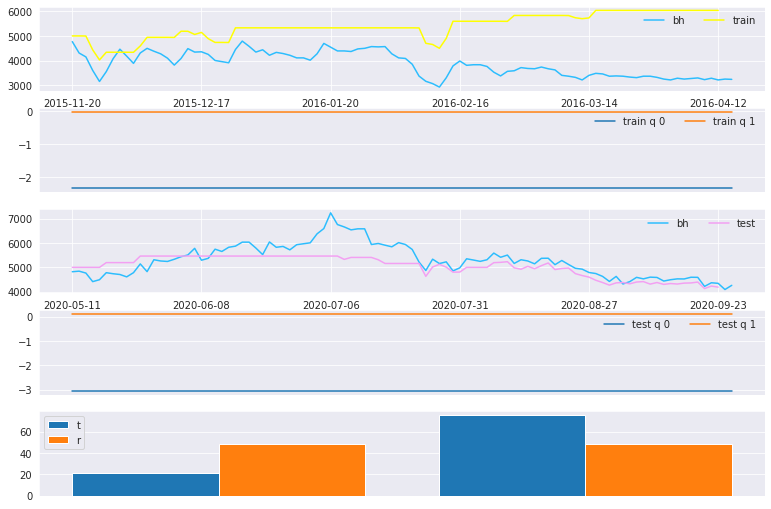

tensorboard
tensorboard
tensorboard
2020-09-29 18:51:34.795220
episode: 3599


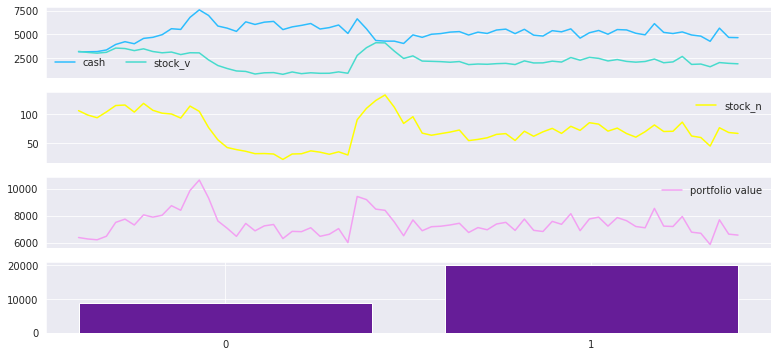

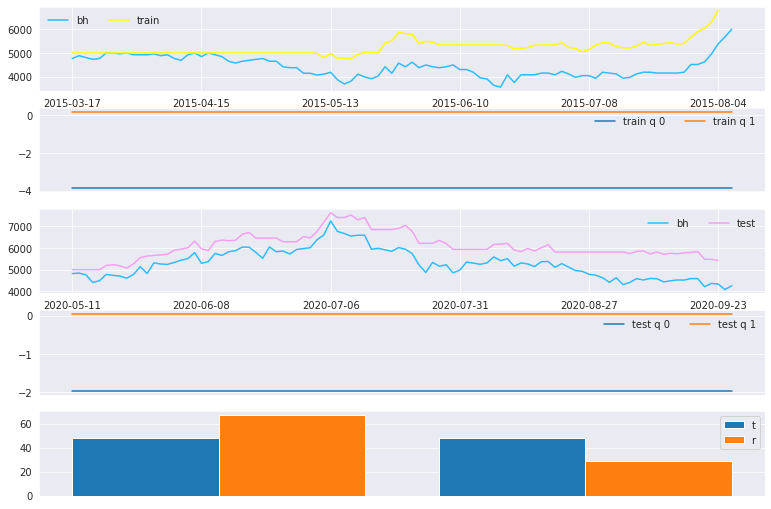

tensorboard
tensorboard
tensorboard
2020-09-29 19:04:04.562938
episode: 3749


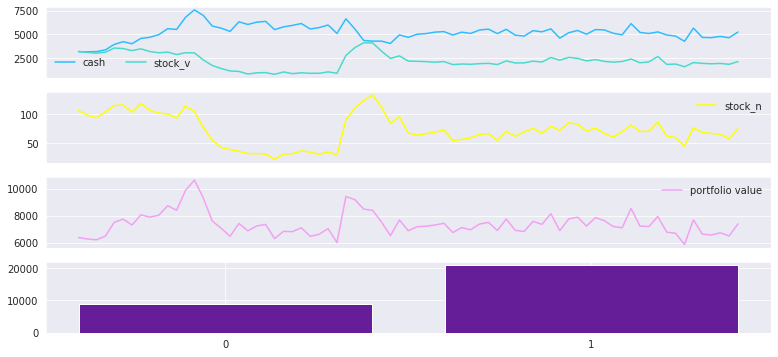

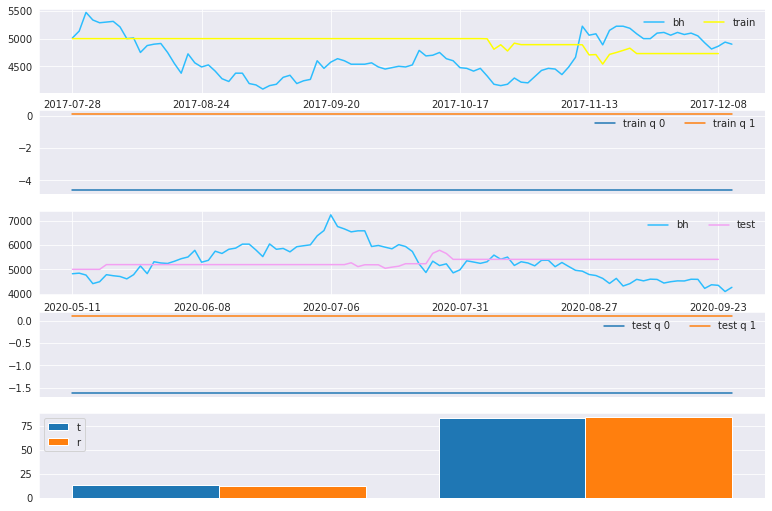

tensorboard
tensorboard
tensorboard
2020-09-29 19:16:40.911172
episode: 3899


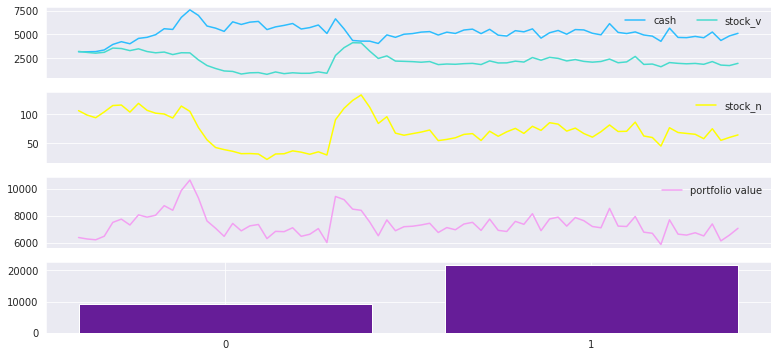

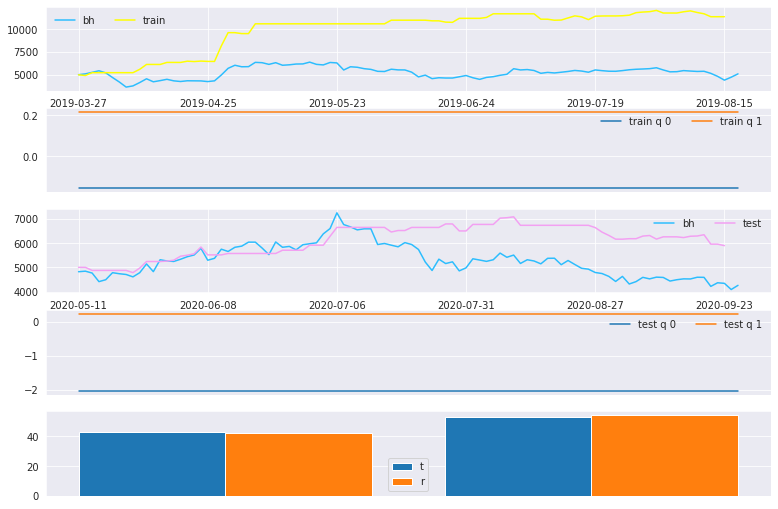

tensorboard
tensorboard
tensorboard
2020-09-29 19:29:17.065491
episode: 4049


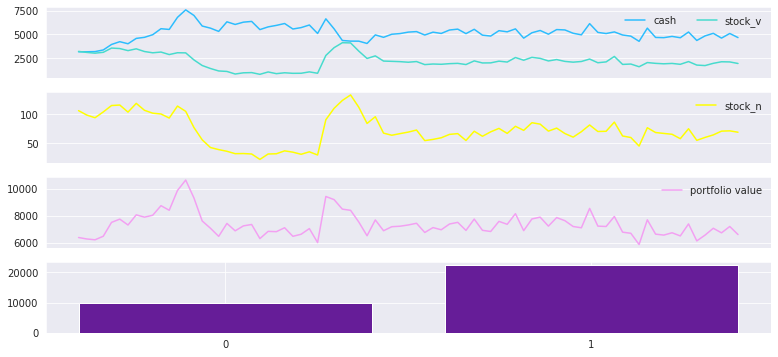

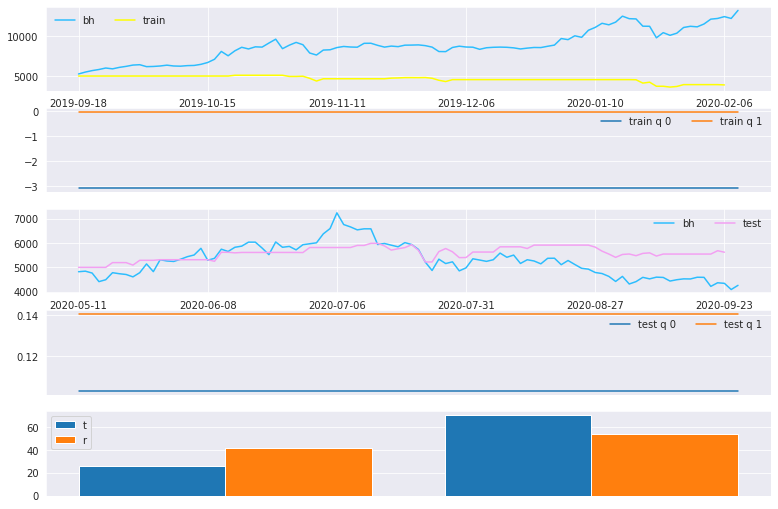

tensorboard
tensorboard
tensorboard
2020-09-29 19:42:13.665337
episode: 4199


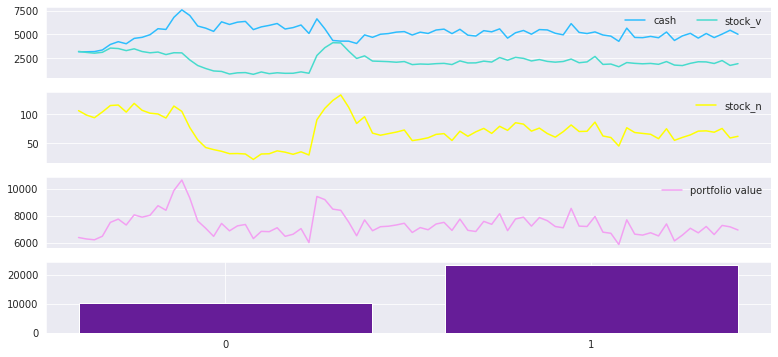

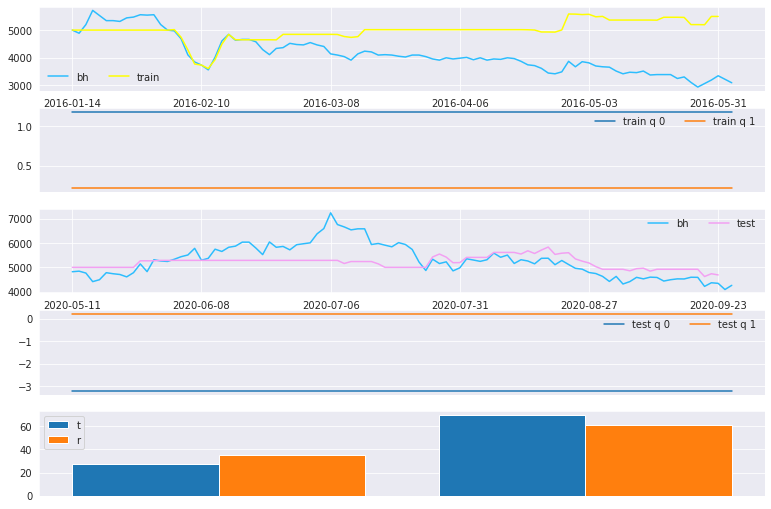

tensorboard
tensorboard
tensorboard
2020-09-29 19:55:24.451967
episode: 4349


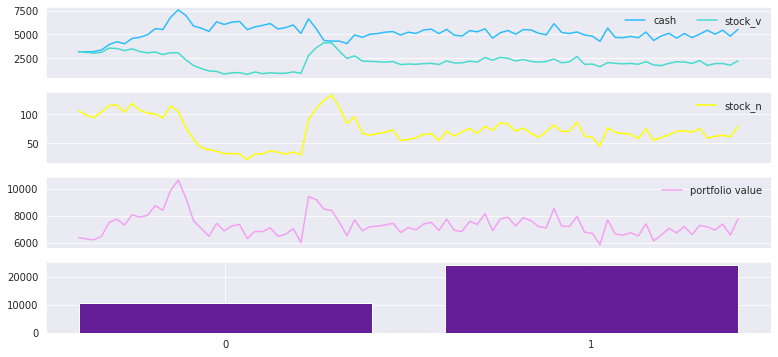

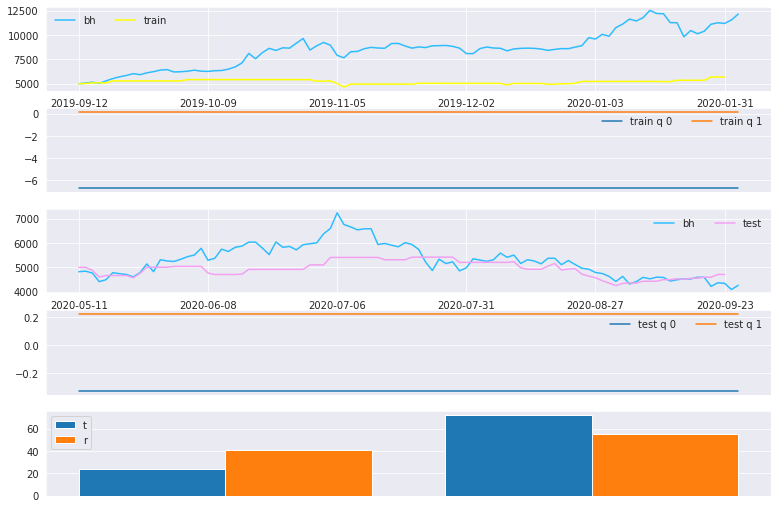

tensorboard
tensorboard
tensorboard
2020-09-29 20:09:07.117735
episode: 4499


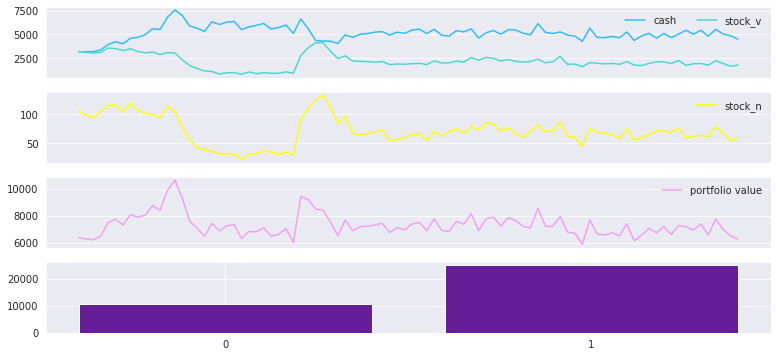

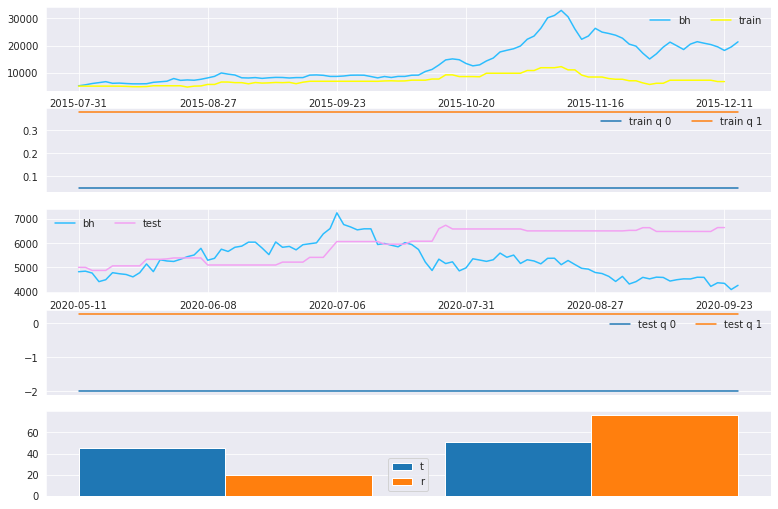

tensorboard
tensorboard
tensorboard
2020-09-29 20:23:56.063823
episode: 4649


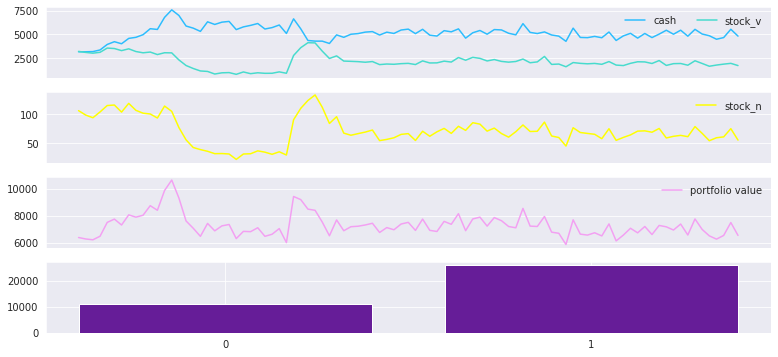

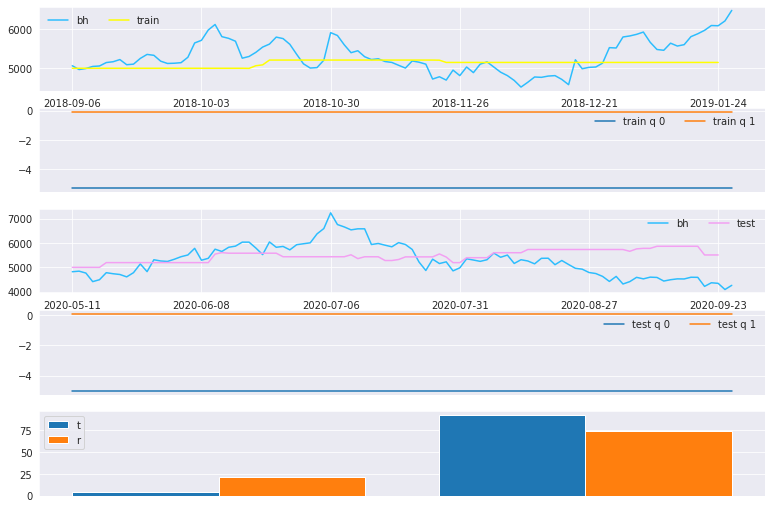

tensorboard
tensorboard
tensorboard
2020-09-29 20:37:23.590656
episode: 4799


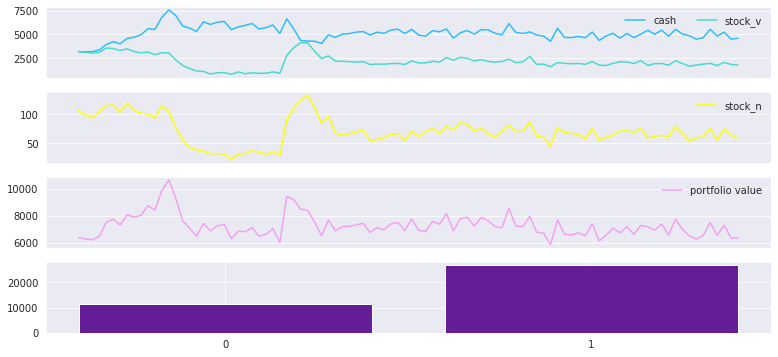

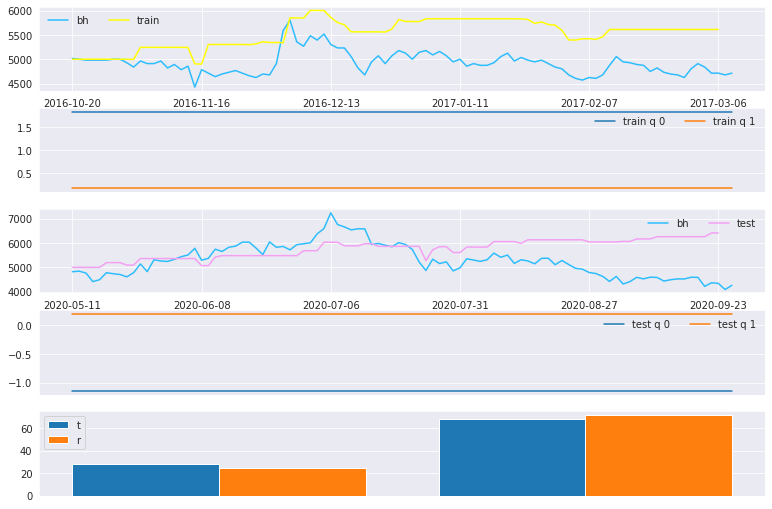

tensorboard
tensorboard
tensorboard
2020-09-29 20:49:45.468249
episode: 4949


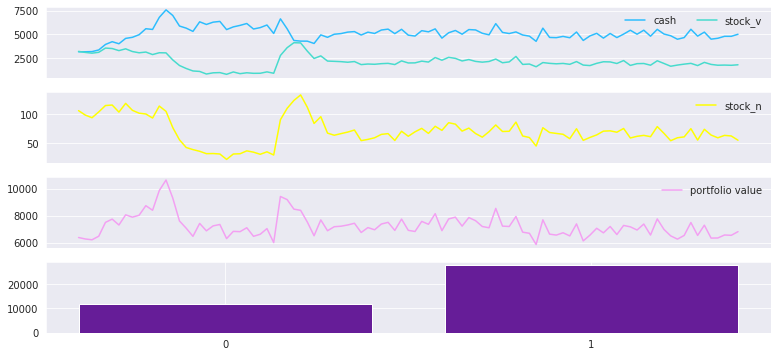

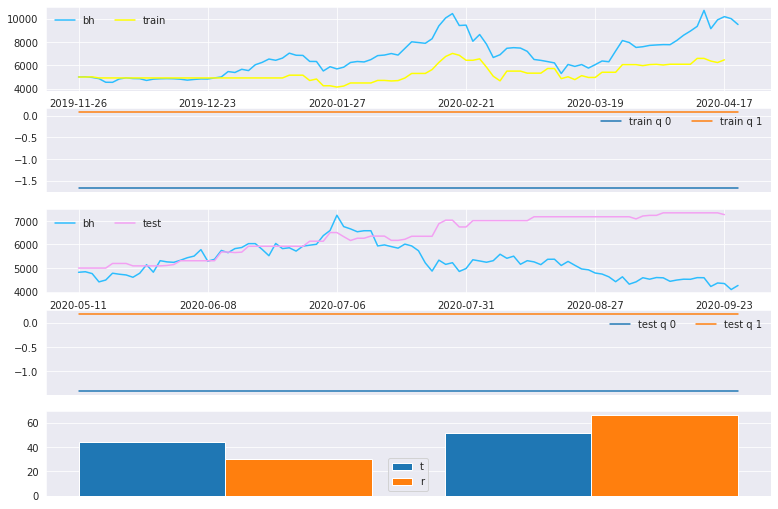

tensorboard
tensorboard
tensorboard
2020-09-29 21:02:13.277463
episode: 5099


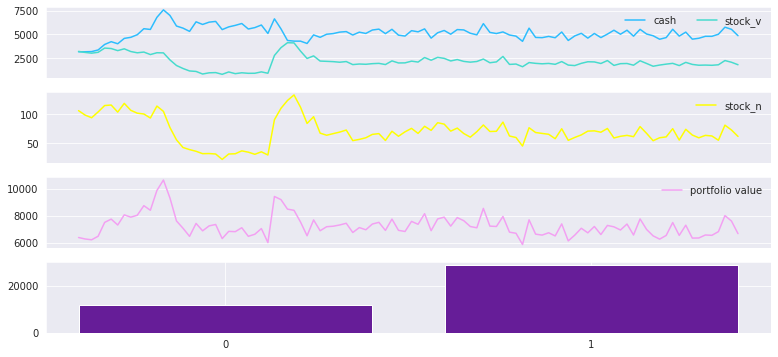

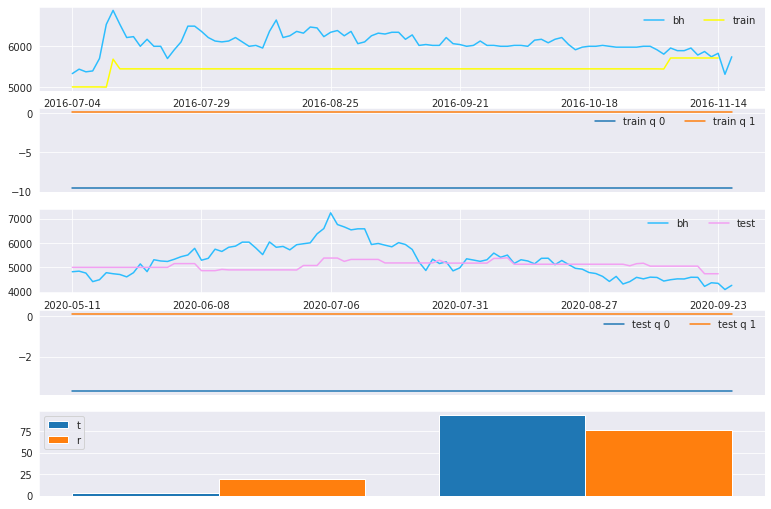

tensorboard
tensorboard
tensorboard
2020-09-29 21:14:42.824627
episode: 5249


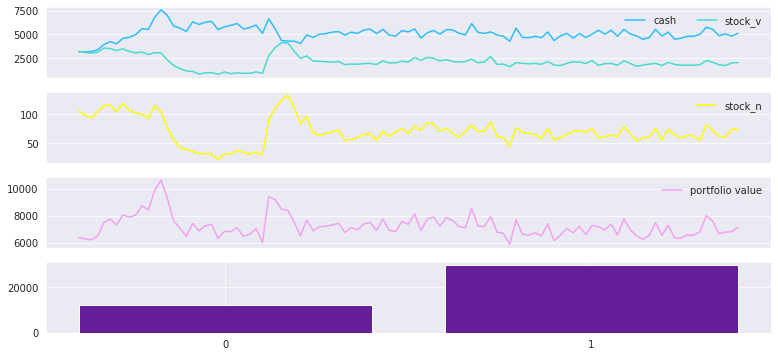

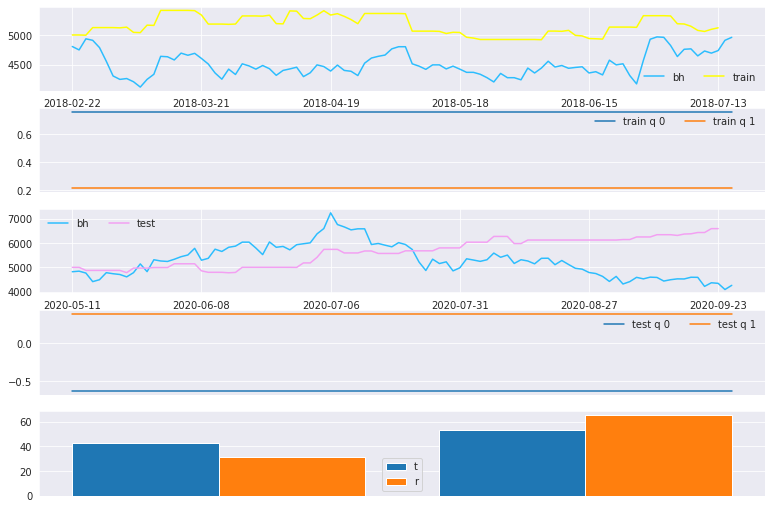

tensorboard
tensorboard
tensorboard
2020-09-29 21:27:09.851599
episode: 5399


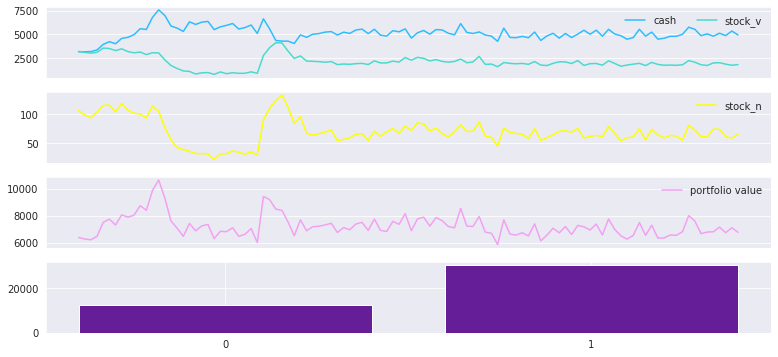

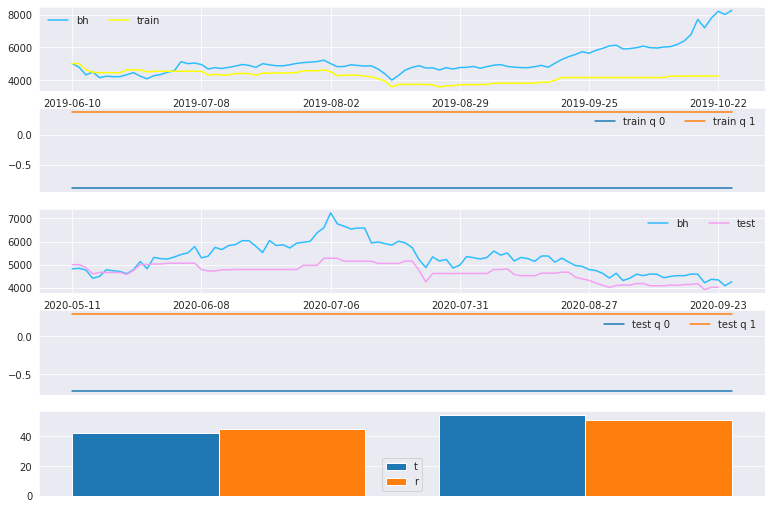

tensorboard
tensorboard
tensorboard
2020-09-29 21:40:37.708346
episode: 5549


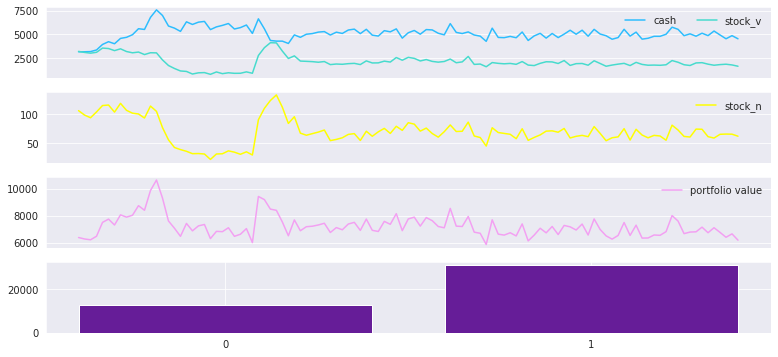

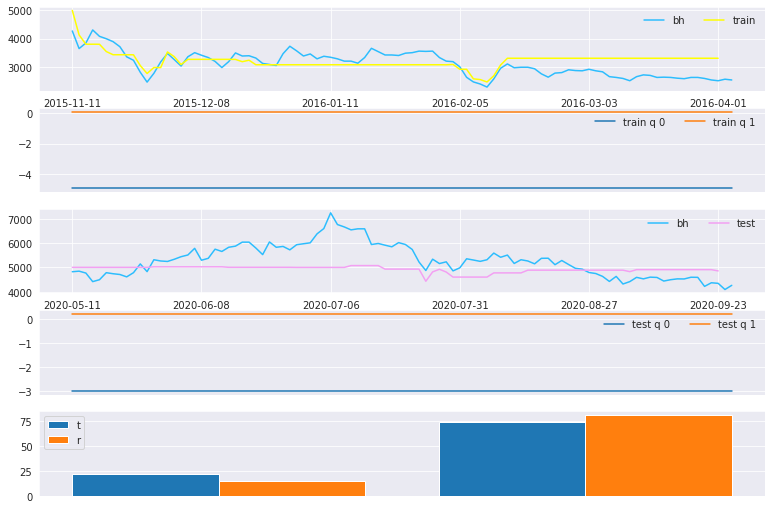

tensorboard
tensorboard
tensorboard
2020-09-29 21:54:22.594245
episode: 5699


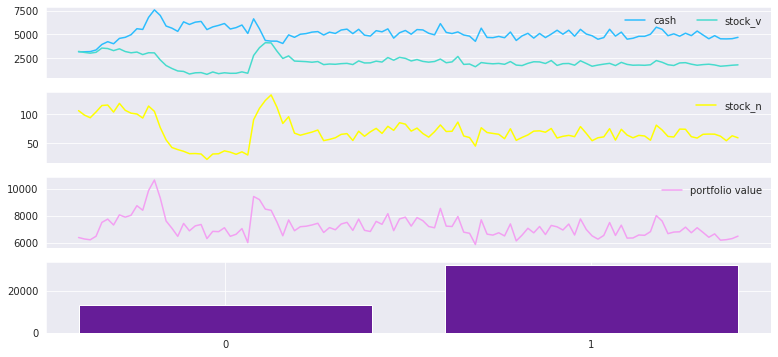

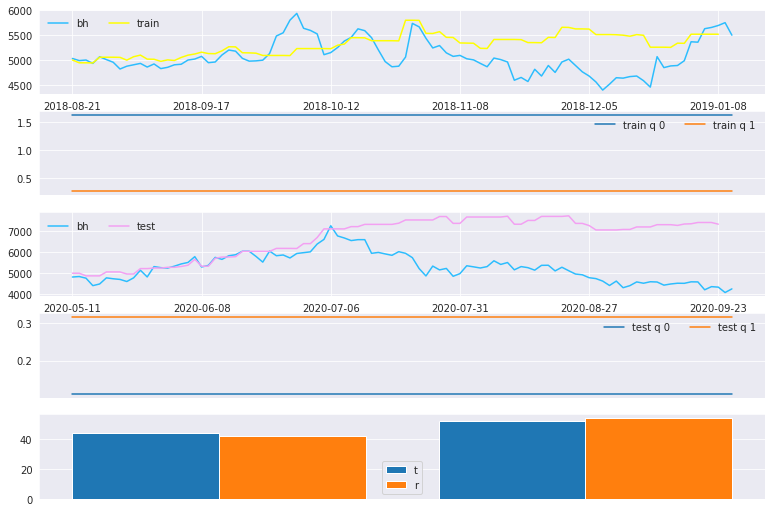

tensorboard
tensorboard
tensorboard
2020-09-29 22:07:09.769178
episode: 5849


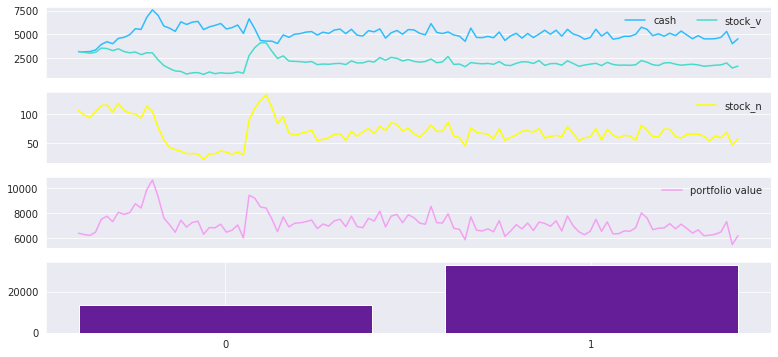

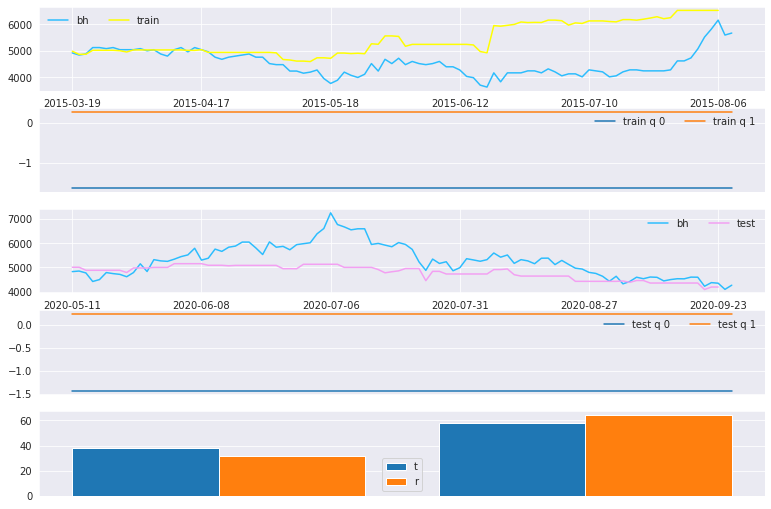

tensorboard
tensorboard
tensorboard
2020-09-29 22:19:42.866711
episode: 5999


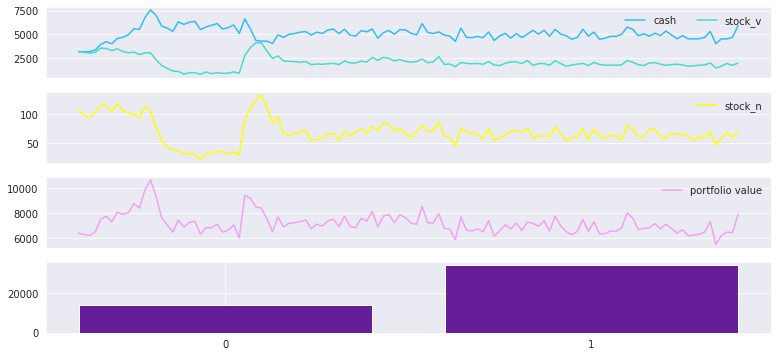

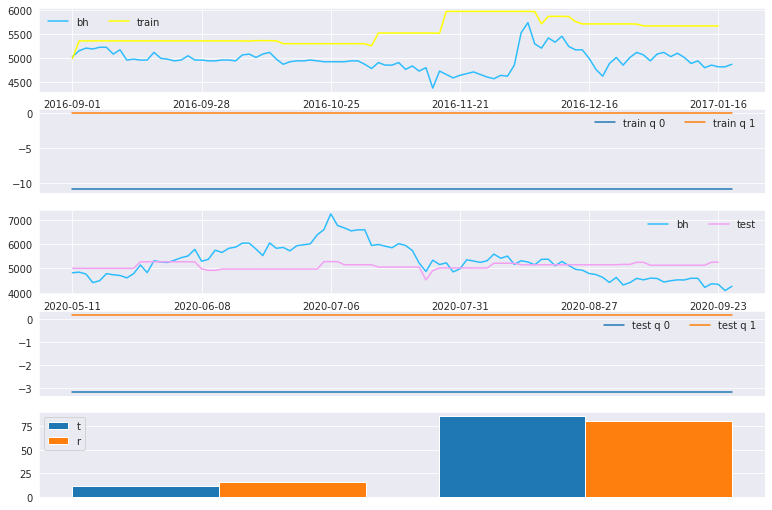

tensorboard
tensorboard
tensorboard
2020-09-29 22:32:02.774148
episode: 6149


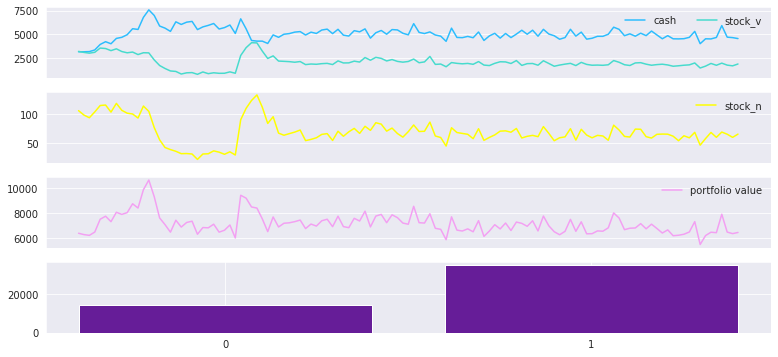

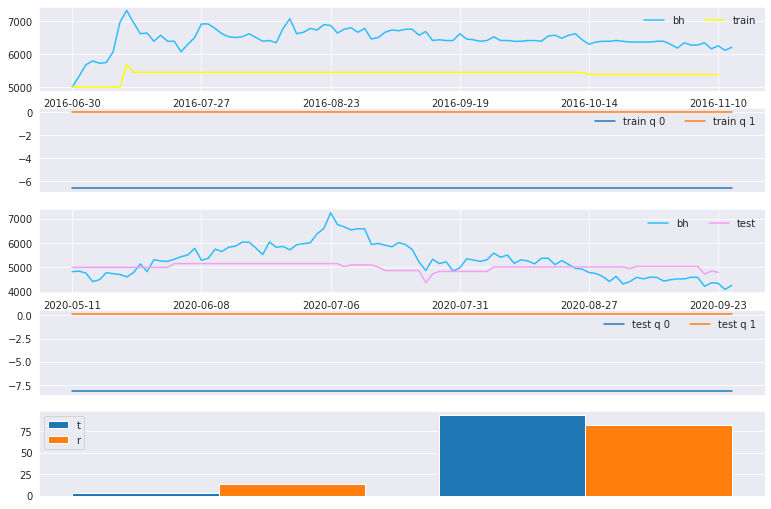

tensorboard
tensorboard
tensorboard
2020-09-29 22:43:59.968702
episode: 6299


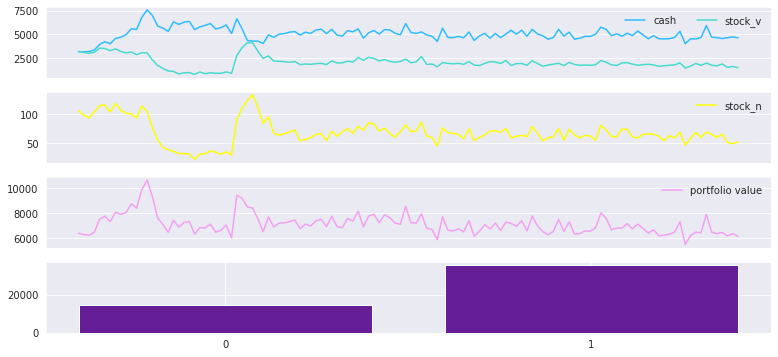

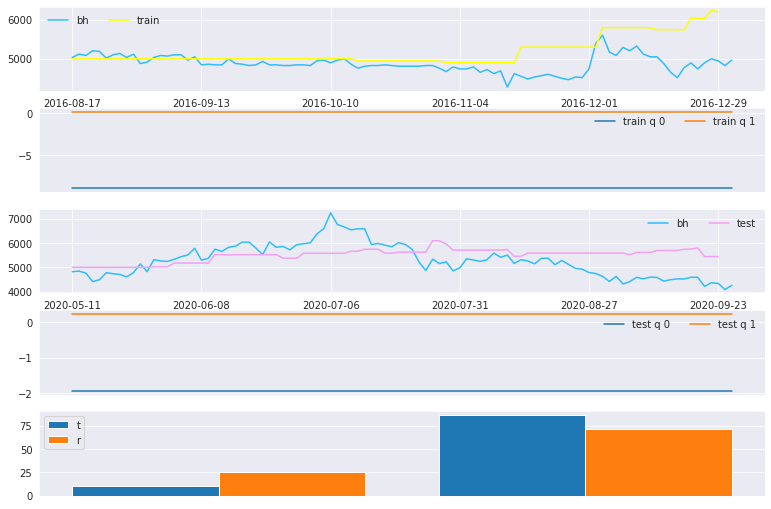

tensorboard
tensorboard
tensorboard
2020-09-29 22:56:08.747045
episode: 6449


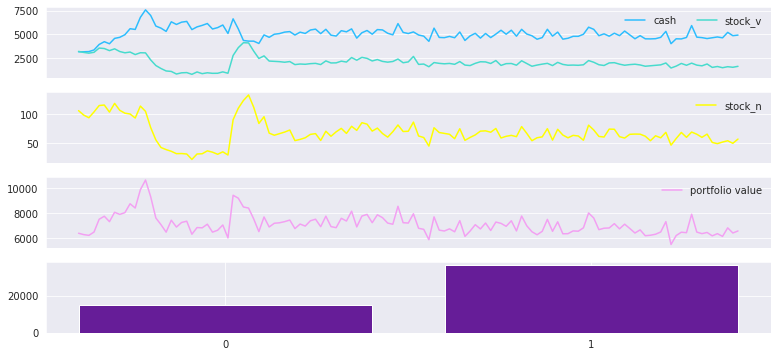

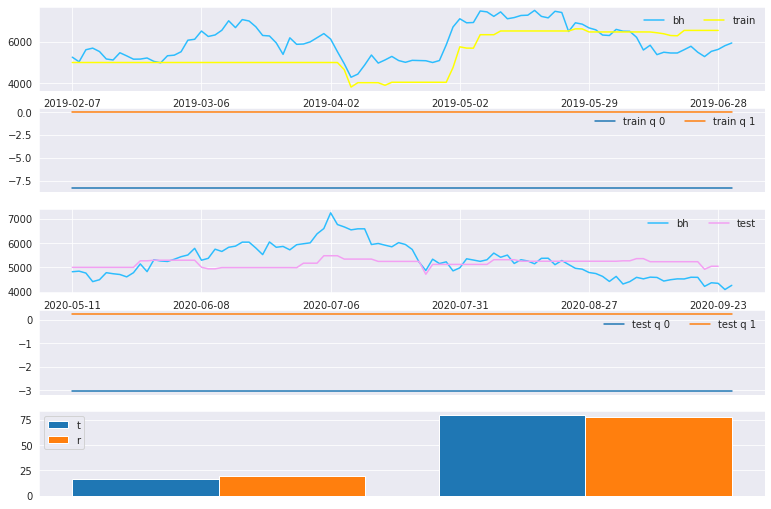

tensorboard
tensorboard
tensorboard
2020-09-29 23:08:34.287156
episode: 6599


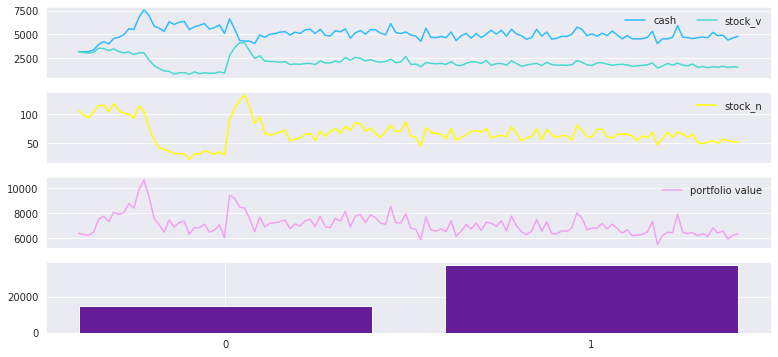

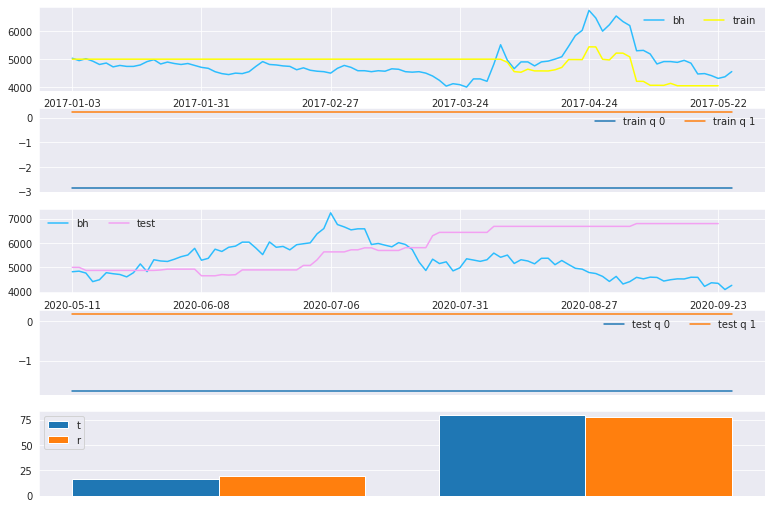

tensorboard
tensorboard
tensorboard
2020-09-29 23:21:44.895419
episode: 6749


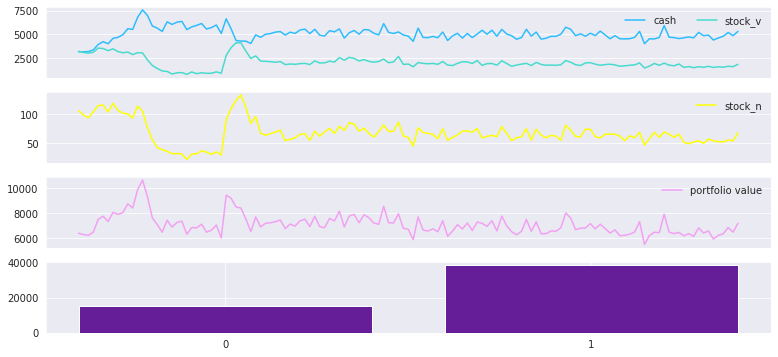

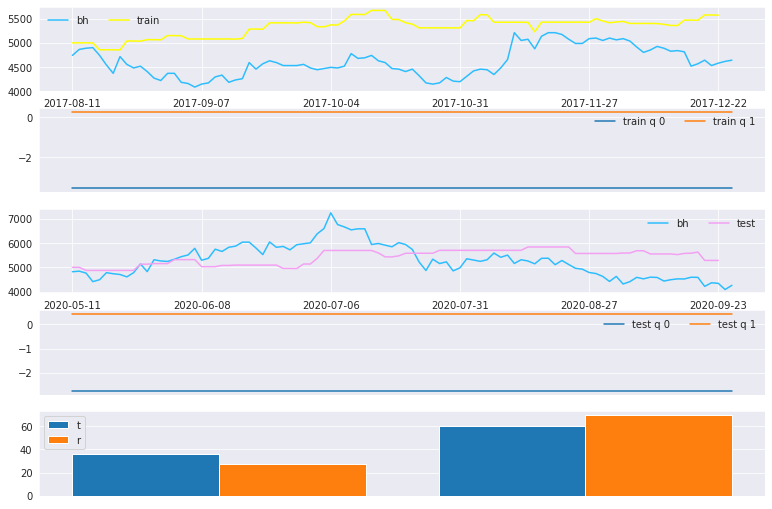

tensorboard
tensorboard
tensorboard
2020-09-29 23:35:39.964595
episode: 6899


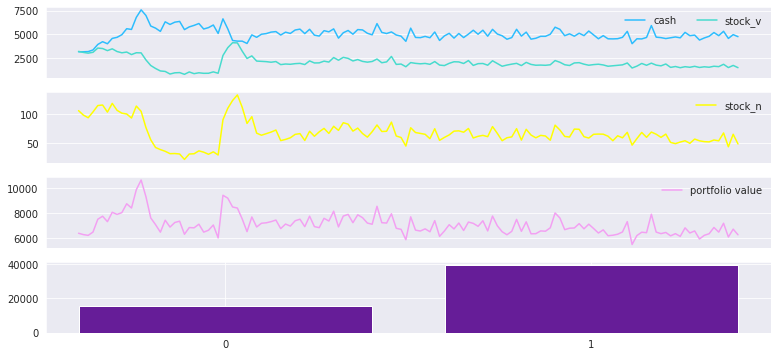

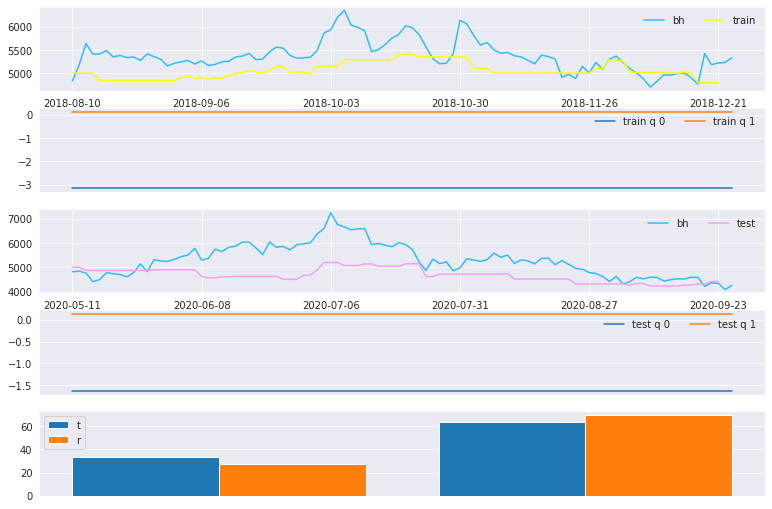

tensorboard
tensorboard
tensorboard
2020-09-29 23:49:05.183962
episode: 7049


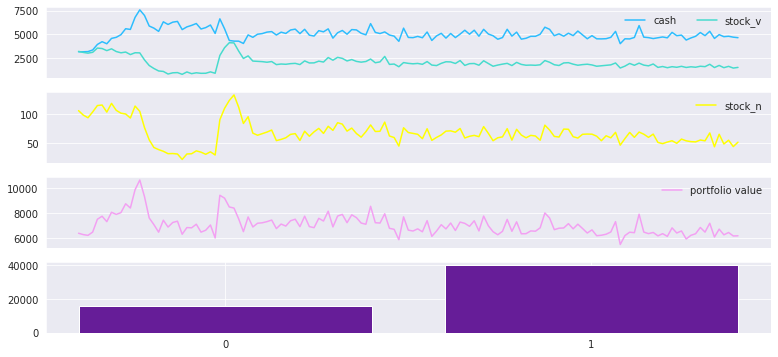

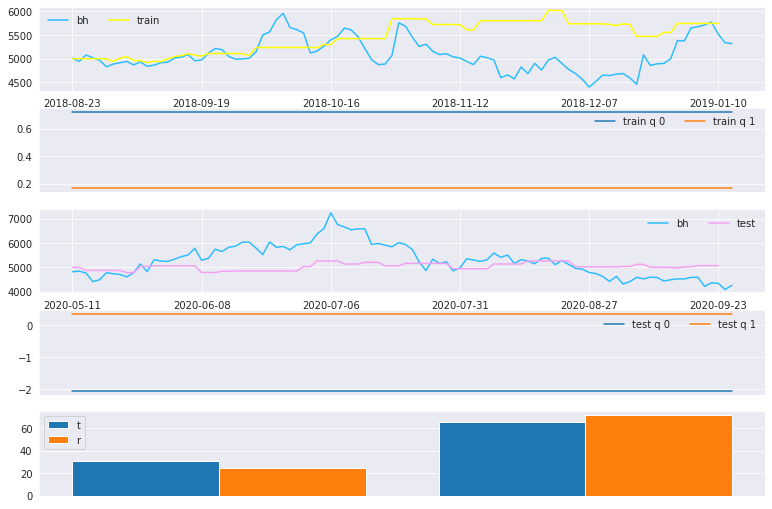

tensorboard
tensorboard
tensorboard
2020-09-30 00:01:41.332454
episode: 7199


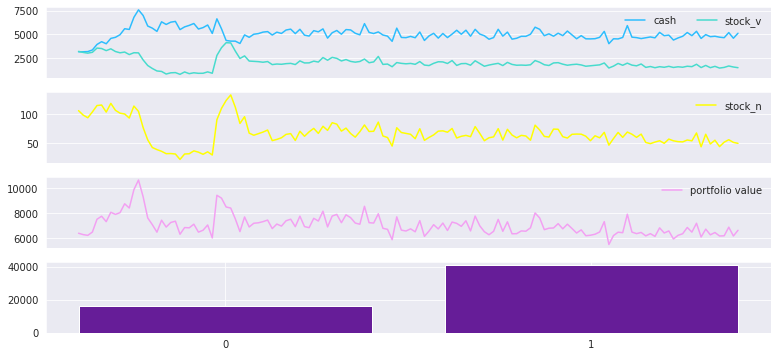

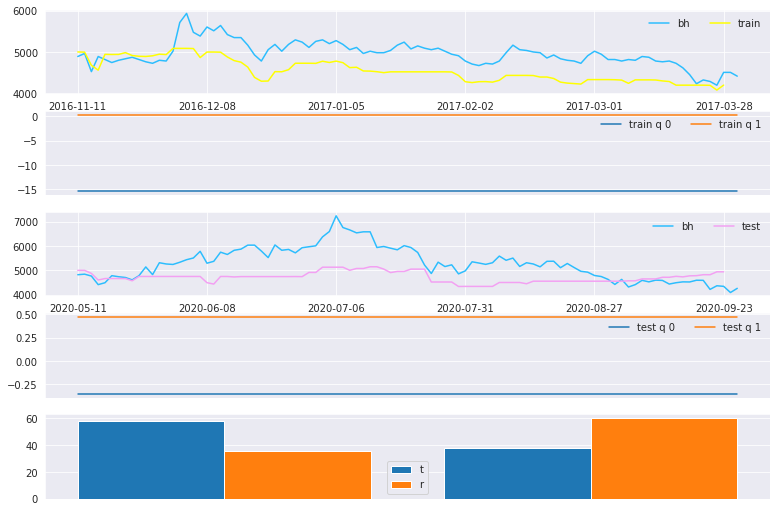

tensorboard
tensorboard
tensorboard
2020-09-30 00:13:35.001790
episode: 7349


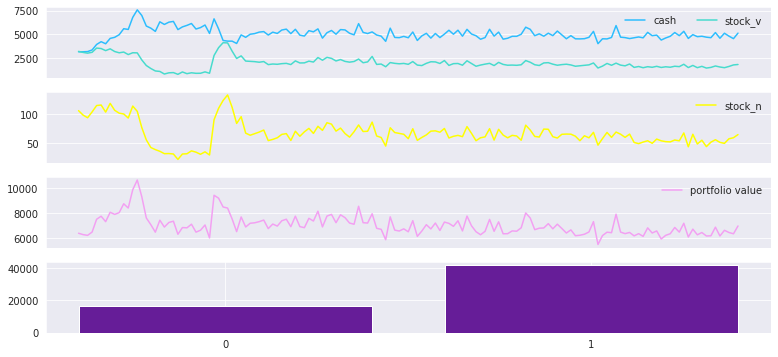

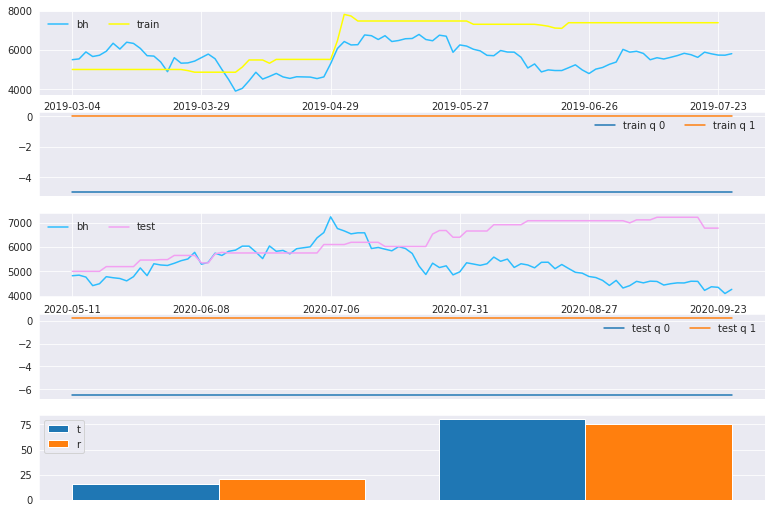

tensorboard
tensorboard
tensorboard
2020-09-30 00:25:26.019624
episode: 7499


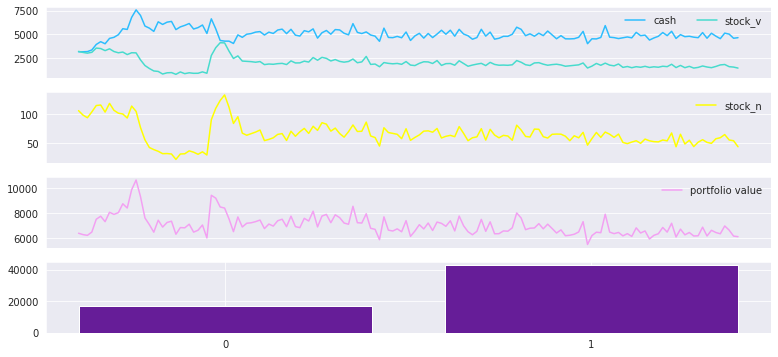

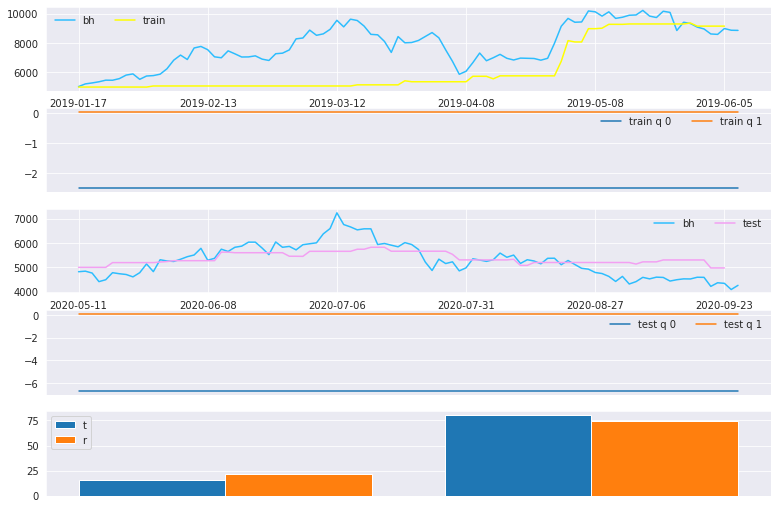

tensorboard
tensorboard
tensorboard
2020-09-30 00:37:13.171440
episode: 7649


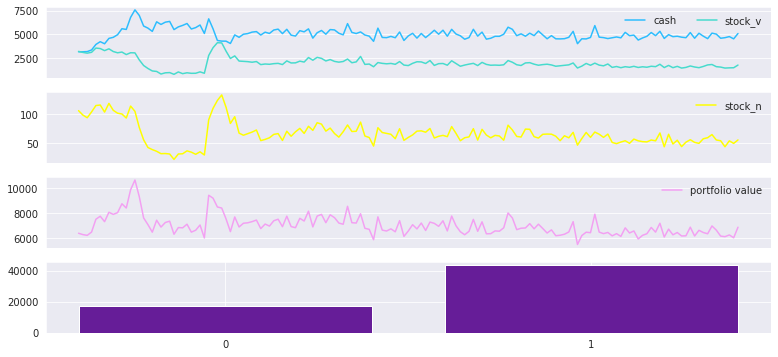

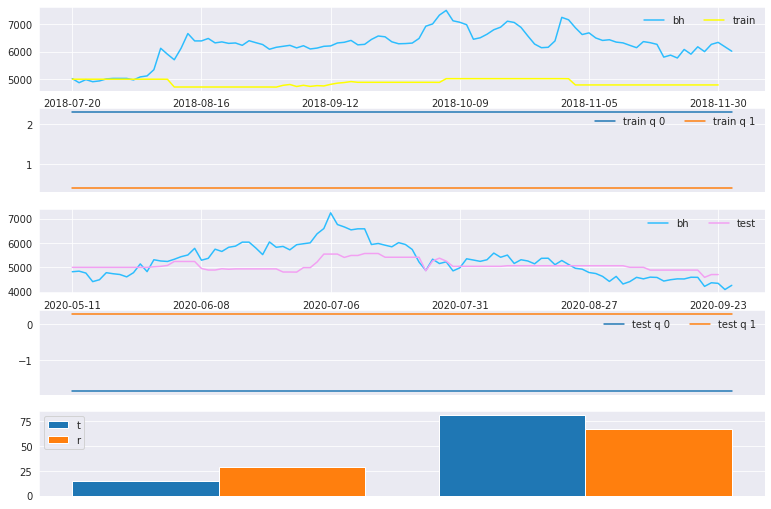

tensorboard
tensorboard
tensorboard
2020-09-30 00:49:03.957277
episode: 7799


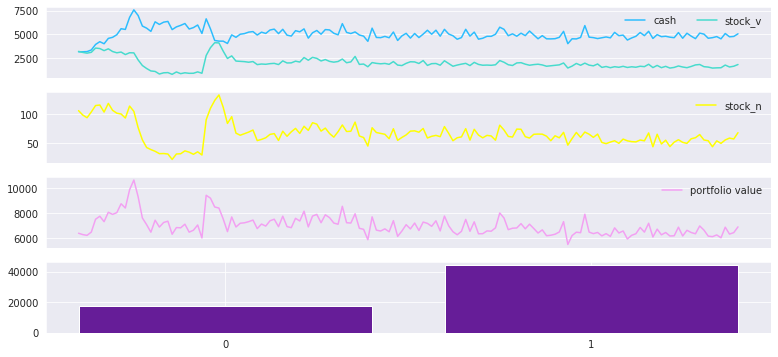

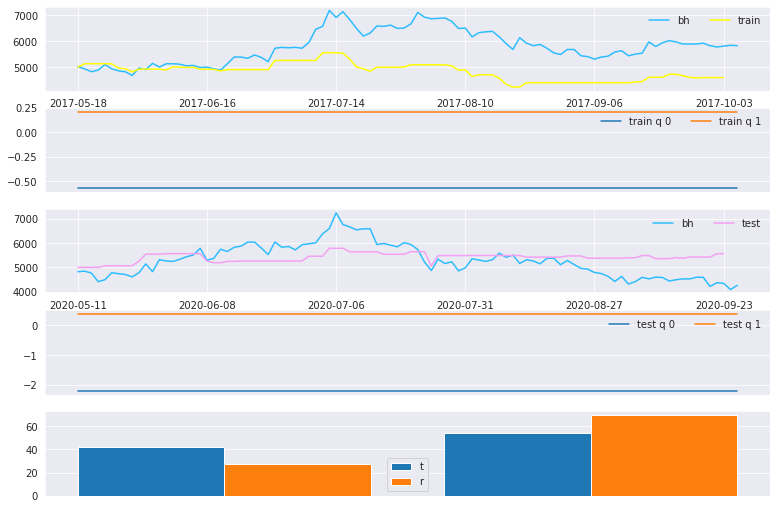

tensorboard
tensorboard
tensorboard
2020-09-30 01:00:56.233769
episode: 7949


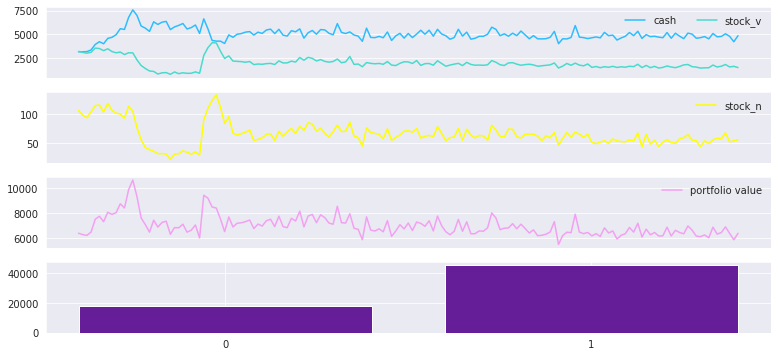

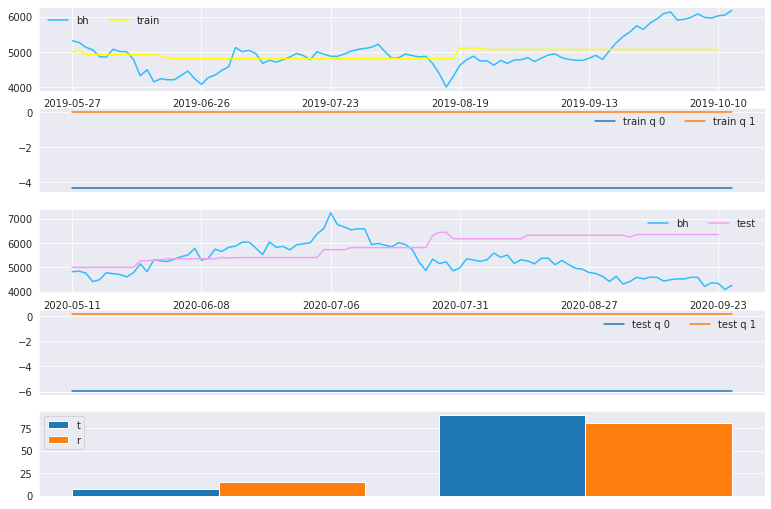

tensorboard
tensorboard
tensorboard
2020-09-30 01:12:48.553506
episode: 8099


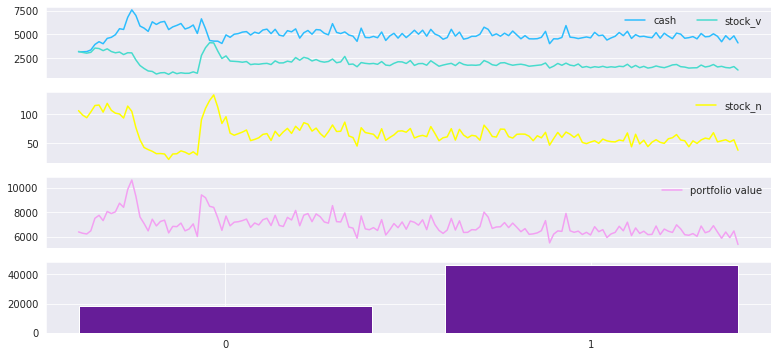

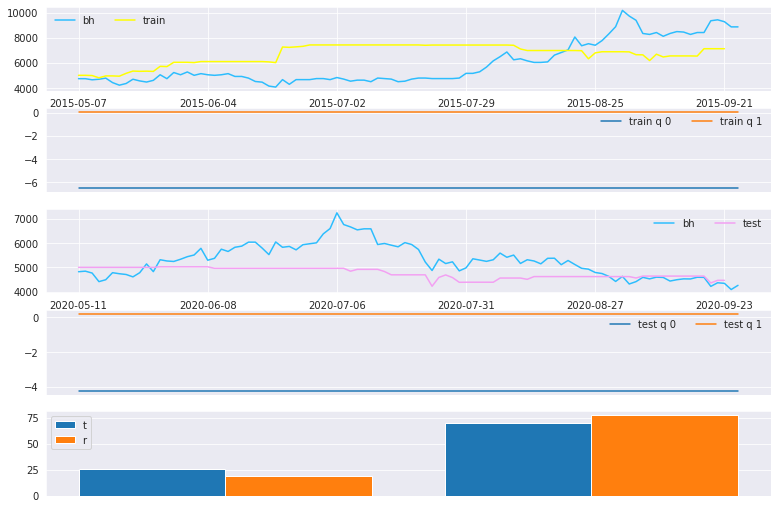

tensorboard
tensorboard
tensorboard
2020-09-30 01:24:42.679699
episode: 8249


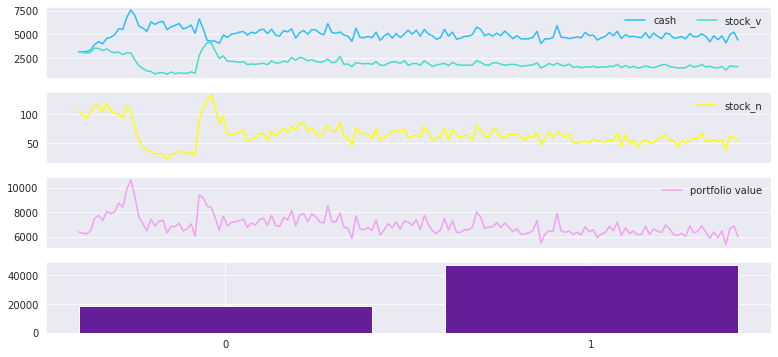

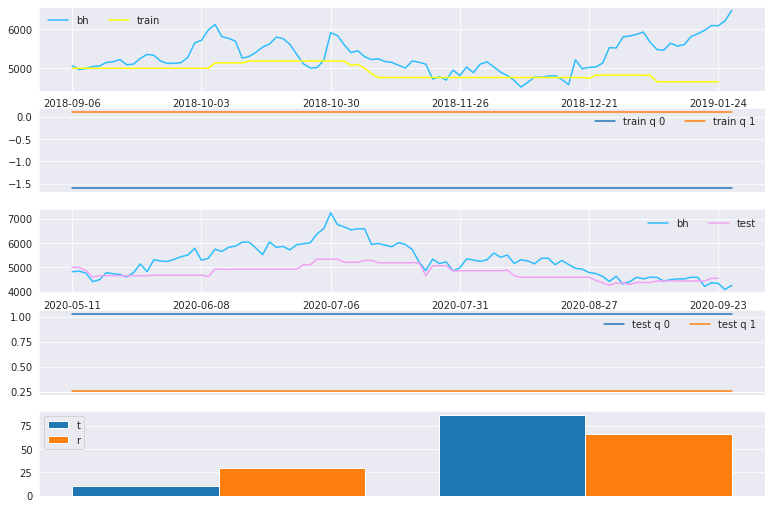

tensorboard
tensorboard
tensorboard
2020-09-30 01:36:34.694234
episode: 8399


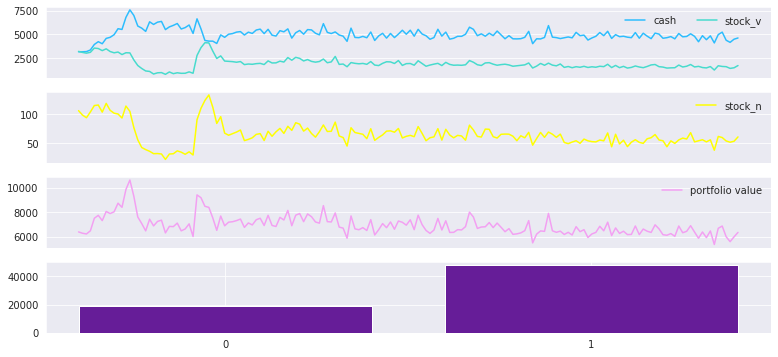

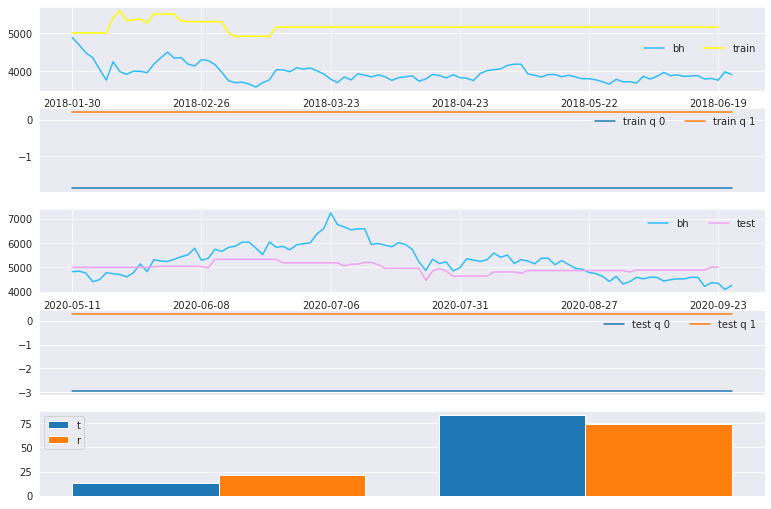

tensorboard
tensorboard
tensorboard
2020-09-30 01:48:23.443586
episode: 8549


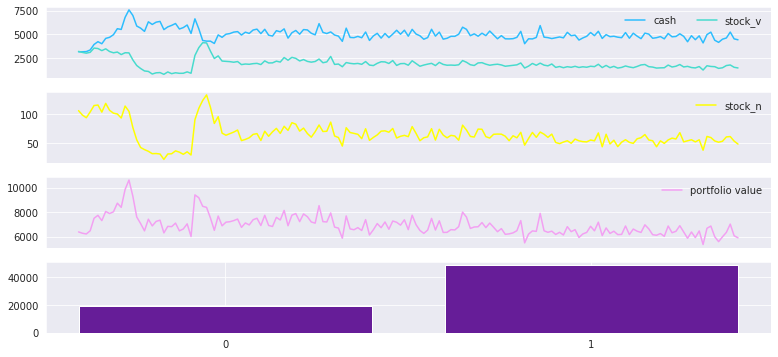

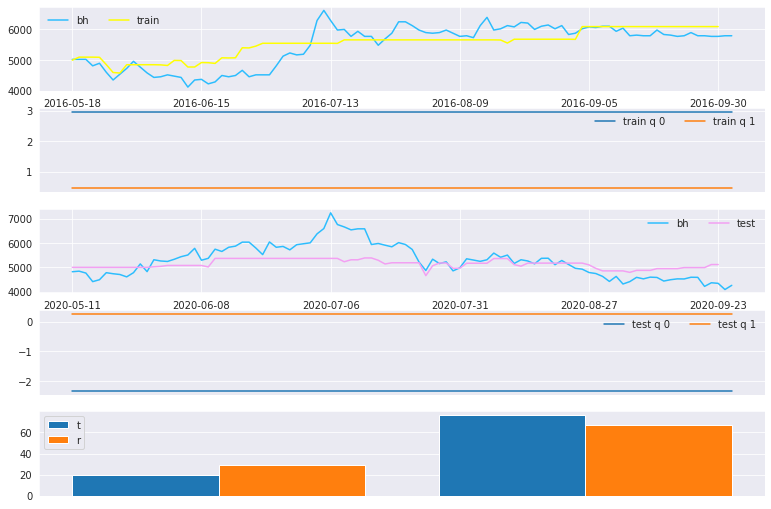

tensorboard
tensorboard
tensorboard
2020-09-30 02:00:17.996424
episode: 8699


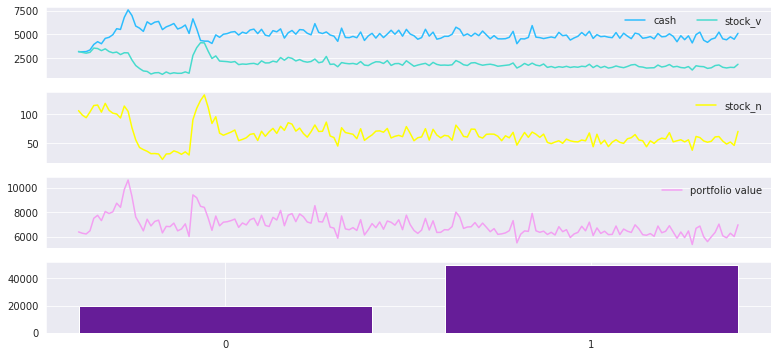

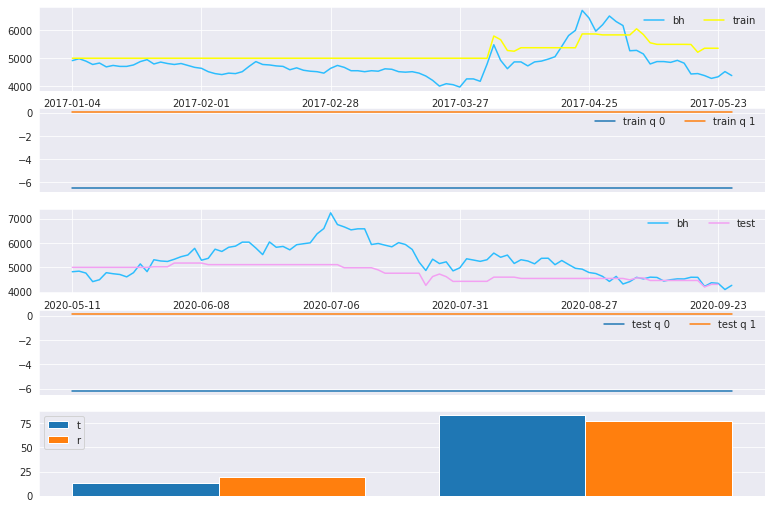

tensorboard
tensorboard
tensorboard
2020-09-30 02:12:16.528286
episode: 8849


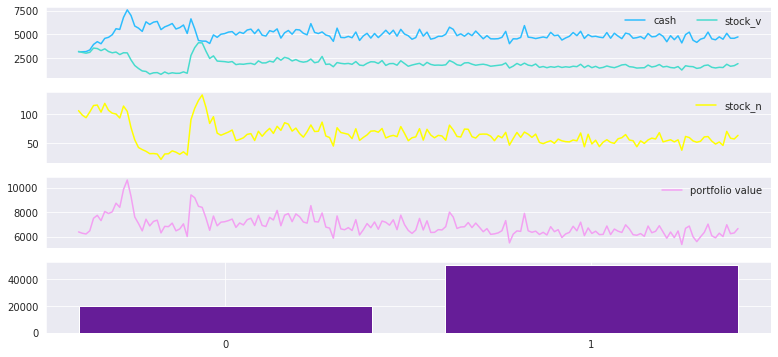

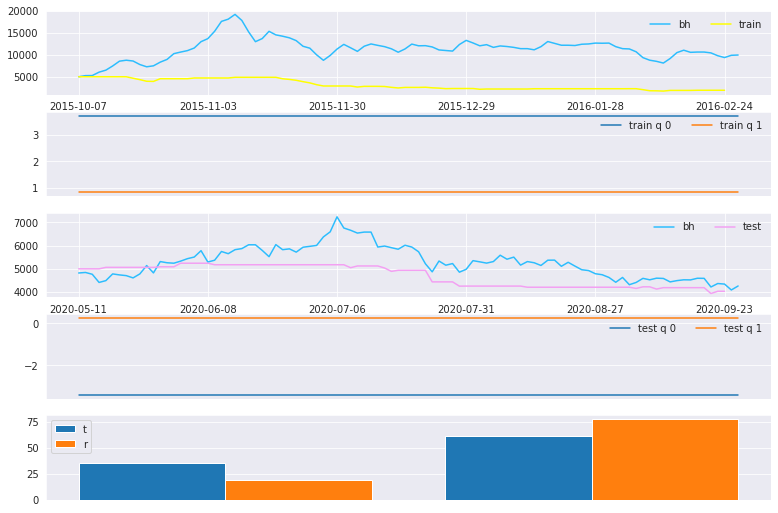

tensorboard
tensorboard
tensorboard
2020-09-30 02:24:11.691730
episode: 8999


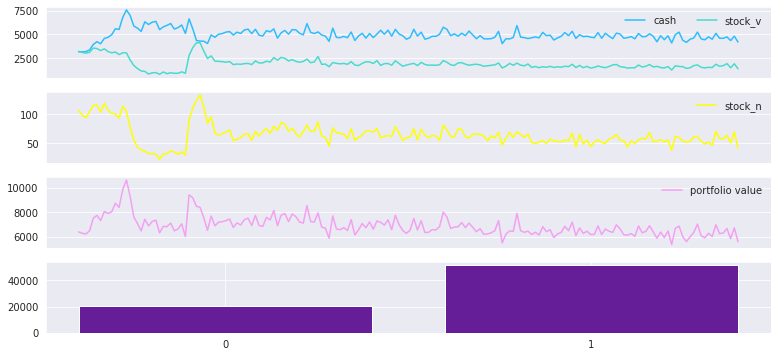

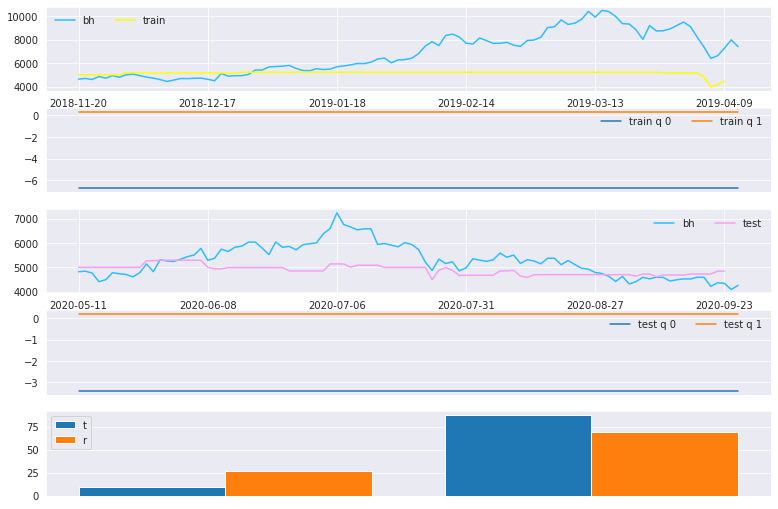

tensorboard
tensorboard
tensorboard
2020-09-30 02:36:03.057609
episode: 9149


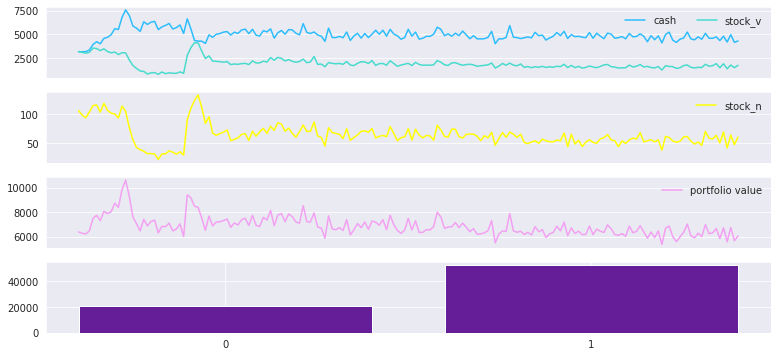

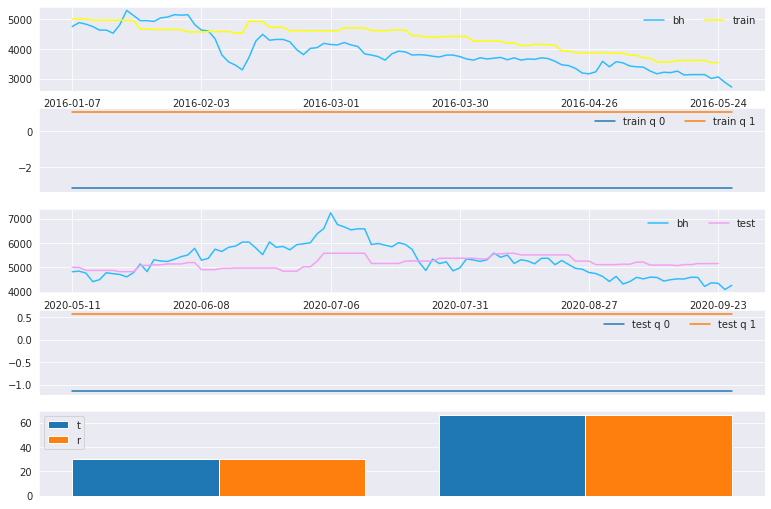

tensorboard
tensorboard
tensorboard
2020-09-30 02:48:00.153632
episode: 9299


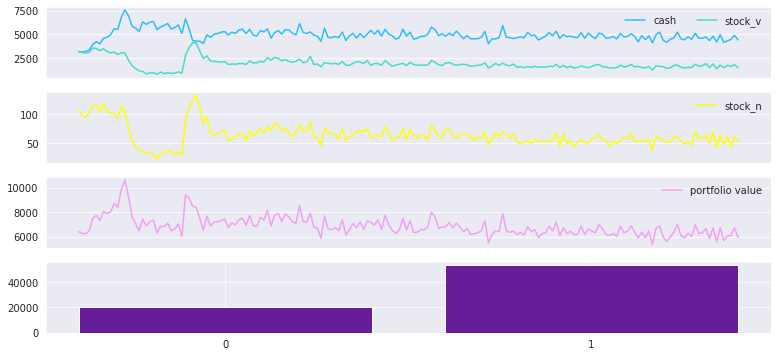

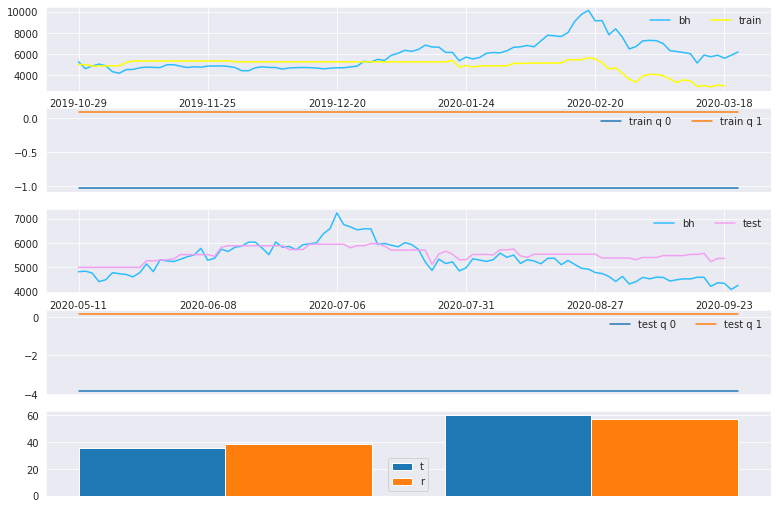

tensorboard
tensorboard
tensorboard
2020-09-30 02:59:56.470051
episode: 9449


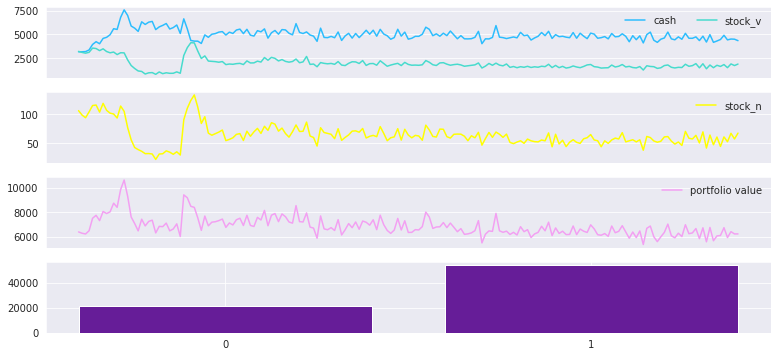

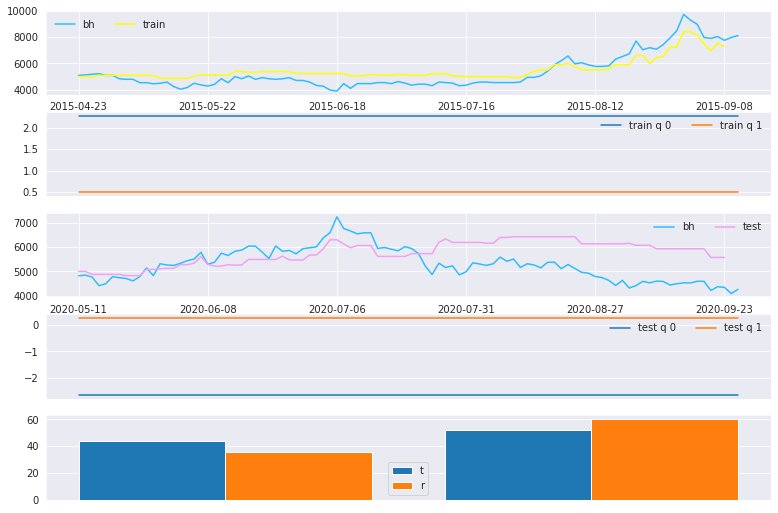

tensorboard
tensorboard
tensorboard
2020-09-30 03:11:49.930181
episode: 9599


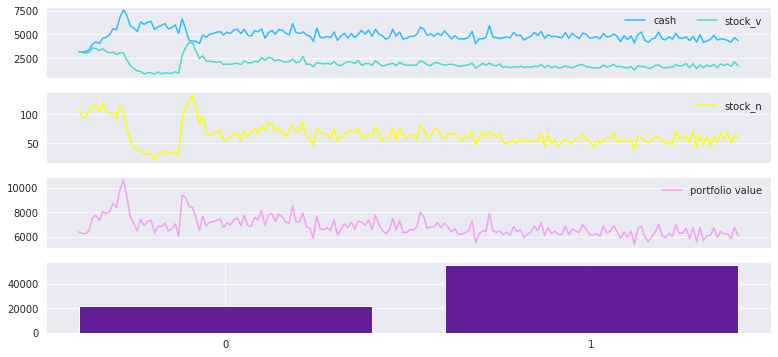

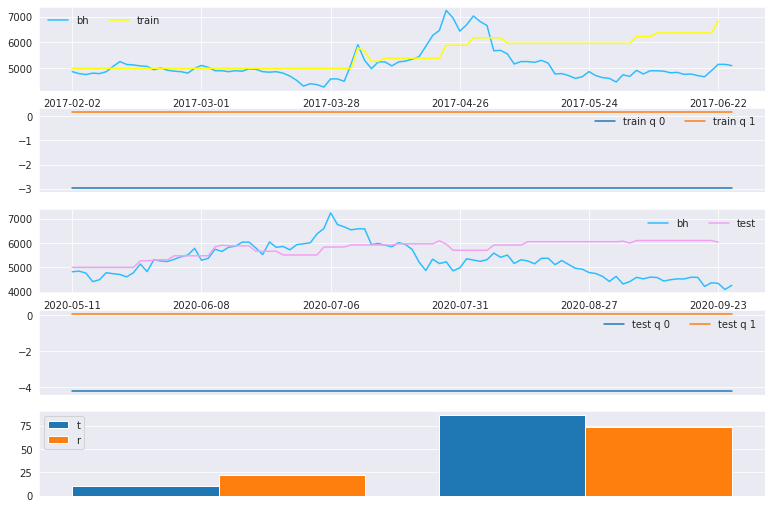

tensorboard
tensorboard
tensorboard
2020-09-30 03:23:47.725355
episode: 9749


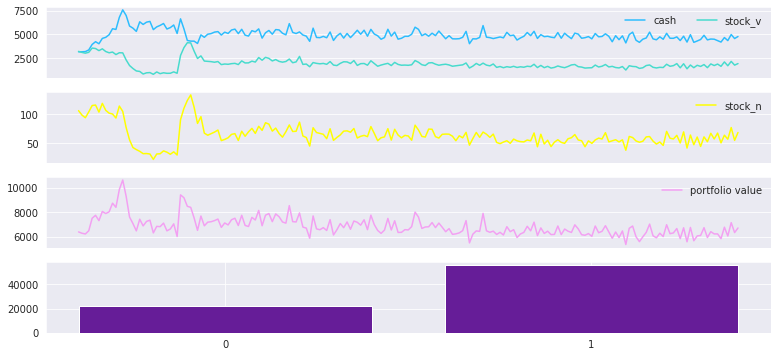

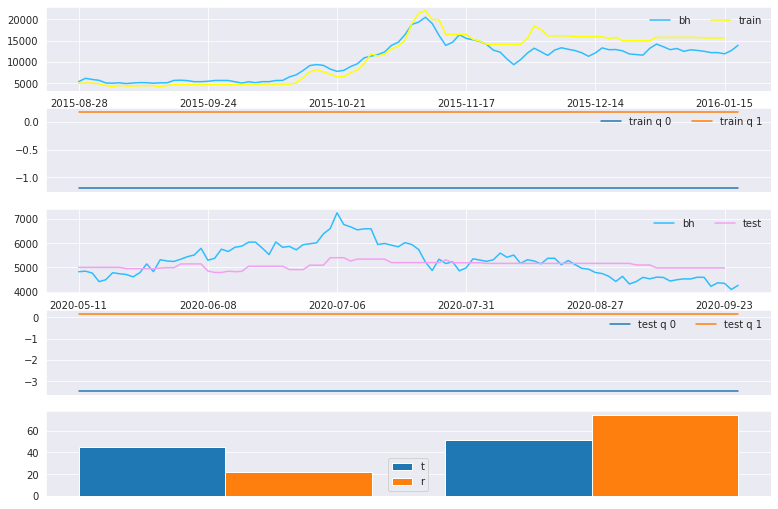

tensorboard
tensorboard
tensorboard
2020-09-30 03:35:46.506140
episode: 9899


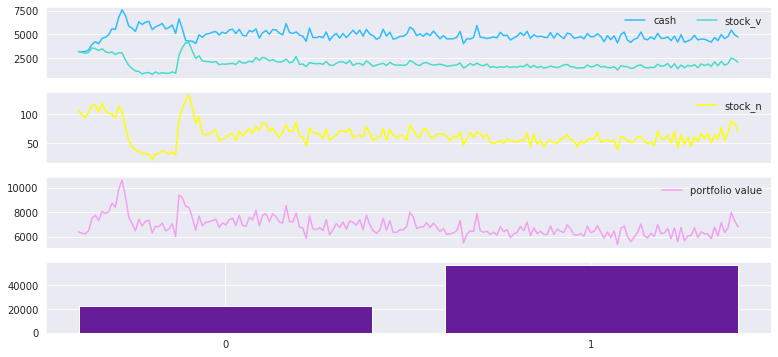

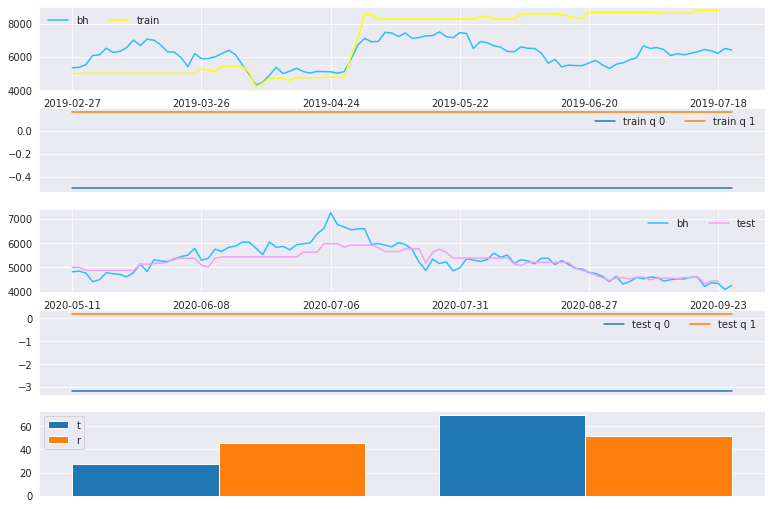

tensorboard
tensorboard
tensorboard
2020-09-30 03:47:43.322507
episode: 10049


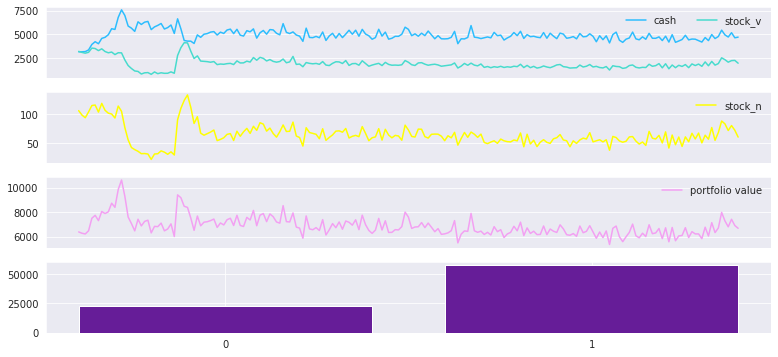

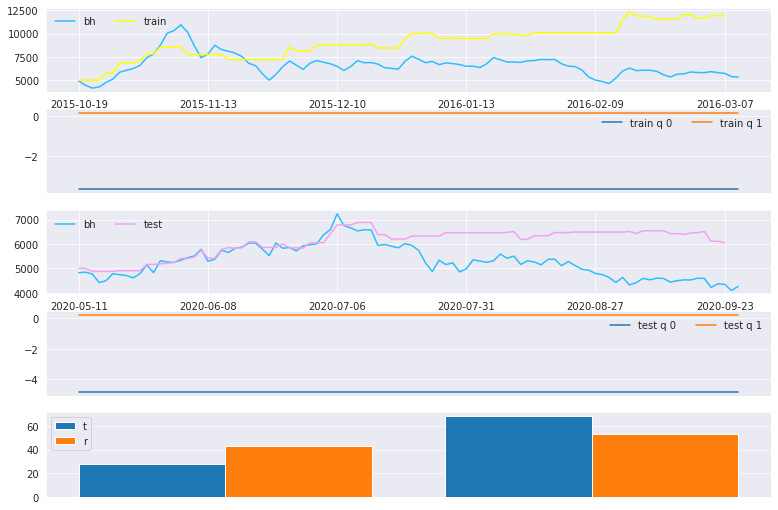

tensorboard
tensorboard
tensorboard
2020-09-30 03:59:43.850101
episode: 10199


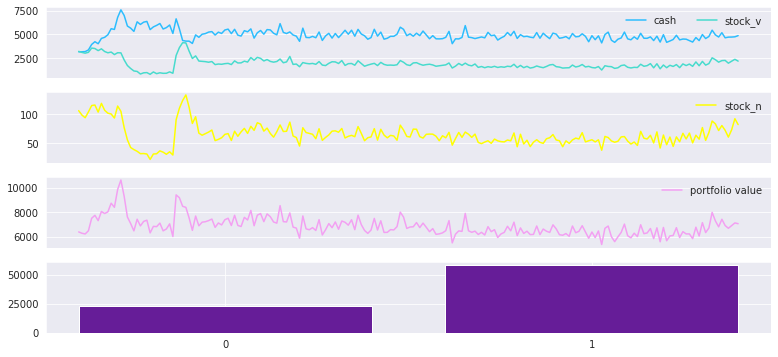

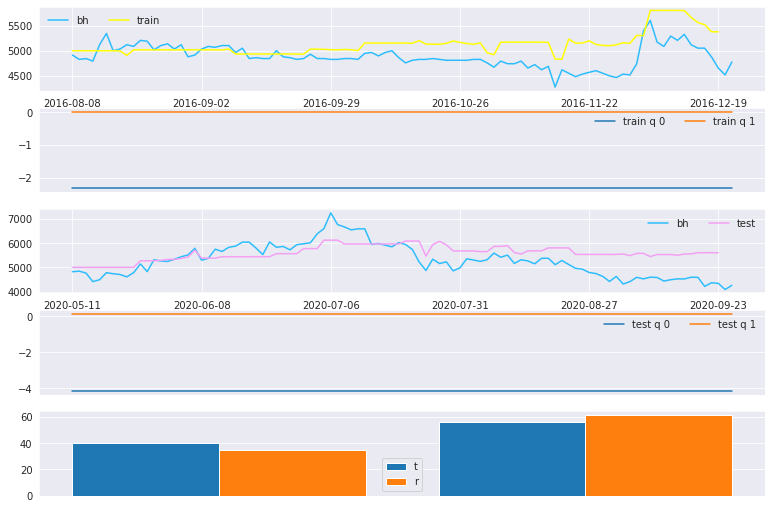

tensorboard
tensorboard
tensorboard
2020-09-30 04:11:41.051768
episode: 10349


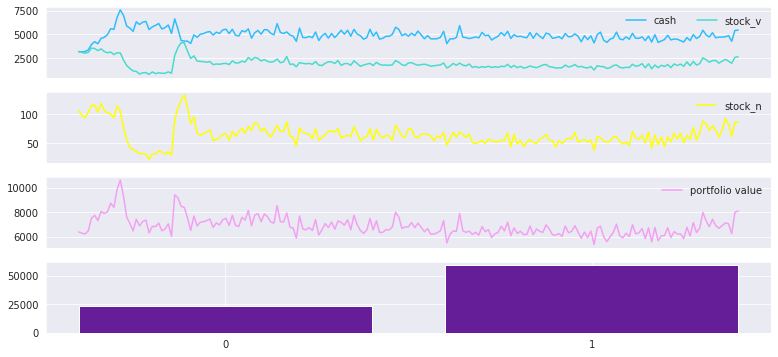

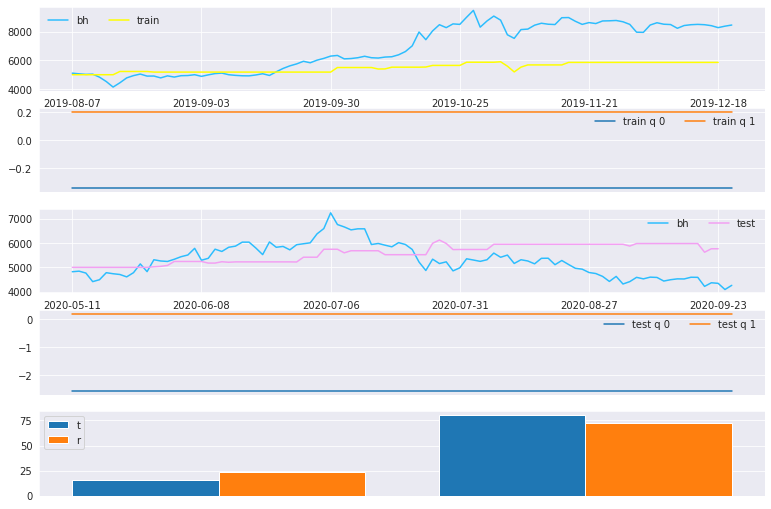

tensorboard
tensorboard
tensorboard
2020-09-30 04:23:44.681915
episode: 10499


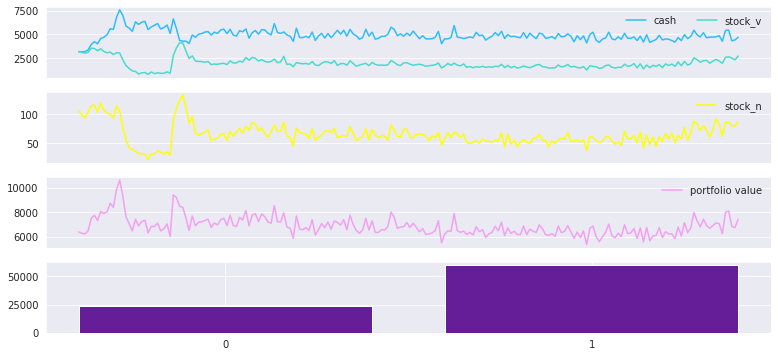

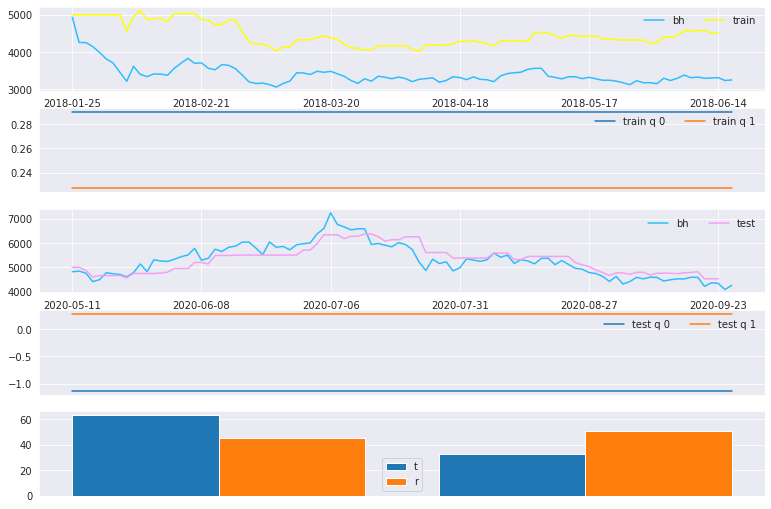

tensorboard
tensorboard
tensorboard
2020-09-30 04:35:45.238099
episode: 10649


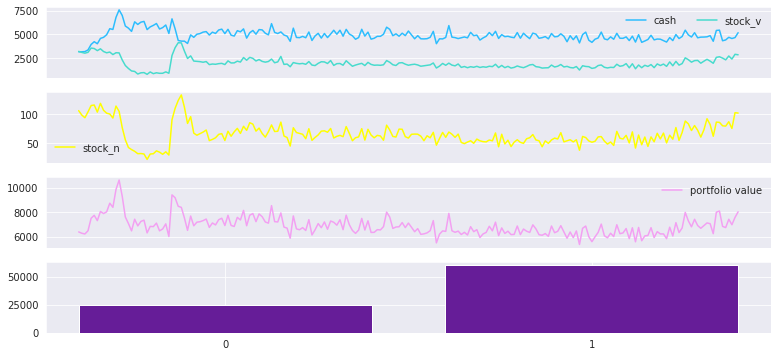

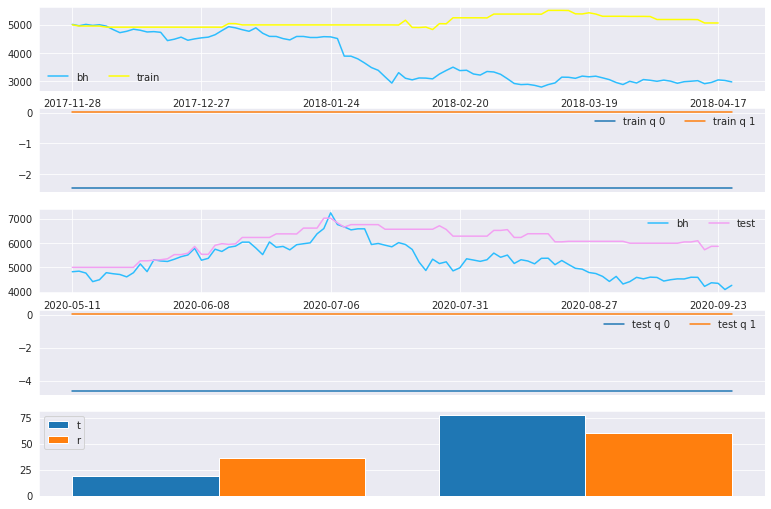

tensorboard
tensorboard
tensorboard
2020-09-30 04:47:42.649895
episode: 10799


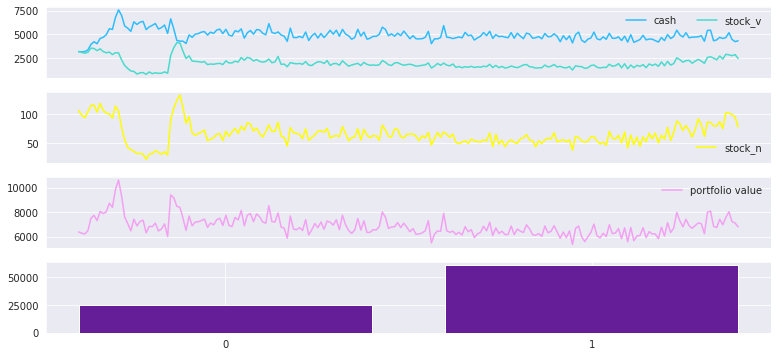

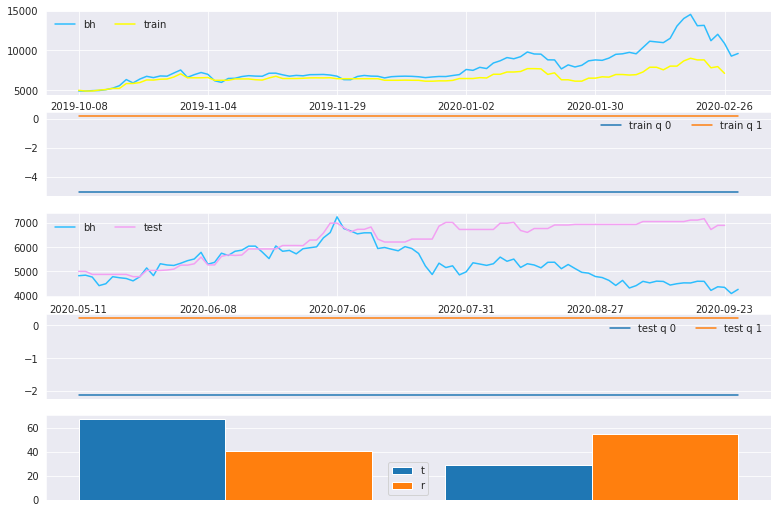

tensorboard
tensorboard
tensorboard
2020-09-30 04:59:46.187696
episode: 10949


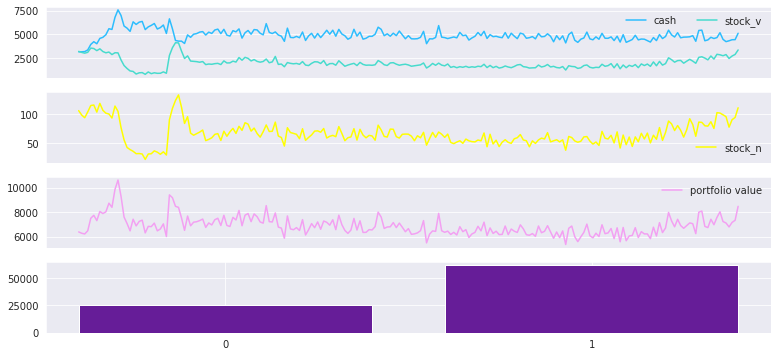

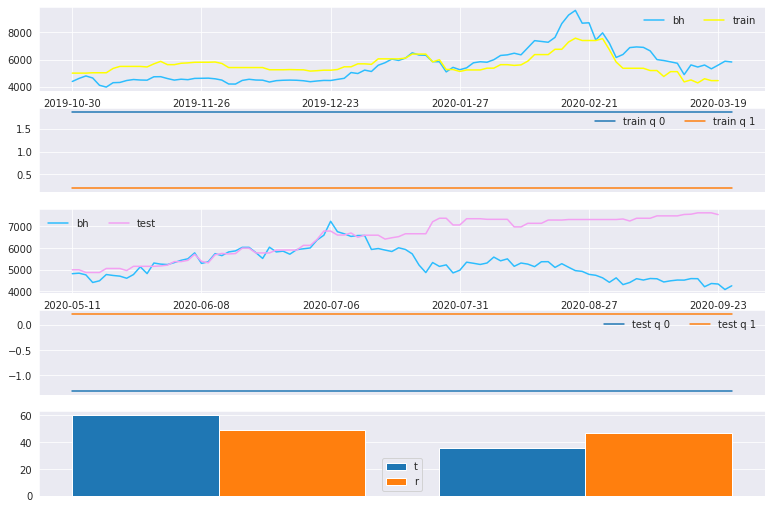

tensorboard
tensorboard
tensorboard
2020-09-30 05:11:46.079418
episode: 11099


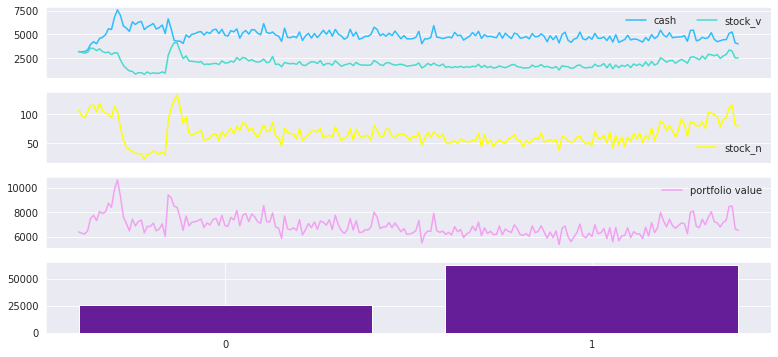

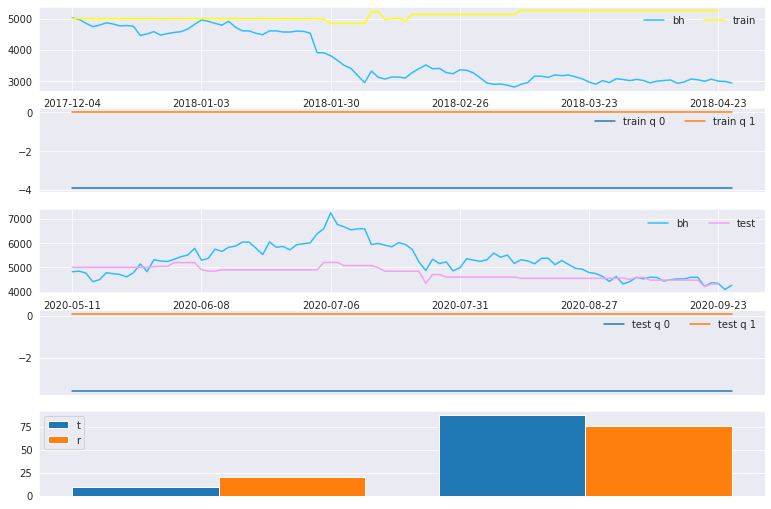

tensorboard
tensorboard
tensorboard
2020-09-30 05:23:46.992749
episode: 11249


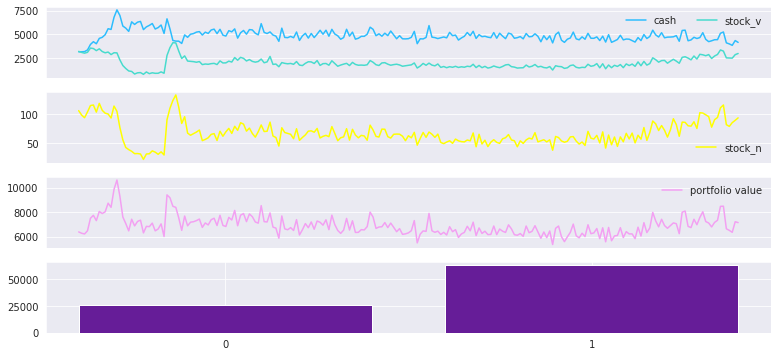

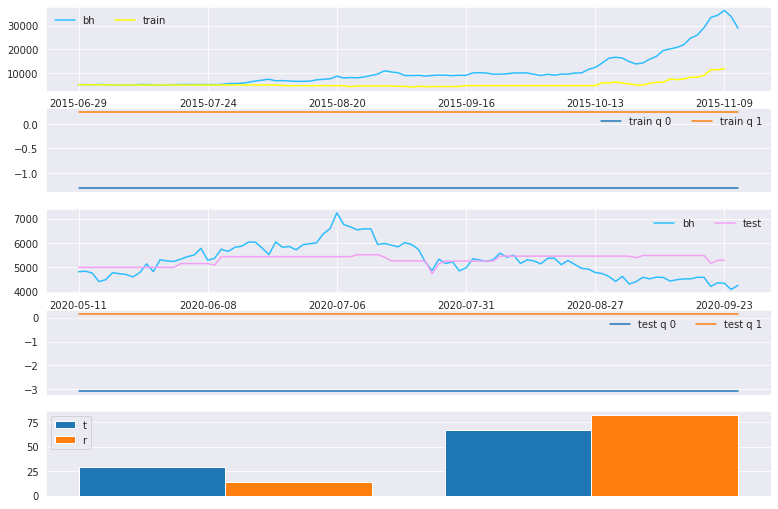

tensorboard
tensorboard
tensorboard
2020-09-30 05:35:49.759350
episode: 11399


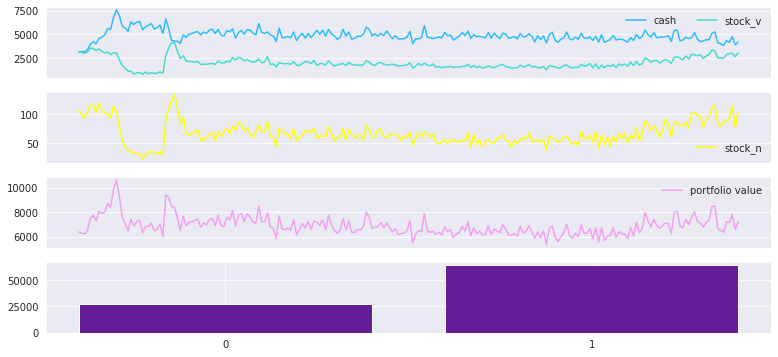

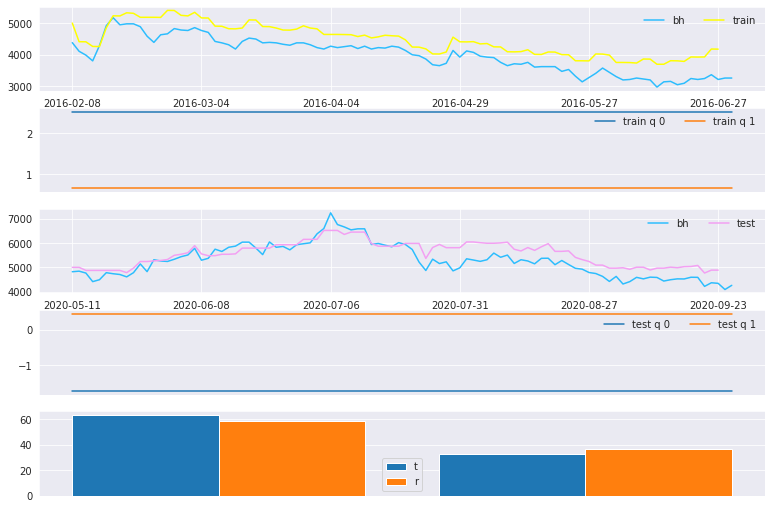

tensorboard
tensorboard
tensorboard
2020-09-30 05:47:50.185887
episode: 11549


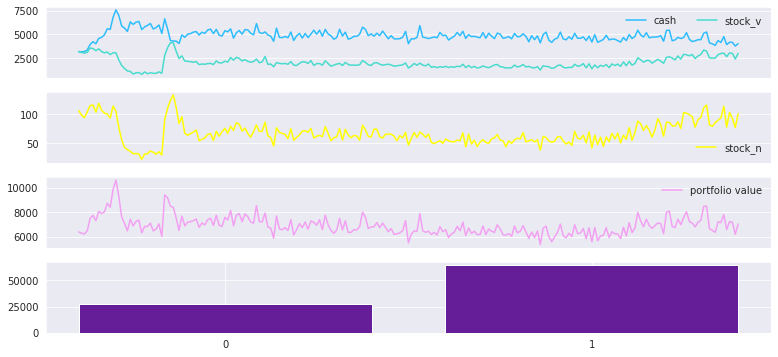

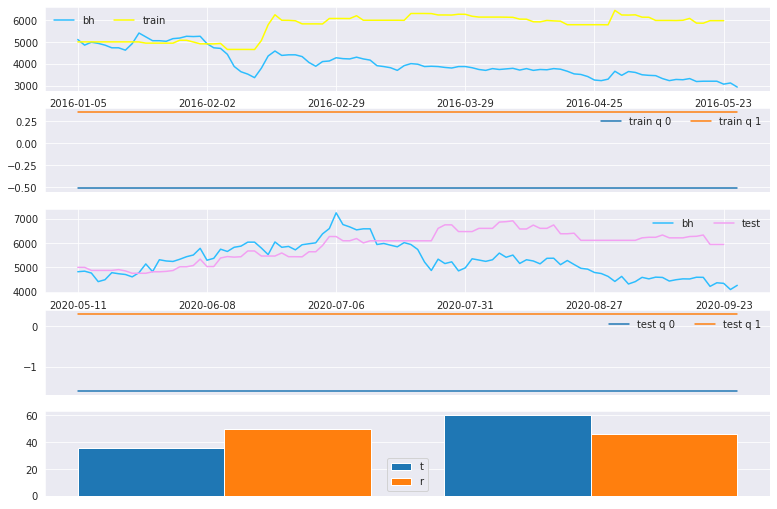

tensorboard
tensorboard
tensorboard
2020-09-30 05:59:55.258978
episode: 11699


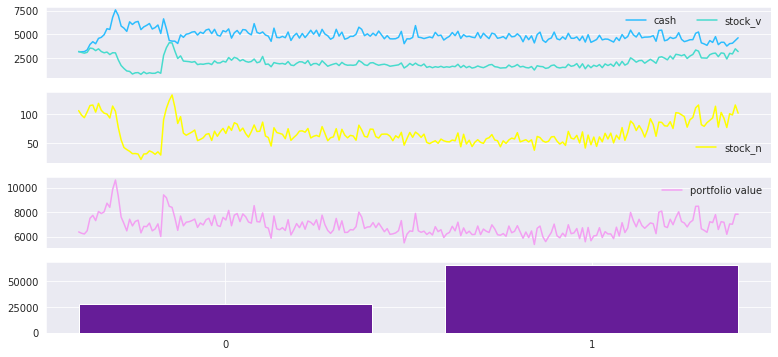

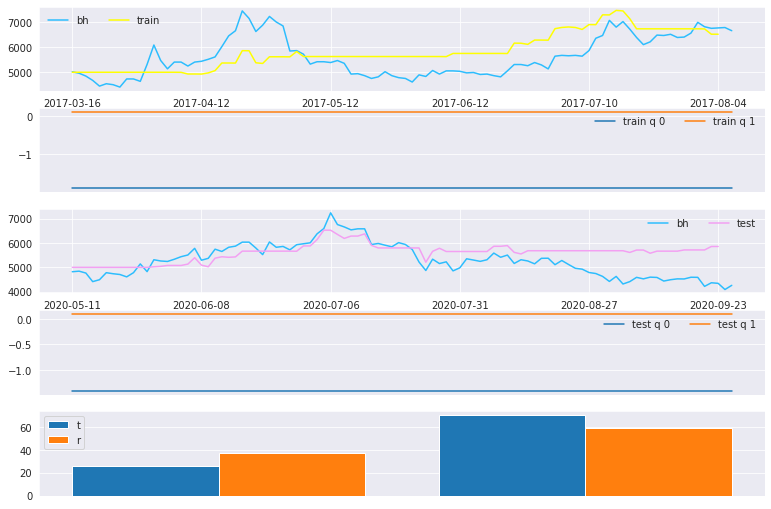

tensorboard
tensorboard
tensorboard
2020-09-30 06:11:55.182063
episode: 11849


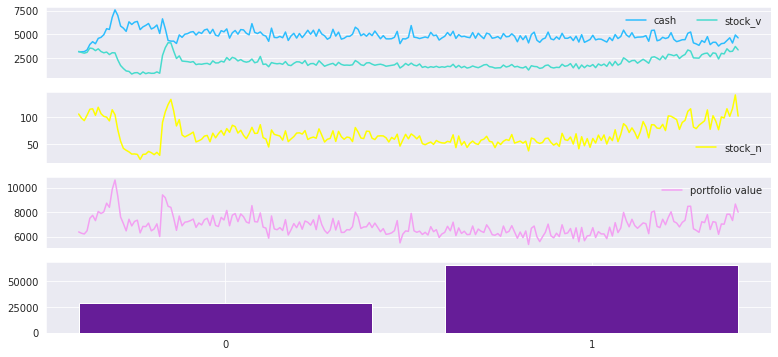

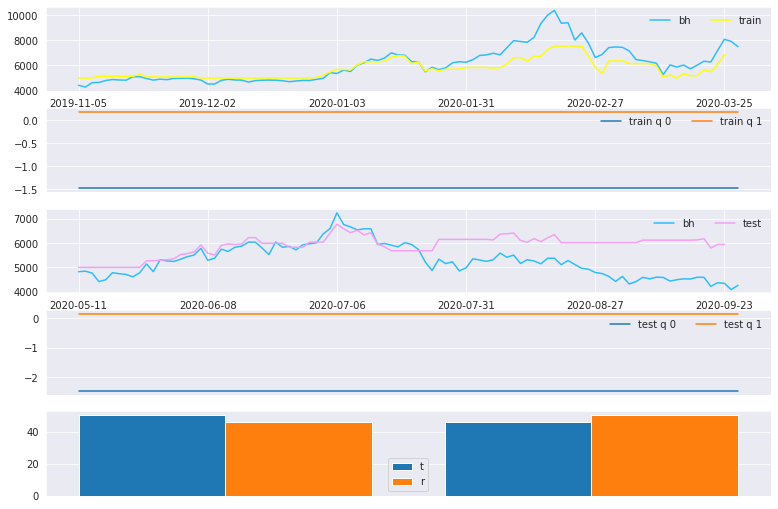

tensorboard
tensorboard
tensorboard
2020-09-30 06:23:59.052824
episode: 11999


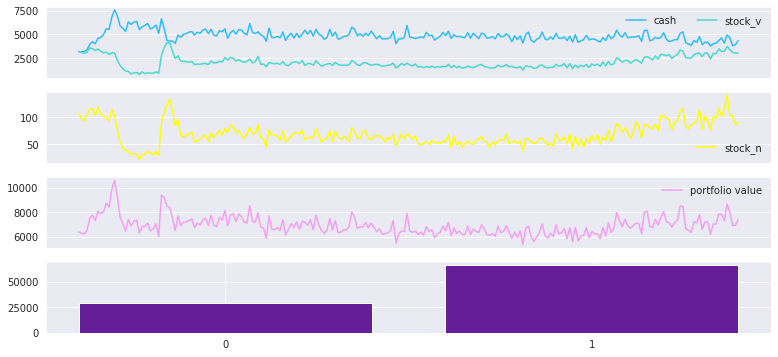

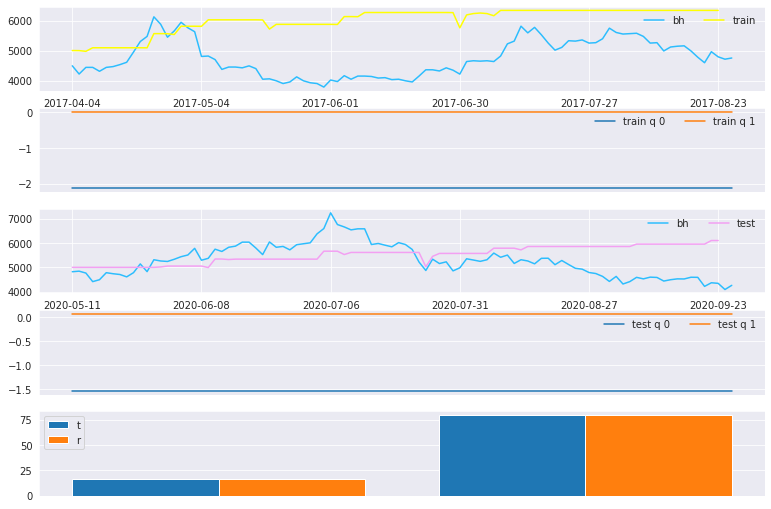

tensorboard
tensorboard
tensorboard
2020-09-30 06:36:01.942654
episode: 12149


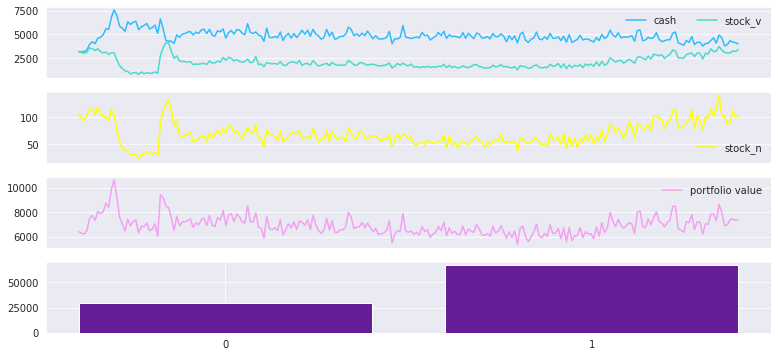

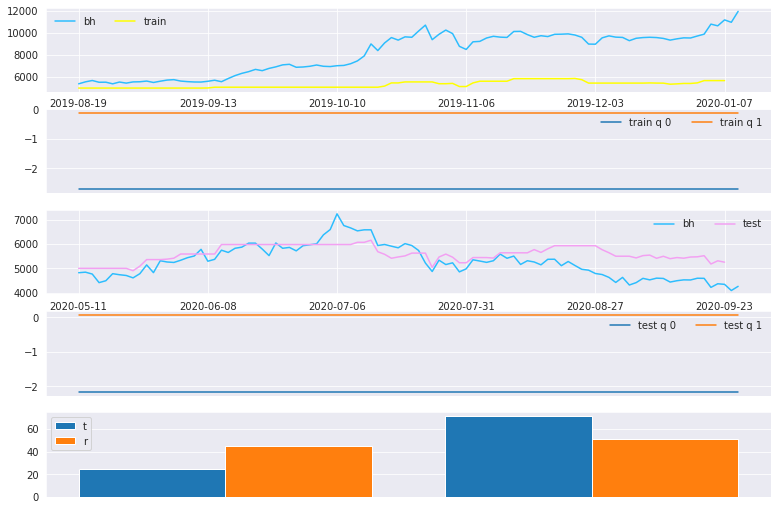

tensorboard
tensorboard
tensorboard
2020-09-30 06:48:05.475130
episode: 12299


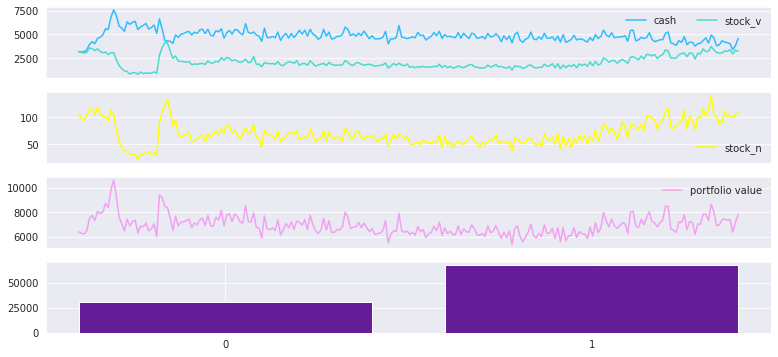

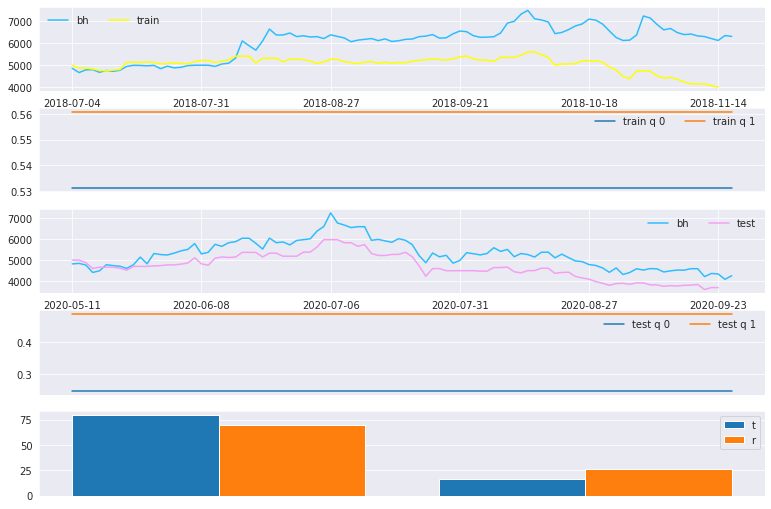

tensorboard
tensorboard
tensorboard
2020-09-30 07:00:08.934219
episode: 12449


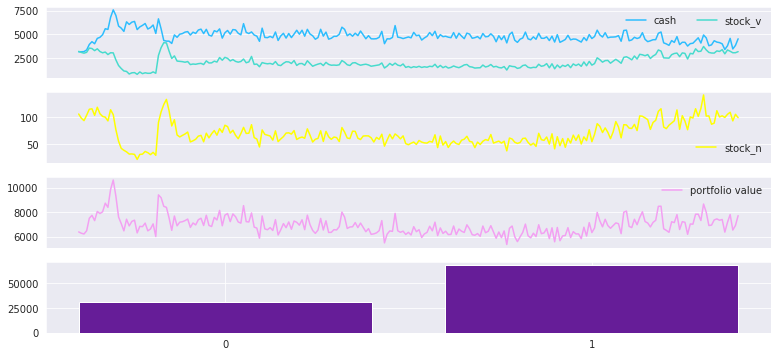

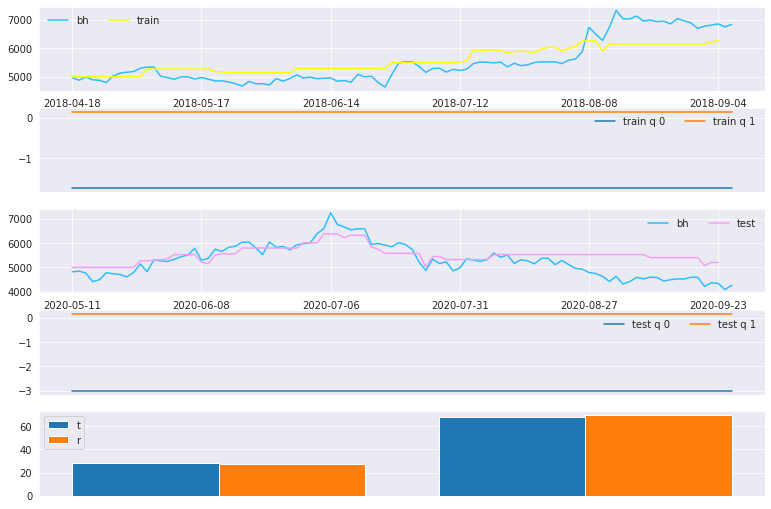

tensorboard
tensorboard
tensorboard
2020-09-30 07:12:12.415076
episode: 12599


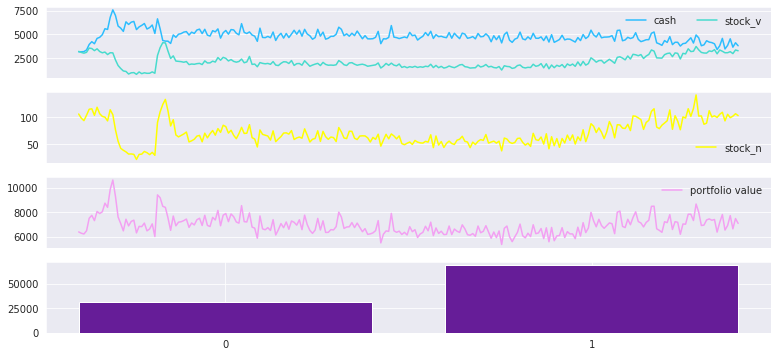

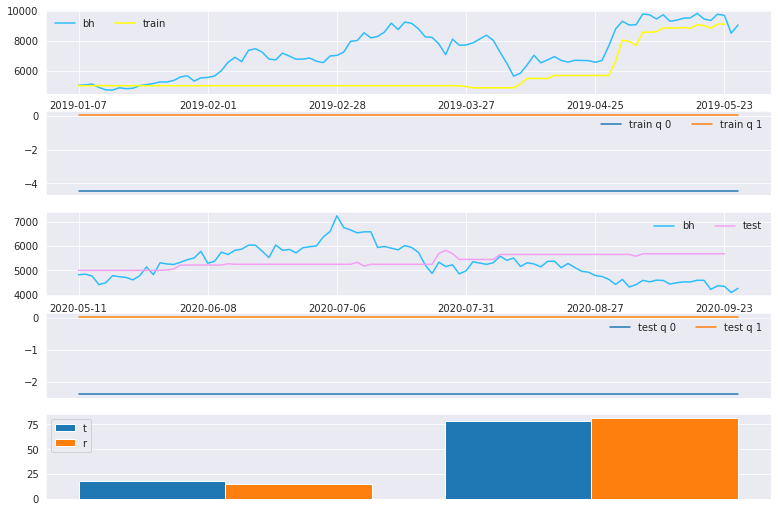

tensorboard
tensorboard
tensorboard
2020-09-30 07:24:13.792974
episode: 12749


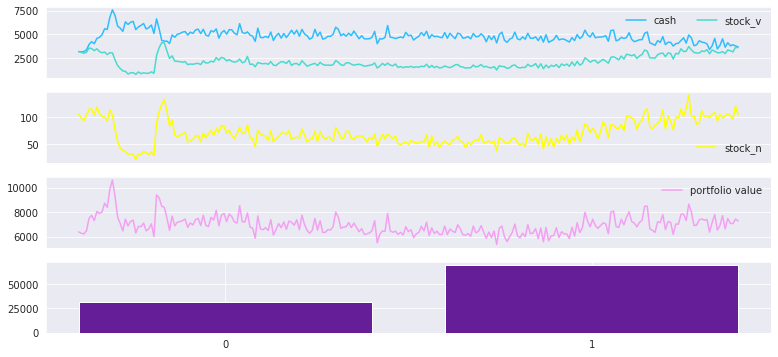

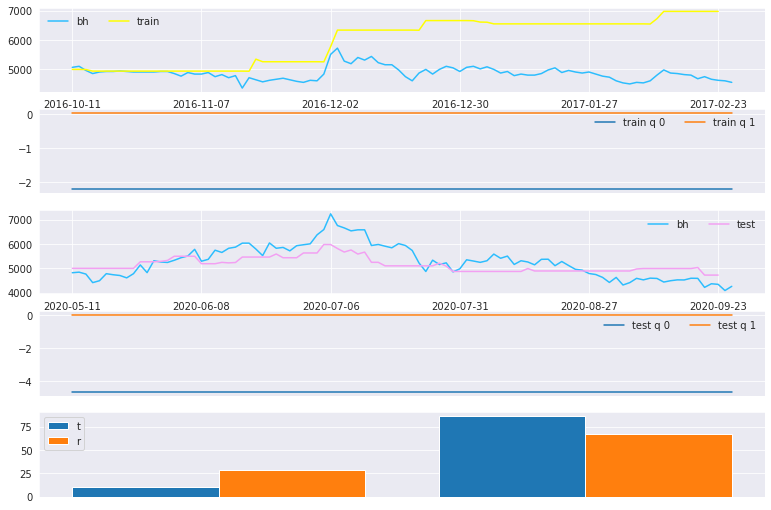

tensorboard
tensorboard
tensorboard
2020-09-30 07:36:18.238157
episode: 12899


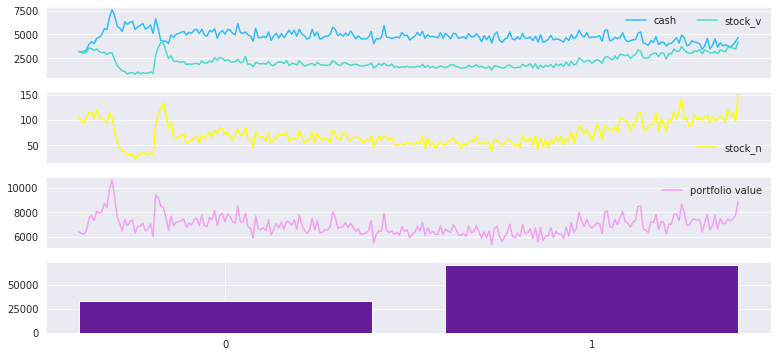

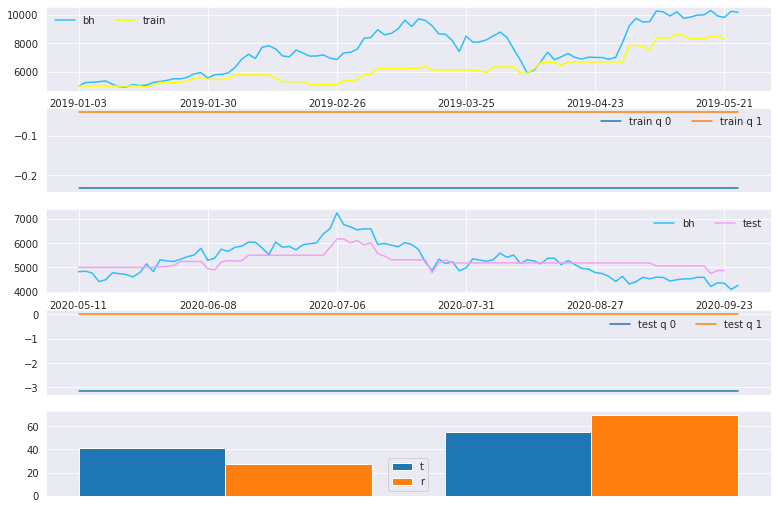

tensorboard
tensorboard
tensorboard
2020-09-30 07:48:22.641211
episode: 13049


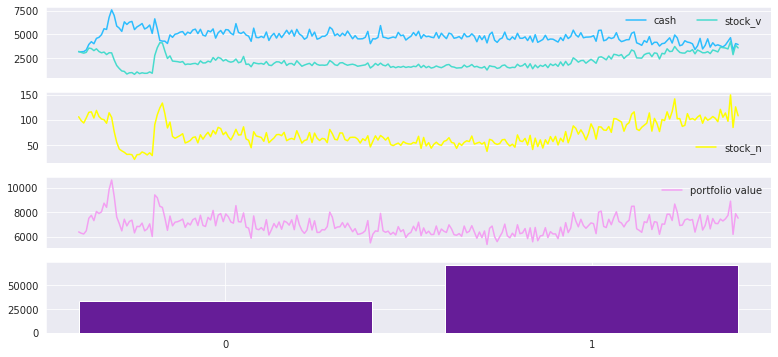

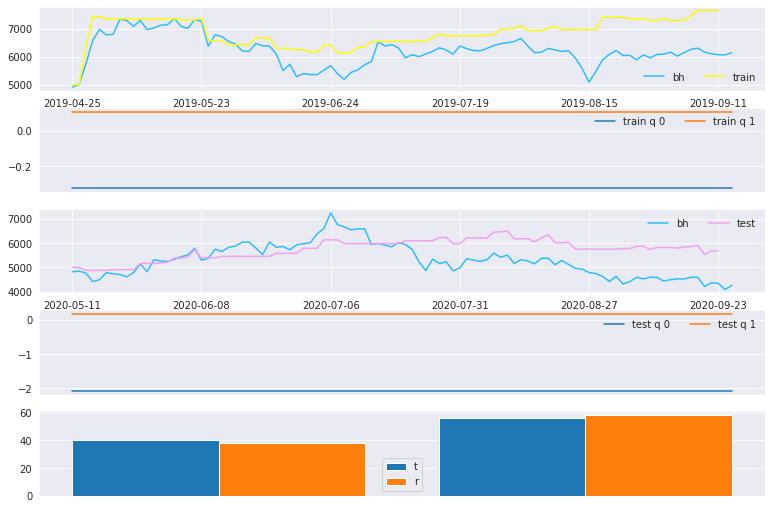

tensorboard
tensorboard
tensorboard
2020-09-30 08:00:31.506564
episode: 13199


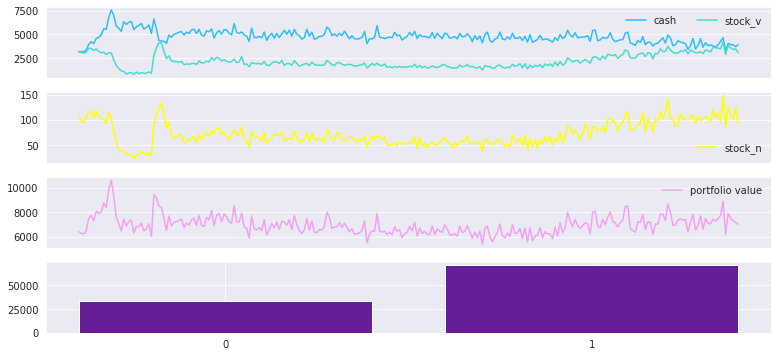

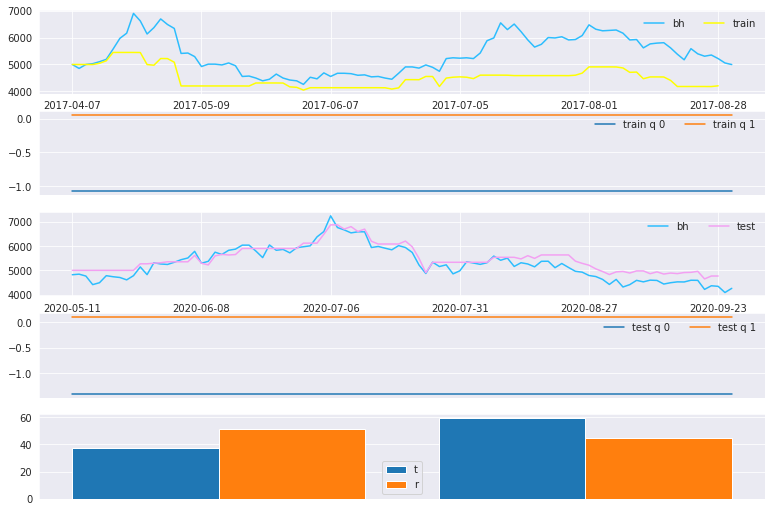

tensorboard
tensorboard
tensorboard
2020-09-30 08:14:08.405014
episode: 13349


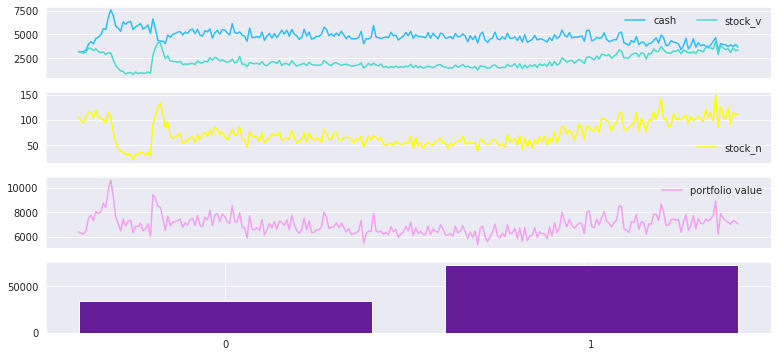

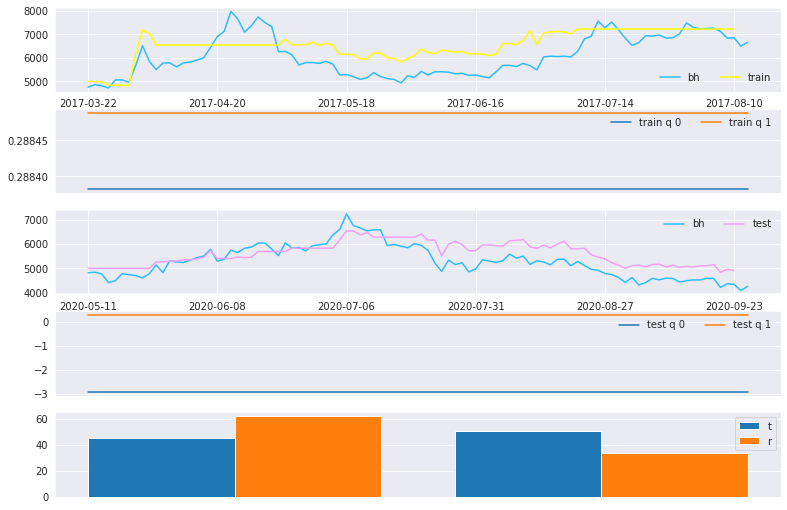

tensorboard
tensorboard
tensorboard
2020-09-30 08:28:34.414630
episode: 13499


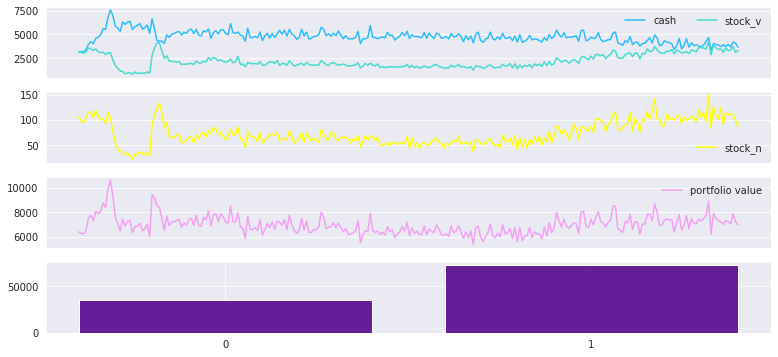

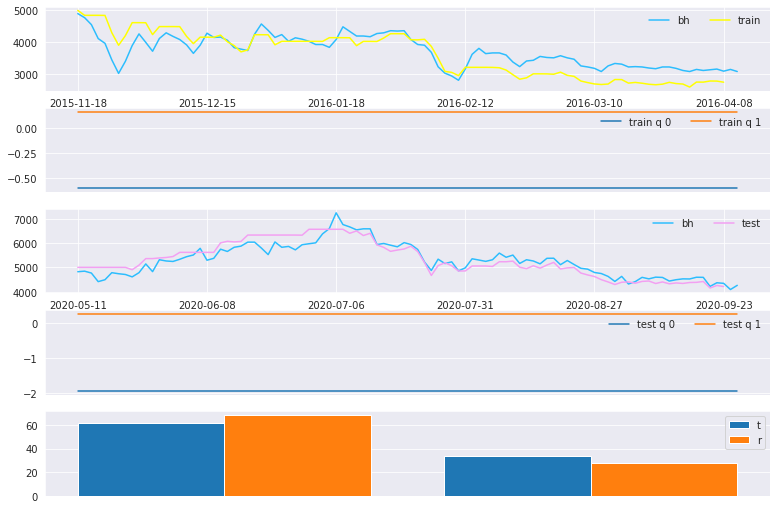

tensorboard
tensorboard
tensorboard
2020-09-30 08:42:43.764657
episode: 13649


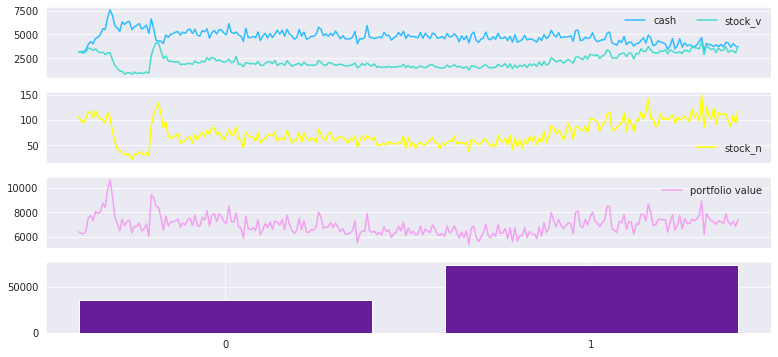

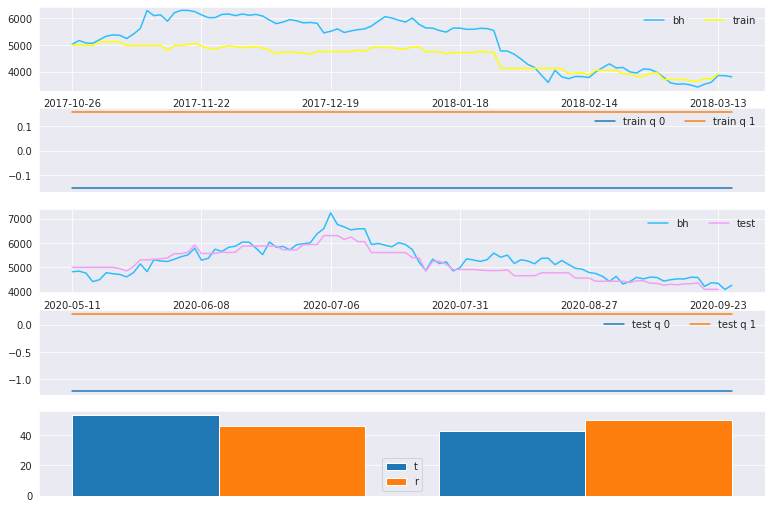

KeyboardInterrupt: 

In [7]:
if __name__ == '__main__':
    rl = TDQN(
         episodes=15000,
         steps=400,
         batchsize=32,
         alpha=1e-4,
         decay_rate=0.999995,
         gamma=0.5,
         hidden=200, #################static
         init_cash=5000,
         print_rate=100,
         num_a=2,
         mem_siz=500000,
         filename='PcellBasic_b',
         save=True, 
         load=False,
         get_output=True,
         w_updates=1000,
         inf=True,
         min_mem=0.01,
         log_freq=300,
         clip=10., #####no clip
         auc_rate=False,
         run=1 ################ remember to change run
    )
    rl.train()